In [1]:
"""
State estimation and parameter estimation for the 2-layer QG system with only surface observations (hidden flow states and unknown topography)
"""

import matplotlib.pyplot as plt
import numpy as np
# from matplotlib.ticker import FormatStrFormatter
# from matplotlib.gridspec import GridSpec
# from scipy.stats import gaussian_kde, norm
# from Lagrangian_tracer import Lagrange_tracer_model
# from conj_symm_tools import verify_conjugate_symmetry, find_non_conjugate_pairs, avg_conj_symm, map_conj_symm
# from Lagrangian_DA import Lagrangian_DA_OU, Lagrangian_DA_CG, mu2psi, mu2layer, R2layer, relative_entropy_psi_k
# from ene_spectrum import ene_spectrum, adjust_ik, trunc2full
# from LSM_QG import solve_eigen, calibrate_OU, run_OU, eigen2layer, layer2eigen, growth_rate
# from mode_truc import inv_truncate, truncate
# from plot import ifftncheck, psi2q, plot_contour_fields, plot_psi_k_seriespdf, plot_layer_seriespdf, plot_psi1_k_seriespdf, plot_mses, loop_ifft2_var, ifft2_var, plot_mog, plot_mog_k, scatterplot, calculate_skewness_kurtosis
# from statsmodels.tsa.stattools import acf, ccf
# from scipy.optimize import curve_fit
# from scipy.io import loadmat
# from scipy import sparse
# import h5py
# from time import time
# from CGKN4QG_physics import unit2xy

def unit2xy(xy_unit):
    if xy_unit.shape[-1] == 4:
        cos0 = xy_unit[..., 0]
        sin0 = xy_unit[..., 1]
        cos1 = xy_unit[..., 2]
        sin1 = xy_unit[..., 3]
    else:
        cos0 = xy_unit[..., ::4]
        sin0 = xy_unit[..., 1::4]
        cos1 = xy_unit[..., 2::4]
        sin1 = xy_unit[..., 3::4]

    # Recover the angles
    angle0 = np.arctan2(sin0, cos0)
    angle1 = np.arctan2(sin1, cos1)
    
    # Ensure angles are in [0, 2π)
    x = np.mod(angle0, 2 * np.pi)
    y = np.mod(angle1, 2 * np.pi)
    
    # Reconstruct the original pos
    xy = np.stack([x, y], axis=-1)

    return xy
    
# fix the random seed
np.random.seed(0)


# Discrete-Continuous

## LSMs

### LSMs of eigenmodes (correlated noise)

In [2]:
data = np.load('../data/qg_data_sigmaxy01_t2000.npz')
kd = data['kd'].item()
kb = data['kb'].item()
U = data['U'].item()
kappa = data['r'].item()
H = data['H'].item()
nu = data['nu'].item()
dt = data['dt'].item()
L = data['L'].item()
dt_obs = data['dt_ob'].item()
psi_noisy = data['psi_noisy']
# psi_truth = data['psi_truth']
beta = kb**2

K = 64
train_size = 40000
psi_noisy = psi_noisy[:train_size]

In [84]:
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)
dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography

In [10]:
train_size = 40000
psi_noisy = psi_noisy[:train_size]
psi_noisy.shape

(40000, 64, 64, 2)

In [46]:
psi1_k_t = np.fft.fft2(psi_noisy[..., 0].transpose((1,2,0)), axes=(0,1))
psi2_k_t = np.fft.fft2(psi_noisy[..., 1].transpose((1,2,0)), axes=(0,1))

In [12]:
# truncate parameter
r_cut = 16
style = 'circle'

In [28]:
from LSM_QG import solve_eigen, calibrate_OU, run_OU, eigen2layer, layer2eigen
# Compute eigenvalues and eigenvectors
eigens = solve_eigen(K, beta, kd, U)
omega1 = eigens['omega1']
omega2 = eigens['omega2']
r1 = eigens['r1']
r2 = eigens['r2']

np.savez('../data/eigens.npz', **eigens)
np.where(np.isnan(r1))

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [47]:
# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)

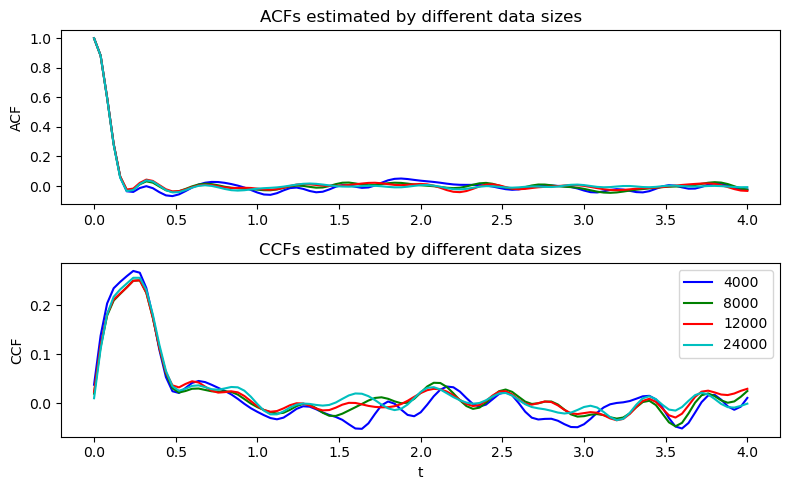

In [49]:
from statsmodels.tsa.stattools import acf, ccf
# Vary the amount of data used to estimate ACF    
def cf_eigen(psi1_hat_t, psi2_hat_t, r1, r2, ikx, iky, Lag):
    eigenmat_inv = np.linalg.inv(np.array([r1[iky,ikx,:],r2[iky,ikx,:]]).T)
    eigenmode = eigenmat_inv @ np.array([psi1_hat_t[iky,ikx,:],psi2_hat_t[iky,ikx,:]])
    psi1_hat = eigenmode[0,:] 
    psi2_hat = eigenmode[1,:]
    acf_psi1 = acf(np.real(psi1_hat), nlags=Lag, fft=True)  # ACF of the real part
    acf_psi2 = acf(np.real(psi2_hat), nlags=Lag, fft=True)  # ACF of the real part
    ccf_psi1 = -ccf(np.real(psi1_hat), np.imag(psi1_hat), adjusted=False)[:Lag+1]  # cross-correlation between the real and imaginary parts 
    ccf_psi2 = -ccf(np.real(psi2_hat), np.imag(psi2_hat), adjusted=False)[:Lag+1]  # cross-correlation between the real and imaginary parts
    
    return acf_psi1, acf_psi2, ccf_psi1, ccf_psi2

nums = [4000, 8000, 12000, 24000]
Lag = 100  # lag for computing the ACF
tt = np.linspace(0, Lag*dt_ob, num=Lag+1, endpoint=True) # time interval to plot the ACF or cross-correlation function
acf_psi = np.zeros((Lag+1,len(nums)))
acf_tau = np.zeros((Lag+1,len(nums)))
ccf_psi = np.zeros((Lag+1,len(nums)))
ccf_tau = np.zeros((Lag+1,len(nums)))

ikx = 3; iky = 0;
for inum,num in enumerate(nums):
    acf_psi[:,inum], acf_tau[:,inum], ccf_psi[:,inum], ccf_tau[:,inum] = cf_eigen(psi1_k_t[:,:,:num+Lag], psi2_k_t[:,:,:num+Lag], r1, r2, ikx, iky, Lag)
    
plt.figure(figsize=(8, 5))  # Set the figure size (optional)
colors = ['b', 'g', 'r', 'c','k']  # Colors for different lines
labels = [f'{num}' for num in nums]  # Labels for the legend

plt.subplot(2, 1, 1)
for i in range(len(nums)):
    plt.plot(tt, acf_psi[:, i], color=colors[i], label=labels[i])
plt.ylabel('ACF')
plt.title('ACFs estimated by different data sizes')

plt.subplot(2, 1, 2)
for i in range(len(nums)):
    plt.plot(tt, ccf_psi[:, i], color=colors[i], label=labels[i])
plt.xlabel('t')
plt.ylabel('CCF')
plt.title('CCFs estimated by different data sizes')
plt.legend()
plt.tight_layout()
# plt.savefig('../figure/acf_ccf.png')
plt.show()

In [135]:
from LSM_QG import calibrate_OU
est_params = calibrate_OU(r1, psi_k_t, tau_k_t, K, dt_obs, Lag=100, r_cut=r_cut, style=style, corr_noise=True)
gamma_est = est_params['gamma']
omega_est_ccf = est_params['omega_ccf']
omega_est_acf = est_params['omega_acf']
omega_est = est_params['omega']
f_est = est_params['f']
# # sigma_est = est_params['sigma']
sigma_cn = est_params['sigma']
cov_cn = est_params['cov']

np.savez('../data/est_paras_lsmcorr.npz', **est_params)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/LSM_QG.py:123: OptimizeWarning: Covariance of the parameters could not be estimated
  x1, _ = curve_fit(ACF, tt, acf_psi, p0=x0, check_finite=True, maxfev=2000)
/grad/wang3262/Proj_2_DAnPE_CGKN/code/LSM_QG.py:191: RuntimeWarning: invalid value encountered in divide
  pre2 = np.sqrt((f1 + f2 - 2 * pre1) / ((f1 - f2)**2 + 8*(f3**2 + f4**2)))


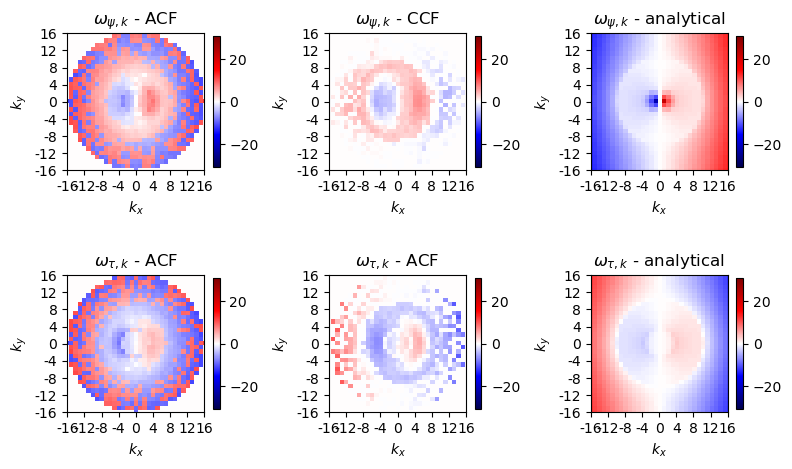

In [62]:
# Plot modes of omega
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,5))

dataplot = np.zeros((K,K,nrow, ncol))
dataplot[:,:,0,0] = omega_est[:,:,0]
dataplot[:,:,0,1] = omega_est_ccf[:,:,0]
dataplot[:,:,0,2] = omega1.real
dataplot[:,:,1,0] = omega_est[:,:,1]
dataplot[:,:,1,1] = omega_est_ccf[:,:,1]
dataplot[:,:,1,2] = omega2.real

dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
r = r_cut

for i in range(2):
    for j in range(3):
        n_tick = K//8*2
        maxabs = np.max(abs(dataplot[:, :, 0, 2]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
        axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
        axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_xlim(K//2-r, K//2+r) 
        axs[i,j].set_ylim(K//2-r, K//2+r)
        axs[i,j].set_xlabel('$k_x$')
        axs[i,j].set_ylabel('$k_y$')
        fig.colorbar(im, ax=axs[i,j], shrink=0.7)

axs[0,0].set_title(r'$\omega_{\psi,k}$ - ACF')
axs[0,1].set_title(r'$\omega_{\psi,k}$ - CCF')
axs[0,2].set_title(r'$\omega_{\psi,k}$ - analytical')
axs[1,0].set_title(r'$\omega_{\tau,k}$ - ACF')
axs[1,1].set_title(r'$\omega_{\tau,k}$ - ACF')
axs[1,2].set_title(r'$\omega_{\tau,k}$ - analytical')

plt.tight_layout()
# plt.savefig('../figure/omega_compare.png', dpi=100)
plt.show()

In [137]:
# Run OU process
N = 10000
# get the initial condition
psi_k0 = psi_k_t[:,:,0]
tau_k0 = tau_k_t[:,:,0]
# psi_k, tau_k = run_OU(psi_k0, tau_k0, K, N, dt, r_cut, r1, r2, gamma_est, omega_est, f_est, sigma_est, style=style, s_rate=20, corr_noise=False)
psi_k, tau_k = run_OU(psi_k0, tau_k0, K, N, dt, r_cut, r1, r2, gamma_est, omega_est, f_est, sigma_cn, style=style, s_rate=20, corr_noise=True, cov=cov_cn)
psi1_k, psi2_k = eigen2layer(K,r_cut,r1,r2,psi_k,tau_k,style)

In [138]:
# ifft to real space
interv = 5
psi1_k, psi2_k = eigen2layer(K,r_cut,r1,r2,psi_k,tau_k,style)

psi1_ifft = np.fft.ifft2(psi1_k[:, :, ::interv], axes=(0,1))
psi1_ifft_t = np.fft.ifft2(psi1_k_t[:, :, ::interv], axes=(0,1))
psi2_ifft = np.fft.ifft2(psi2_k[:, :, ::interv], axes=(0,1))
psi2_ifft_t = np.fft.ifft2(psi2_k_t[:, :, ::interv], axes=(0,1))

In [139]:
psi1_ifft_t = psi1_ifft_t[:,:,:100]
psi2_ifft_t = psi2_ifft_t[:,:,:100]

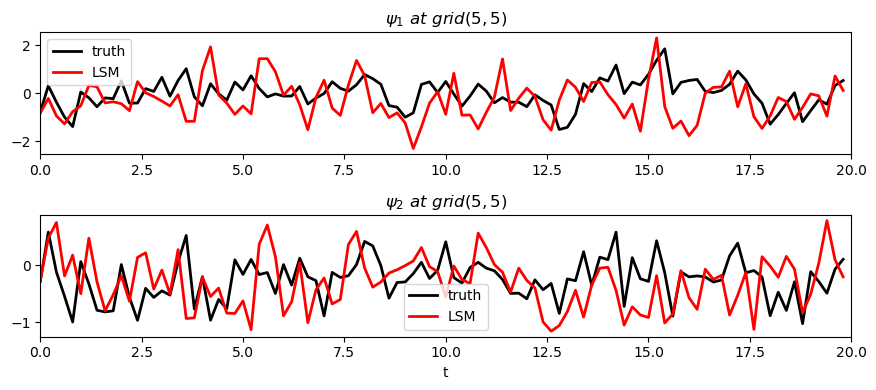

In [141]:
# Plotting trajectories
mode = 5
s_rate = 20
plt.figure(figsize=(9, 4))
plt.subplot(2, 1, 1)
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi1_ifft_t[mode,mode,:]), 'k', linewidth=2, label='truth')
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi1_ifft[mode,mode,:]), 'r', linewidth=2, label='LSM')
plt.title(r'$\psi_1\ at\ grid({{{:d},{:d}}})$'.format(mode, mode))
plt.xlim(0,N*dt)
plt.legend()
# plt.xlabel('t')

plt.subplot(2, 1, 2)
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi2_ifft_t[mode,mode,:]), 'k', linewidth=2, label='truth')
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi2_ifft[mode,mode,:]), 'r', linewidth=2, label='LSM')
plt.title(r'$\psi_2\ at\ grid({{{:d},{:d}}})$'.format(mode, mode))
plt.legend()
plt.xlabel('t')
plt.xlim(0,N*dt)
plt.tight_layout()
# plt.savefig('../figure/psi_layer_ou_truth_K128_beta22_tr_h32.png', dpi=100)
plt.show()

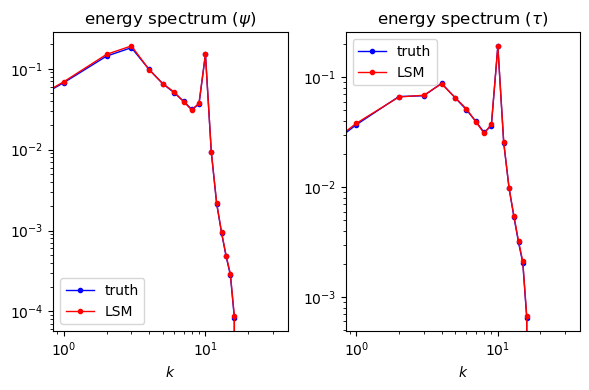

In [142]:
from ene_spectrum import ene_spectrum, adjust_ik, trunc2full
# energy spectrum of eigenmodes
t_avrg = 8000
psi_hat_t = np.concatenate((psi_k_t[:,:,None,-t_avrg:], tau_k_t[:,:,None,-t_avrg:]), axis=2)
ke, ape, ene, etp, e_mode = ene_spectrum(np.transpose(psi_hat_t, axes=(3,0,1,2)), K, kd, topo, r_cut)
psi_hat = np.concatenate((psi_k[:,:,None,-t_avrg:], tau_k[:,:,None,-t_avrg:]), axis=2)
ke_ou, ape_ou, ene_ou, etp_ou, e_mode_ou = ene_spectrum(np.transpose(psi_hat, axes=(3,0,1,2)), K, kd, topo, r_cut)

# Plot spectrum
nrow = 1; ncol = 2
fig, axs = plt.subplots(nrow, ncol, figsize=(6,4))

dataplot = np.zeros((K//2 + 1, 3, nrow, ncol))
dataplot[:,0,0,0] = e_mode[:,0]
dataplot[:,1,0,0] = e_mode_ou[:,0]
dataplot[:,0,0,1] = e_mode[:,1]
dataplot[:,1,0,1] = e_mode_ou[:,1]

for i in range(2):
    n_tick = 4
    axs[i].loglog(np.arange(0, K//2 + 1), dataplot[:,0,0,i], '.-b', linewidth=1, label='truth')
    axs[i].loglog(np.arange(0, K//2 + 1), dataplot[:,1,0,i], '.-r', linewidth=1, label='LSM')
#         axs[i,j].set_ylim(K//2-r, K//2+r)
    axs[i].set_xlabel('$k$')
    axs[i].legend()

axs[0].set_title(r'energy spectrum ($\psi$)')
axs[1].set_title(r'energy spectrum ($\tau$)')

plt.tight_layout()
# plt.savefig('../figure/spectrum_eigen_K128_beta22_tr_h32.png', dpi=100)
plt.show()

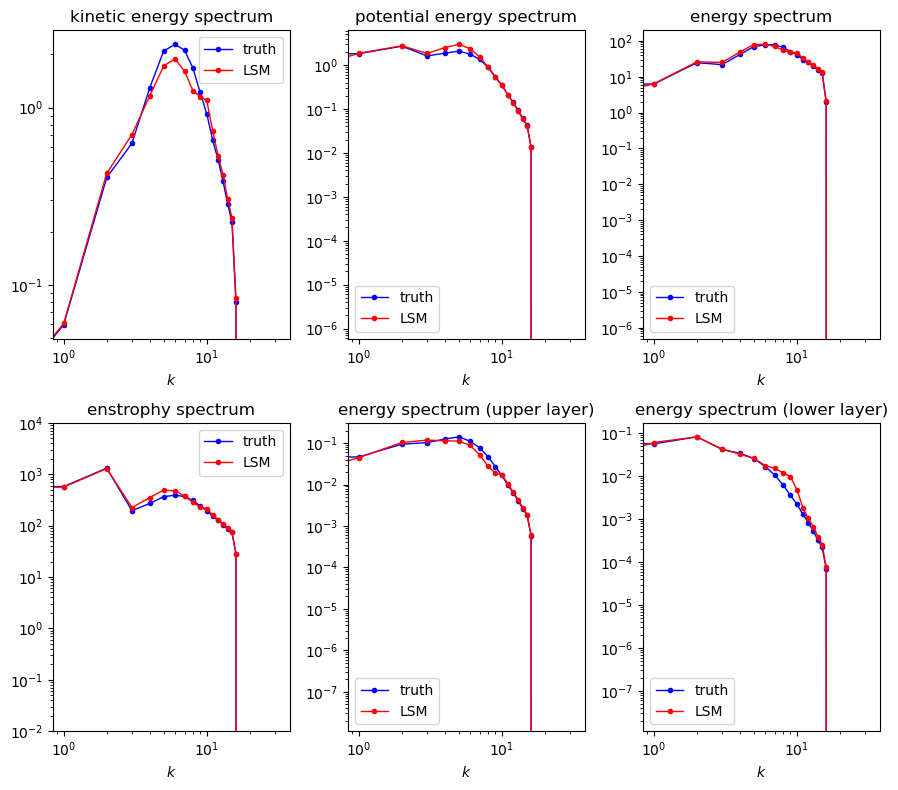

In [143]:
# energy spectrum of layers
t_avrg = 8000
psi_hat_t = np.concatenate((psi1_k_t[:,:,None,-t_avrg:], psi2_k_t[:,:,None,-t_avrg:]), axis=2)
ke, ape, ene, etp, e_mode = ene_spectrum(np.transpose(psi_hat_t, axes=(3,0,1,2)), K, kd, topo, r_cut)
psi_hat = np.concatenate((psi1_k[:,:,None,-t_avrg:], psi2_k[:,:,None,-t_avrg:]), axis=2)
ke_ou, ape_ou, ene_ou, etp_ou, e_mode_ou = ene_spectrum(np.transpose(psi_hat, axes=(3,0,1,2)), K, kd, topo, r_cut)

# Plot spectrum
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(9,8))

dataplot = np.zeros((K//2 + 1, 3, nrow, ncol))
dataplot[:,0,0,0] = ke
dataplot[:,1,0,0] = ke_ou
dataplot[:,0,0,1] = ape
dataplot[:,1,0,1] = ape_ou
dataplot[:,0,0,2] = ene
dataplot[:,1,0,2] = ene_ou
dataplot[:,0,1,0] = etp
dataplot[:,1,1,0] = etp_ou
dataplot[:,0,1,1] = e_mode[:,0]
dataplot[:,1,1,1] = e_mode_ou[:,0]
dataplot[:,0,1,2] = e_mode[:,1]
dataplot[:,1,1,2] = e_mode_ou[:,1]

for i in range(2):
    for j in range(3):
        n_tick = 4
        axs[i,j].loglog(np.arange(0, K//2 + 1), dataplot[:,0,i,j], '.-b', linewidth=1, label='truth')
        axs[i,j].loglog(np.arange(0, K//2 + 1), dataplot[:,1,i,j], '.-r', linewidth=1, label='LSM')
#         axs[i,j].set_ylim(K//2-r, K//2+r)
        axs[i,j].set_xlabel('$k$')
        axs[i,j].legend()

# axs[0,0].set_ylim(1e-5, 10)
axs[1,0].set_ylim(1e-2, 10000)

axs[0,0].set_title('kinetic energy spectrum')
axs[0,1].set_title('potential energy spectrum')
axs[0,2].set_title('energy spectrum')
axs[1,0].set_title('enstrophy spectrum')
axs[1,1].set_title(r'energy spectrum (upper layer)')
axs[1,2].set_title(r'energy spectrum (lower layer)')

plt.tight_layout()
# plt.savefig('../figure/spectrum_layer_K128_beta22_tr_h32.png', dpi=100)
plt.show()

### LSM of eigenmodes (correlated noise) with forcing replaced by bare truncation

In [145]:
from mode_truc import inv_truncate, truncate
kd=10
beta=22
U=1
r=9
nu=1e-12
H=40
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)
K_squared = KX**2 + KY**2
Ck = 1 / (K_squared * (K_squared + kd**2))
Ck[0,0] = 0
dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography
hk = np.fft.fft2(topo)

A0_btr = Ck * (-nu * K_squared**4 * (K_squared+kd**2)*K_squared + 1j * KX * (K_squared + kd**2/2)*beta - K_squared**2 * U)
A1_btr = Ck * (-r*kd**2/2*K_squared + 1j * KX * (kd**2/2*beta + kd**2*K_squared*U))
a0_btr = Ck * (1j * KX * (kd**2/2*beta -kd**2*K_squared*U))
a1_btr = Ck * (-(r*(K_squared+kd**2/2)*K_squared + nu*K_squared**4*(K_squared+kd**2)*K_squared) + 1j * KX *(K_squared+kd**2/2)*beta+K_squared**2*U)
F1_btr = Ck * (nu*K_squared**4*kd**2/2 - 1j * KX * kd**2/2*U) * hk
F2_btr = Ck * (nu*K_squared**4*(K_squared+kd**2/2) - 1j * KX * (K_squared+kd**2/2)*U) * hk
F1_btr = inv_truncate(truncate(F1_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()
F2_btr = inv_truncate(truncate(F2_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()

/tmp/ipykernel_3457152/3058055863.py:12: RuntimeWarning: divide by zero encountered in divide
  Ck = 1 / (K_squared * (K_squared + kd**2))


In [154]:
f_btr.shape

(64, 64, 2)

In [153]:
F_psi_btr, F_tau_btr = layer2eigen(K,r_cut,r1,r2,F1_btr[:,:,None],F2_btr[:,:,None]) 
f_btr = np.concatenate([F_psi_btr, F_tau_btr], axis=2)

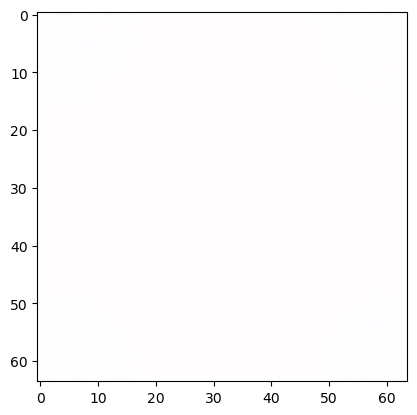

In [167]:
maxabs = 1
plt.imshow(f_btr[:, :, 1].real, cmap='seismic', vmin=-maxabs, vmax=maxabs)

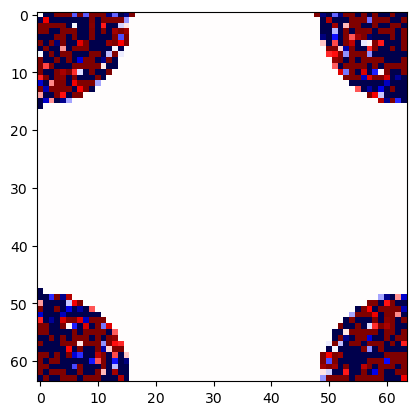

In [170]:
plt.imshow(f_est[:, :, 1].real, cmap='seismic', vmin=-maxabs, vmax=maxabs)

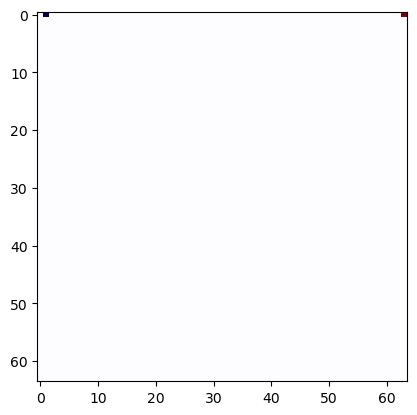

In [169]:
plt.imshow(f_btr[:, :, 1].imag, cmap='seismic', vmin=-maxabs, vmax=maxabs)

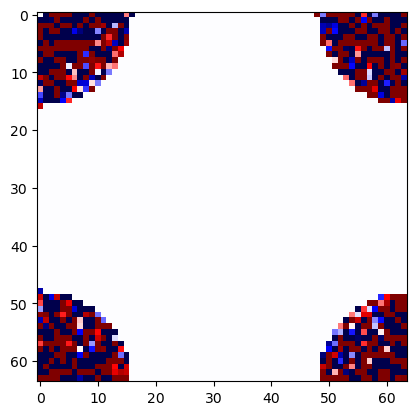

In [168]:
plt.imshow(f_est[:, :, 1].imag, cmap='seismic', vmin=-maxabs, vmax=maxabs)

In [184]:
f_btr[0, 1, 1].imag

-3195.6110660199993

In [185]:
f_est[0, 1, 1].imag

-469.9001195584261

In [171]:
# Run OU process
N = 10000
# get the initial condition
psi_k0 = psi_k_t[:,:,0]
tau_k0 = tau_k_t[:,:,0]
# psi_k, tau_k = run_OU(psi_k0, tau_k0, K, N, dt, r_cut, r1, r2, gamma_est, omega_est, f_est, sigma_est, style=style, s_rate=20, corr_noise=False)
psi_k, tau_k = run_OU(psi_k0, tau_k0, K, N, dt, r_cut, r1, r2, gamma_est, omega_est, f_btr, sigma_cn, style=style, s_rate=20, corr_noise=True, cov=cov_cn)
psi1_k, psi2_k = eigen2layer(K,r_cut,r1,r2,psi_k,tau_k,style)

In [172]:
# ifft to real space
interv = 5
psi1_ifft = np.fft.ifft2(psi1_k[:, :, ::interv], axes=(0,1))
psi1_ifft_t = np.fft.ifft2(psi1_k_t[:, :, ::interv], axes=(0,1))
psi2_ifft = np.fft.ifft2(psi2_k[:, :, ::interv], axes=(0,1))
psi2_ifft_t = np.fft.ifft2(psi2_k_t[:, :, ::interv], axes=(0,1))

In [173]:
psi1_ifft_t = psi1_ifft_t[:,:,:100]
psi2_ifft_t = psi2_ifft_t[:,:,:100]

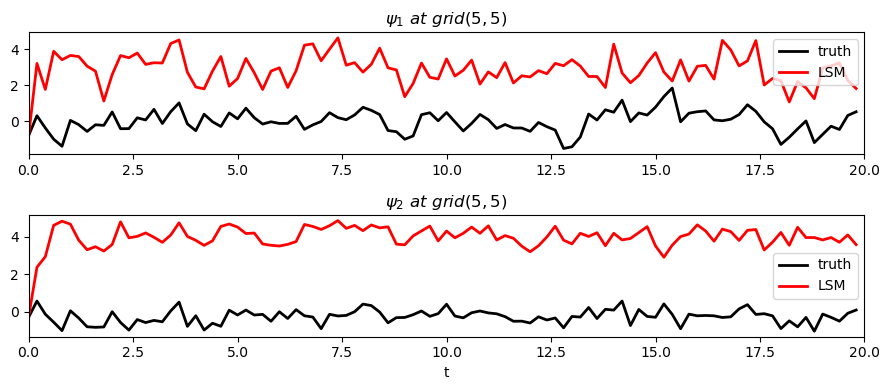

In [174]:
# Plotting trajectories
mode = 5
s_rate = 20
plt.figure(figsize=(9, 4))
plt.subplot(2, 1, 1)
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi1_ifft_t[mode,mode,:]), 'k', linewidth=2, label='truth')
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi1_ifft[mode,mode,:]), 'r', linewidth=2, label='LSM')
plt.title(r'$\psi_1\ at\ grid({{{:d},{:d}}})$'.format(mode, mode))
plt.xlim(0,N*dt)
plt.legend()
# plt.xlabel('t')

plt.subplot(2, 1, 2)
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi2_ifft_t[mode,mode,:]), 'k', linewidth=2, label='truth')
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi2_ifft[mode,mode,:]), 'r', linewidth=2, label='LSM')
plt.title(r'$\psi_2\ at\ grid({{{:d},{:d}}})$'.format(mode, mode))
plt.legend()
plt.xlabel('t')
plt.xlim(0,N*dt)
plt.tight_layout()
# plt.savefig('../figure/psi_layer_ou_truth_K128_beta22_tr_h32.png', dpi=100)
plt.show()

In [180]:
psi1 = np.fft.ifft2(psi1_k, axes=(0,1)).real
psi2 = np.fft.ifft2(psi2_k, axes=(0,1)).real

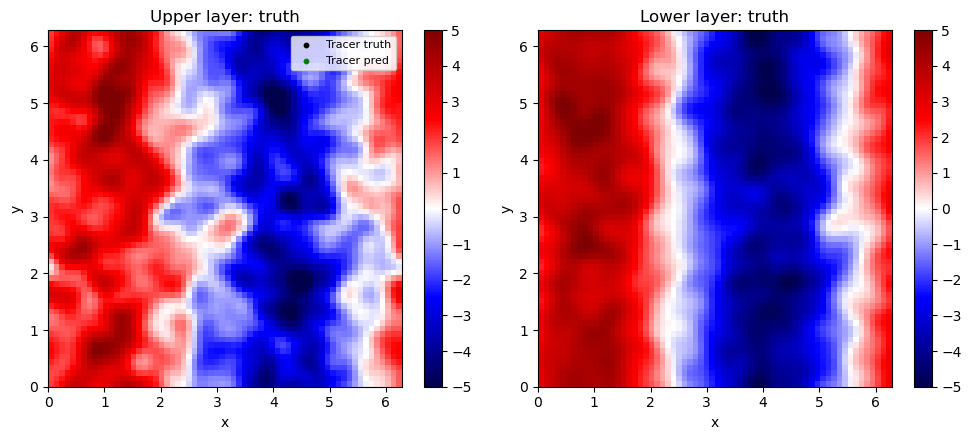

In [183]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(5., 5.)
plot_combined_fields_with_tracers(psi1[:, :, nt], psi2[:, :, nt], np.full((2,2), np.nan), np.full((2,2), np.nan), 'truth', colorlim)

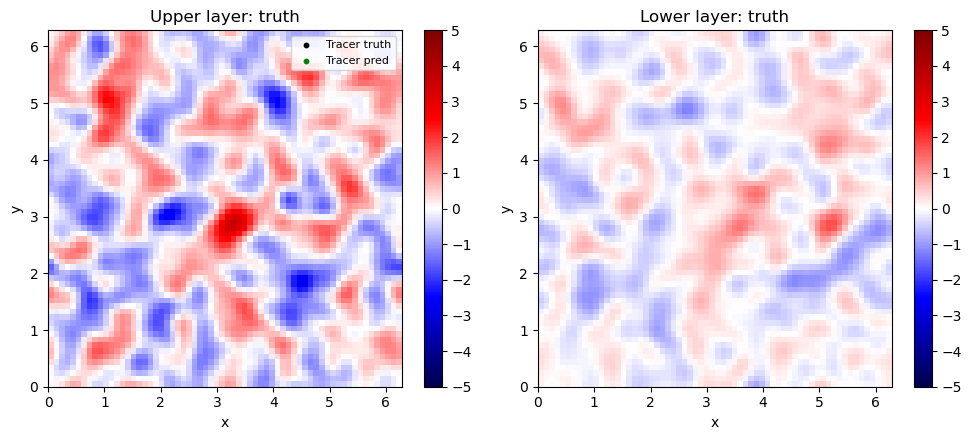

In [188]:
psi1 -= np.mean(psi1, axis=-1, keepdims=True) 
psi2 -= np.mean(psi2, axis=-1, keepdims=True) 
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(5., 5.)
plot_combined_fields_with_tracers(psi1[:, :, nt], psi2[:, :, nt], np.full((2,2), np.nan), np.full((2,2), np.nan), 'truth', colorlim)

### Comparison: LSMs vs Bare-truncation model

In [42]:
psi1_k_t = psi_k_t[-1, :, :, 0]
psi2_k_t = psi_k_t[-1, :, :, 1]

In [62]:
# Compute eigenvalues and eigenvectors
eigens = np.load('../data/eigens_K128_beta22.npz')
omega1 = eigens['omega1']
omega2 = eigens['omega2']
r1 = eigens['r1']
r2 = eigens['r2']

# truncate parameter
r_cut = 16
style = 'circle'

# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t[:, :, None], psi2_k_t[:, :, None], style=style)

est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h40.npz')
gamma_est = est_params['gamma']
omega_est_ccf = est_params['omega_ccf']
omega_est_acf = est_params['omega_acf']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

# Run OU process
N = 10000
# get the initial condition
psi_k0 = psi_k_t[:,:,0]
tau_k0 = tau_k_t[:,:,0]
psi_k, tau_k = run_OU(psi_k0, tau_k0, K, N, dt, r_cut, r1, r2, gamma_est, omega_est, f_est, sigma_est, style=style, s_rate=20, corr_noise=False)


In [19]:
omega_est.shape

(128, 128, 2)

In [2]:
def get_params(r1, r2, gamma, omega, f, sigma=None):
    '''
    model free forecast.
    noise should satisfy conjugate symmetry, 
    e.g.,
    noise = np.random.randn(K, K, N, 2) + 1j * np.random.randn(K, K, N, 2)
    for n in range(N):
        noise[:,:,n,:] = avg_conj_symm(noise[:,:,n,:], r1)

    '''
    deno = 1 / (r1[:, 0] * r2[:, 1] - r1[:, 1] * r2[:, 0])
    deno[0] = 0
    A0_ = (r1[:, 0] * r2[:, 1] * (-gamma[:, 0] + 1j * omega[:, 0]) - r1[:, 1] * r2[:, 0] * (-gamma[:, 1] + 1j * omega[:, 1])) * deno
    A1_ = (r1[:, 0] * r2[:, 0] * (-(-gamma[:, 0] + gamma[:, 1]) + 1j * (-omega[:, 0] + omega[:, 1]))) * deno
    a0_ = (r1[:, 1] * r2[:, 1] * (-(gamma[:, 0] - gamma[:, 1]) + 1j * (omega[:, 0] - omega[:, 1]))) * deno
    a1_ = (-r1[:, 1] * r2[:, 0] * (-gamma[:, 0] + 1j * omega[:, 0]) + r1[:, 0] * r2[:, 1] * (-gamma[:, 1] + 1j * omega[:, 1])) * deno
    F1 = r1[:, 0] * f[:, 0] + r2[:, 0] * f[:, 1]
    F2 = r1[:, 1] * f[:, 0] + r2[:, 1] * f[:, 1]

    return A0_, A1_, a0_, a1_, F1, F2

In [5]:
K=128
H = 40
dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography
hk = np.fft.fft2(topo)

# Compute eigenvalues and eigenvectors
eigens = np.load('../data/eigens_K128_beta22.npz')
omega1 = eigens['omega1']
omega2 = eigens['omega2']
r1 = eigens['r1']
r2 = eigens['r2']

est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h40.npz')
gamma_est = est_params['gamma']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

r_cut = 16
style = 'circle'
from mode_truc import truncate, inv_truncate
r1 = truncate(r1, r_cut, style)
r2 = truncate(r2, r_cut, style)
f = truncate(f_est,r_cut, style=style)
gamma = truncate(gamma_est,r_cut, style=style)
omega = truncate(omega_est,r_cut, style=style)
sigma = truncate(sigma_est,r_cut, style=style)

A0_, A1_, a0_, a1_, F1_, F2_ = get_params(r1, r2, gamma, omega, f, sigma=None)

A0 = inv_truncate(A0_[:, None], r_cut, K, style).squeeze()
A1 = inv_truncate(A1_[:, None], r_cut, K, style).squeeze()
a0 = inv_truncate(a0_[:, None], r_cut, K, style).squeeze()
a1 = inv_truncate(a1_[:, None], r_cut, K, style).squeeze()
F1 = inv_truncate(F1_[:, None], r_cut, K, style).squeeze()
F2 = inv_truncate(F2_[:, None], r_cut, K, style).squeeze()

/tmp/ipykernel_2193169/881501609.py:11: RuntimeWarning: divide by zero encountered in divide
  deno = 1 / (r1[:, 0] * r2[:, 1] - r1[:, 1] * r2[:, 0])
/tmp/ipykernel_2193169/881501609.py:11: RuntimeWarning: invalid value encountered in divide
  deno = 1 / (r1[:, 0] * r2[:, 1] - r1[:, 1] * r2[:, 0])


In [95]:
truncate(F1_btr,r_cut, style).shape

(797,)

In [8]:
kd=10
beta=22
U=1
r=9
nu=1e-12
H=40
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)
K_squared = KX**2 + KY**2
Ck = 1 / (K_squared * (K_squared + kd**2))
Ck[0,0] = 0
A0_btr = Ck * (-nu * K_squared**4 * (K_squared+kd**2)*K_squared + 1j * KX * (K_squared + kd**2/2)*beta - K_squared**2 * U)
A1_btr = Ck * (-r*kd**2/2*K_squared + 1j * KX * (kd**2/2*beta + kd**2*K_squared*U))
a0_btr = Ck * (1j * KX * (kd**2/2*beta -kd**2*K_squared*U))
a1_btr = Ck * (-(r*(K_squared+kd**2/2)*K_squared + nu*K_squared**4*(K_squared+kd**2)*K_squared) + 1j * KX *(K_squared+kd**2/2)*beta+K_squared**2*U)
F1_btr = Ck * (nu*K_squared**4*kd**2/2 - 1j * KX * kd**2/2*U) * hk
F2_btr = Ck * (nu*K_squared**4*(K_squared+kd**2/2) - 1j * KX * (K_squared+kd**2/2)*U) * hk

A0_btr = inv_truncate(truncate(A0_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()
A1_btr = inv_truncate(truncate(A1_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()
a0_btr = inv_truncate(truncate(a0_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()
a1_btr = inv_truncate(truncate(a1_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()
F1_btr = inv_truncate(truncate(F1_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()
F2_btr = inv_truncate(truncate(F2_btr,r_cut, style)[:, None], r_cut, K, style).squeeze()

/tmp/ipykernel_2193169/1357490904.py:11: RuntimeWarning: divide by zero encountered in divide
  Ck = 1 / (K_squared * (K_squared + kd**2))


In [9]:
F1_btr.shape

(128, 128)

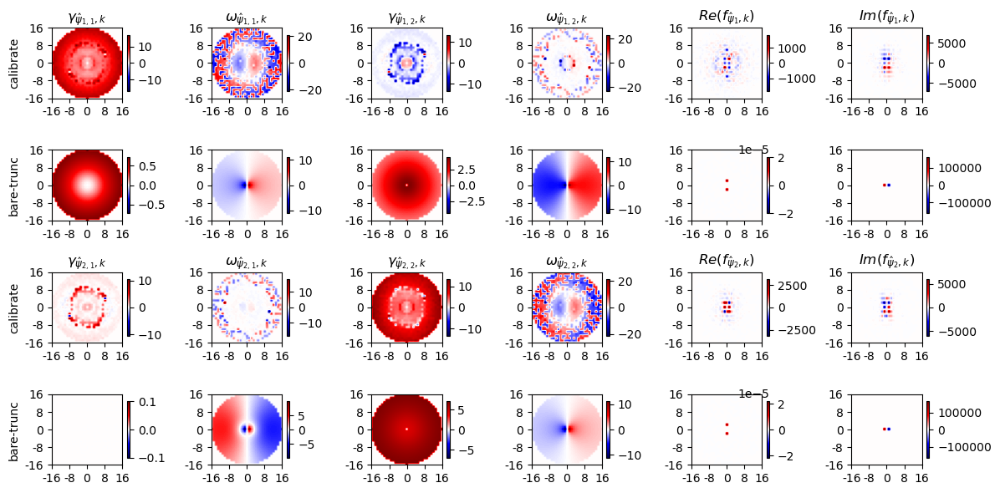

In [11]:
# Plot modes of omega
nrow = 4; ncol = 6
fig, axs = plt.subplots(nrow, ncol, figsize=(12,6))

data1 = []
data2 = []
data1.append(-A0.real)
data1.append(A0.imag)
data1.append(-A1.real)
data1.append(A1.imag)
data1.append(F1.real)
data1.append(F1.imag)
data2.append(-a0.real)
data2.append(a0.imag)
data2.append(-a1.real)
data2.append(a1.imag)
data2.append(F2.real)
data2.append(F2.imag)
data1_t = []
data2_t = []
data1_t.append(-A0_btr.real)
data1_t.append(A0_btr.imag)
data1_t.append(-A1_btr.real)
data1_t.append(A1_btr.imag)
data1_t.append(F1_btr.real)
data1_t.append(F1_btr.imag)
data2_t.append(-a0_btr.real)
data2_t.append(a0_btr.imag)
data2_t.append(-a1_btr.real)
data2_t.append(a1_btr.imag)
data2_t.append(F2_btr.real)
data2_t.append(F2_btr.imag)

dataplot = np.zeros((K,K,nrow, ncol))
for col in range(ncol):
    dataplot[:,:,0,col] = data1[col]
    dataplot[:,:,1,col] = data1_t[col]
    dataplot[:,:,2,col] = data2[col]
    dataplot[:,:,3,col] = data2_t[col]
        
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 

for i in range(nrow):
    for j in range(ncol):
        n_tick = K//8
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
        axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
        axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
        axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        fig.colorbar(im, ax=axs[i,j], shrink=0.8)

axs[0,0].set_title(r'$\gamma_{{\hat{\psi}_{1,1}},k}$')
axs[0,1].set_title(r'$\omega_{{\hat{\psi}_{1,1}},k}$')
axs[0,2].set_title(r'$\gamma_{{\hat{\psi}_{1,2}},k}$')
axs[0,3].set_title(r'$\omega_{{\hat{\psi}_{1,2}},k}$')
axs[0,4].set_title(r'$Re(f_{{\hat{\psi}_{1}},k})$')
axs[0,5].set_title(r'$Im(f_{{\hat{\psi}_{1}},k})$')
axs[2,0].set_title(r'$\gamma_{{\hat{\psi}_{2,1}},k}$')
axs[2,1].set_title(r'$\omega_{{\hat{\psi}_{2,1}},k}$')
axs[2,2].set_title(r'$\gamma_{{\hat{\psi}_{2,2}},k}$')
axs[2,3].set_title(r'$\omega_{{\hat{\psi}_{2,2}},k}$')
axs[2,4].set_title(r'$Re(f_{{\hat{\psi}_{2}},k})$')
axs[2,5].set_title(r'$Im(f_{{\hat{\psi}_{2}},k})$')
axs[0,0].set_ylabel('calibrate')
axs[1,0].set_ylabel('bare-trunc')
axs[2,0].set_ylabel('calibrate')
axs[3,0].set_ylabel('bare-trunc')

plt.tight_layout()
plt.savefig('../figure/params_cali_vs_baretrunc.png', dpi=150)
plt.show()

In [65]:
psi1 = np.fft.ifft2(psi1_k, axes=(0,1))
psi2 = np.fft.ifft2(psi2_k, axes=(0,1))

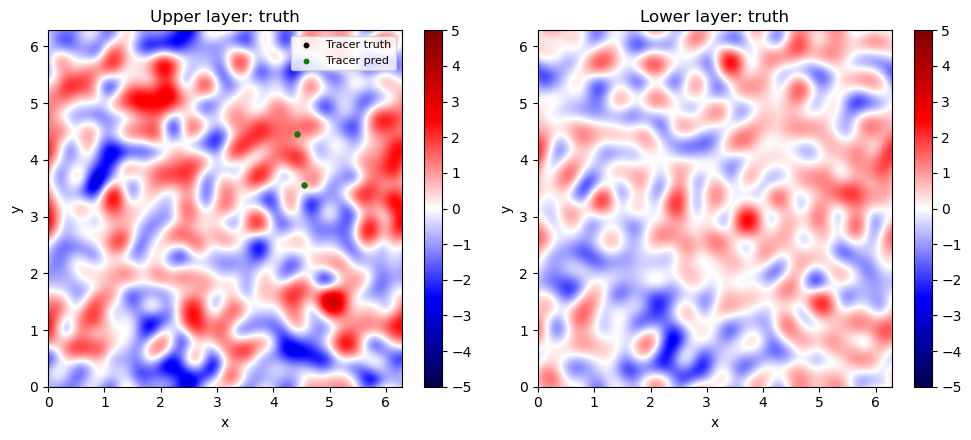

In [66]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(5., 5.)
plot_combined_fields_with_tracers(psi1[:, :, nt], psi2[:, :, nt], xy_obs[nt, :], xy_obs[nt, :], 'truth', colorlim, levels=257)


In [39]:
import numpy as np
from numba import jit, prange
# from QG import QG
from Lagrangian_tracer import Lagrange_tracer_model
from time import time
'''
require rocket-fft for numba to be aware of np.fft
!pip install rocket-fft 
'''

@jit(nopython=True)
def rhs_spectral_topo(q_hat, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian):
    q_vec = q_hat - subtract_hk
    # psi_hat = (q2psi @ q_vec[:,:,:,None])[:,:,:,0]
    # if using numba, manually do the matrix multiplication (2x2 @ 2x1)
    psi_hat = np.zeros((K,K,2), dtype=np.complex128)
    psi_hat[:, :, 0] = q2psi[:, :, 0, 0] * q_vec[:, :, 0] + q2psi[:, :, 0, 1] * q_vec[:, :, 1]
    psi_hat[:, :, 1] = q2psi[:, :, 1, 0] * q_vec[:, :, 0] + q2psi[:, :, 1, 1] * q_vec[:, :, 1]

    # Calculate Ekman plus beta plus mean shear
    RHS = np.zeros_like(q_hat, dtype=np.complex64)
    RHS[:,:,0] = -Ut * dX * q_hat[:,:,0] - (kb**2 + Ut * kd**2) * dX * psi_hat[:,:,0]
    RHS[:,:,1] = Ut * dX * q_hat[:,:,1] - (kb**2 - Ut * kd**2) * dX * psi_hat[:,:,1] - r * Laplacian * psi_hat[:,:,1]

    # # For using a 3/2-rule dealiased jacobian
    # Psi_hat = np.zeros((int(1.5 * K), int(1.5 * K), 2), dtype=np.complex128)
    # Q_hat = np.zeros((int(1.5 * K), int(1.5 * K), 2), dtype=np.complex128)
    # Psi_hat[:K//2+1, :K//2+1, :] = (9/4) * psi_hat[:K//2+1, :K//2+1, :]
    # Psi_hat[:K//2+1, K+1:int(1.5*K), :] = (9/4) * psi_hat[:K//2+1, K//2+1:K, :]
    # Psi_hat[K+1:int(1.5*K), :K//2+1, :] = (9/4) * psi_hat[K//2+1:K, :K//2+1, :]
    # Psi_hat[K+1:int(1.5*K), K+1:int(1.5*K), :] = (9/4) * psi_hat[K//2+1:K, K//2+1:K, :]
    # Q_hat[:K//2+1, :K//2+1, :] = (9/4) * q_hat[:K//2+1, :K//2+1, :]
    # Q_hat[:K//2+1, K+1:int(1.5*K), :] = (9/4) * q_hat[:K//2+1, K//2+1:K, :]
    # Q_hat[K+1:int(1.5*K), :K//2+1, :] = (9/4) * q_hat[K//2+1:K, :K//2+1, :]
    # Q_hat[K+1:int(1.5*K), K+1:int(1.5*K), :] = (9/4) * q_hat[K//2+1:K, K//2+1:K, :]

    # # Calculate u.gradq on 3/2 grid
    # u = np.real(np.fft.ifft2(-DY[:,:,None] * Psi_hat, axes=(0,1)))
    # v = np.real(np.fft.ifft2(DX[:,:,None] * Psi_hat, axes=(0,1)))
    # qx = np.real(np.fft.ifft2(DX[:,:,None] * Q_hat, axes=(0,1)))
    # qy = np.real(np.fft.ifft2(DY[:,:,None] * Q_hat, axes=(0,1)))
    # jaco_real = u * qx + v * qy

    # # FFT, 3/2 grid; factor of (4/9) scales fft
    # Jaco_hat = (4/9) * np.fft.fft2(jaco_real, axes=(0,1))

    # # Reduce to normal grid
    # jaco_hat = np.zeros((K, K, 2), dtype=np.complex128)
    # jaco_hat[:K//2 + 1, :K//2 + 1, :] = Jaco_hat[:K//2 + 1, :K//2 + 1, :]
    # jaco_hat[:K//2 + 1, K//2 + 1:, :] = Jaco_hat[:K//2 + 1, K+1:int(1.5 * K), :]
    # jaco_hat[K//2 + 1:, :K//2 + 1, :] = Jaco_hat[K+1:int(1.5 * K), :K//2 + 1, :]
    # jaco_hat[K//2 + 1:, K//2 + 1:, :] = Jaco_hat[K+1:int(1.5 * K), K+1:int(1.5 * K), :]

    # # Put it all together
    # RHS -= jaco_hat

    return RHS
    
@jit(nopython=True, parallel=True, fastmath=True)
def forward_loop(ens, qp_ens, Nt, dt, HV, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian):
    qp_ens_history = np.zeros((ens, Nt+1, K, K, 2))
    qp_ens_history[:, 0, :, :, :] = qp_ens
    q_ens = np.fft.fft2(qp_ens, axes=(1,2))
    # Timestepping
    for e in prange(ens):  # Parallelize over ensemble members
        q = q_ens[e, :, :, :]
        # Timestepping (Fourth-order Runge=Kutta pseudo-spectral scheme)
        for n in range(1, Nt+1):
            M = 1 / (1 - .25 * dt * HV)
            # First stage ARK4
            k0 = rhs_spectral_topo(q, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
            l0 = HV * q
            # Second stage
            q1 = M * (q + .5 * dt * k0 + .25 * dt * l0)
            k1 = rhs_spectral_topo(q1, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
            l1 = HV * q1
            # Third stage
            q2 = M * (q + dt * (13861 * k0 / 62500 + 6889 * k1 / 62500 + 8611 * l0 / 62500 - 1743 * l1 / 31250))
            k2 = rhs_spectral_topo(q2, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
            l2 = HV * q2
            # Fourth stage
            q3 = M * (q + dt * (-0.04884659515311858 * k0 - 0.1777206523264010 * k1 + 0.8465672474795196 * k2 +
                                0.1446368660269822 * l0 - 0.2239319076133447 * l1 + 0.4492950415863626 * l2))
            k3 = rhs_spectral_topo(q3, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
            l3 = HV * q3
            # Fifth stage
            q4 = M * (q + dt * (-0.1554168584249155 * k0 - 0.3567050098221991 * k1 + 1.058725879868443 * k2 +
                                0.3033959883786719 * k3 + 0.09825878328356477 * l0 - 0.5915442428196704 * l1 +
                                0.8101210538282996 * l2 + 0.2831644057078060 * l3))
            k4 = rhs_spectral_topo(q4, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
            l4 = HV * q4
            # Sixth stage
            q5 = M * (q + dt * (0.2014243506726763 * k0 + 0.008742057842904184 * k1 + 0.1599399570716811 * k2 +
                                0.4038290605220775 * k3 + 0.2260645738906608 * k4 + 0.1579162951616714 * l0 +
                                0.1867589405240008 * l2 + 0.6805652953093346 * l3 - 0.2752405309950067 * l4))
            k5 = rhs_spectral_topo(q5, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
            l5 = HV * q5

            # Successful step, proceed to evaluation
            qp = np.real(np.fft.ifft2(q + dt * (0.1579162951616714 * (k0 + l0) +
                                                0.1867589405240008 * (k2 + l2) +
                                                0.6805652953093346 * (k3 + l3) -
                                                0.2752405309950067 * (k4 + l4) +
                                                (k5 + l5) / 4), axes=(0,1)))

            # add stochastic noise
            qp += 300 * np.random.randn(K, K, 2) * np.sqrt(dt)

            q = np.fft.fft2(qp, axes=(0,1))

            qp_ens_history[e, n, :, :, :] = qp

    return qp_ens_history
    

class QG:
    def __init__(self, K=128, kd=10, kb=np.sqrt(22), U=1, r=9, nu=1e-12, H=40, topo=None):
        # Set up hyperviscous PV dissipation
        Kx = np.fft.fftfreq(K) * K
        Ky = np.fft.fftfreq(K) * K
        KX, KY = np.meshgrid(Kx, Ky)
        HV = np.tile((-nu * (KX**2 + KY**2)**4)[:,:, None], (1,1,2))

        # Initialize topography
        if topo is None:
            dx = 2 * np.pi / K
            X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
            topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
            topo -= np.mean(topo)  # subtracting the mean to center the topography
        hk = np.fft.fft2(topo)

        # Initialize additional variables for the simulation
        Ut = U  # zonal shear flow
        dX = 1j * KX
        dY = 1j * KY
        Laplacian = dX**2 + dY**2
        K_square = KX**2 + KY**2
        q2psi = -1 / (K_square * (K_square + kd**2))[:,:,None,None] * (np.eye(2) * K_square[:, :, None, None] + kd**2/2)
        q2psi[0,0,:,:] = 0
        q2psi = q2psi.astype(np.complex128)
        subtract_hk = np.zeros(((K,K,2)), dtype=complex)
        subtract_hk[:,:,1] = hk

        # for 3/2-rule dealiased Jacobian
        K_Jac = int(K * 3/2)
        Kx_Jac = np.fft.fftfreq(K_Jac) * K_Jac
        Ky_Jac = np.fft.fftfreq(K_Jac) * K_Jac
        KX_Jac, KY_Jac = np.meshgrid(Kx_Jac, Ky_Jac)
        DX = 1j * KX_Jac
        DY = 1j * KY_Jac

        self.K = K
        self.kd = kd
        self.kb = kb
        self.r = r
        self.hk = hk
        self.dX = dX
        self.dY = dY
        self.DX = DX
        self.DY = DY
        self.q2psi = q2psi
        self.HV = HV
        self.Ut = Ut
        self.Laplacian = Laplacian
        self.subtract_hk = subtract_hk
            
    def forward_ens(self, ens, Nt=1, dt=1e-3, qp_ens=None):
        '''
        qp_ens: array of shape (ens, K, K, 2)
        '''
        K = self.K
        HV = self.HV
        kd = self.kd
        kb = self.kb
        r = self.r
        subtract_hk = self.subtract_hk
        DX  = self.DX
        DY = self.DY
        q2psi = self.q2psi
        Ut = self.Ut
        dX = self.dX
        dY = self.dY
        Laplacian = self.Laplacian

        return forward_loop(ens, qp_ens, Nt, dt, HV, K, kd, kb, r, subtract_hk, DX, DY, q2psi, Ut, dX, dY, Laplacian)
        
class QG_tracer:
    def __init__(self, K=128, kd=10, kb=np.sqrt(22), U=1, r=9, nu=1e-12, H=40, topo=None, sigma_xy=0.1, style='square'):
        Kx = np.fft.fftfreq(K) * K
        Ky = np.fft.fftfreq(K) * K
        KX, KY = np.meshgrid(Kx, Ky)

        # Initialize topography
        if topo is None:
            dx = 2 * np.pi / K
            X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
            topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
            topo -= np.mean(topo)  # subtracting the mean to center the topography
        hk = np.fft.fft2(topo)

        # Initialize additional variables for the simulation
        K_square = KX**2 + KY**2
        q2psi = -1 / (K_square * (K_square + kd**2))[:,:,None,None] * (np.eye(2) * K_square[:, :, None, None] + kd**2/2)
        q2psi[0,0,:,:] = 0
        q2psi = q2psi.astype(np.complex128)
        subtract_hk = np.zeros(((K,K,2)), dtype=complex)
        subtract_hk[:,:,1] = hk

        self.flow_model = QG(K, kd, kb, U, r, nu, H, topo)
        self.tracer_model = Lagrange_tracer_model(K, sigma_xy, style)
        self.q2psi = q2psi
        self.subtract_hk = subtract_hk

    def forward_ens(self, ens, Nt=1, dt=1e-3, qp_ens=None, L=1, x0=None, y0=None):
        '''
        qp_ens: array of shape (ens, K, K, 2)
        x0, y0: arrays of shape (ens, L)
        '''
        K = qp_ens.shape[1]
        flow_model = self.flow_model
        tracer_model = self.tracer_model
        q2psi = self.q2psi
        subtract_hk = self.subtract_hk

        # run flow model
        qp_history = flow_model.forward_ens(ens, Nt, dt, qp_ens)
        q_hat_history = np.fft.fft2(qp_history, axes=(2,3))

        # q to psi
        q_vec = q_hat_history - subtract_hk
        psi_hat_history = (q2psi @ q_vec[:,:,:,:,:,None])[:,:,:,:,:,0] # of shape (ens,Nt+1,K,K,2)

        # # psi to velocity
        # u = np.real(np.fft.ifft2(psi_hat_history[:, -1, :, :, :] * 1j * KY[:, :, None], axes=(1,2)))
        # v = np.real(np.fft.ifft2(psi_hat_history[:, -1, :, :, :] * (-1j) * KX[:, :, None], axes=(1,2)))

        # run tracer model
        x, y = tracer_model.forward_ens(ens, L, Nt, dt, x0, y0, psi_hat_history[:, :, :, :, 0]) # of shape (ens,L,Nt+1)

        return psi_hat_history, x, y, qp_history#, u, v

    def forward_flow(self, ens=1, Nt=1, dt=1e-3, qp_ens=None):
        '''
        qp_ens: array of shape (ens, K, K, 2)
        '''
        flow_model = self.flow_model
        q2psi = self.q2psi
        subtract_hk = self.subtract_hk

        # run flow model
        qp_history = flow_model.forward_ens(ens, Nt, dt, qp_ens) # of shape (ens, Nt+1, K, K, 2)
        q_hat_history = np.fft.fft2(qp_history, axes=(2,3))

        # q to psi
        q_vec = q_hat_history - subtract_hk
        psi_hat_history = (q2psi @ q_vec[:,:,:,:,:,None])[:,:,:,:,:,0] # of shape (ens,Nt+1,K,K,2)

        return qp_history, psi_hat_history


if __name__ == "__main__": 
    np.random.seed(0)
    data = np.load('../data/qg_data_sigmaxy01_t2000.npz')
    psi_truth_full = data['psi_truth']
    ics_psi = psi_truth_full
    n_ics = ics_psi.shape[0]

    # ---------- QG model parameters ------------
    K = 64 # Number of points (also Fourier modes) in each direction
    kd = 10 # Nondimensional deformation wavenumber
    kb = np.sqrt(22) # Nondimensional beta wavenumber, beta = kb^2 
    U = 1 # Zonal shear flow
    r = 9 # Nondimensional Ekman friction coefficient
    nu = 1e-12 # Coefficient of biharmonic vorticity diffusion
    H = 40 # Topography parameter
    dt = 1e-3 # Time step size
    warm_up = 1000 # Warm-up time steps
    Nt = 2e3 + warm_up # Number of time steps

    # ------- Tracer observation parameters -------
    L = 2 # Number of tracers
    sigma_xy = 0.1 # Tracer observation noise std (in sde)
    dt_ob = 4e-2 # Observation time interval
    obs_freq = int(dt_ob / dt) # Observation frequency
    Nt_obs = int((Nt - warm_up) / obs_freq + 1) # Number of observations saved

    # -------------- initialization ---------------
    # topo = generate_topo(K, 4) # generate topography
    # topo = H * topo
    dx = 2 * np.pi / K
    X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
    topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
    topo -= np.mean(topo)  # subtracting the mean to center the topography
    qp = np.zeros((K, K, 2))
    qp[:, :, 1] = 10 * np.random.randn(K, K)
    qp[:, :, 1] -= np.mean(qp[:, :, 1])
    qp[:, :, 0] = qp[:, :, 1]
    psi_k_t = np.zeros((Nt_obs, K, K, 2), dtype=complex)
    model = QG_tracer(K=K, kd=kd, kb=kb, U=U, r=r, nu=nu, topo=topo, sigma_xy=sigma_xy)
    x_t = np.zeros((Nt_obs, L))
    y_t = np.zeros((Nt_obs, L))
    x0 = np.pi + 0.1 * np.random.randn(L) # np.random.uniform(0, 2*np.pi, L)
    y0 = np.pi + 0.1 * np.random.randn(L) # np.random.uniform(0, 2*np.pi, L)
    x_t[0, :] = x0
    y_t[0, :] = y0

    # # warm up
    # qp_t, psi_k_t1 = model.forward_flow(ens=1, Nt=warm_up, dt=dt, qp_ens=qp[None,:,:,:])
    # qp_t0 = qp_t[:, -1, :, :, :]
    # psi_k_t[0, :, :, :] = psi_k_t1[0, -1, :, :, :]

    Nx = 64
    hk = np.fft.fft2(topo)
    psi0_ens = ics_psi[np.random.randint(n_ics, size=1), :, :, :] # shape (Nens,Nx,Nx,2)
    psi0_k_ens = np.fft.fft2(psi0_ens, axes=(1,2)) # shape (Nens,Nx,Nx,2)
    Kx = np.fft.fftfreq(Nx) * Nx
    Ky = np.fft.fftfreq(Nx) * Nx
    KX, KY = np.meshgrid(Kx, Ky)
    K_square = KX**2 + KY**2
    psi2q_mat = (-np.eye(2) * K_square[:, :, None, None]) + (kd**2/2 * np.ones((2,2)) - np.eye(2) * kd**2)
    psi2q_mat = psi2q_mat.astype(np.complex128)
    plus_hk = np.zeros(((Nx,Nx,2,1)), dtype=complex)
    plus_hk[:,:,1,0] = hk
    q0_k_ens = (psi2q_mat @ psi0_k_ens[:, :, :, :, None] + plus_hk)[:, :, :, :, 0] # shape (Nens,Nx,Nx,2)
    qp_t0 = np.real(np.fft.ifft2(q0_k_ens, axes=(1,2)))
    psi_k_t[0] = psi0_k_ens[0]

    t0 = time()
    # ------------ model integration --------------
    for i in range(1, Nt_obs):
        psi_k_t1, x1, y1, qp_t1 = model.forward_ens(ens=1, Nt=obs_freq, dt=dt, qp_ens=qp_t0, L=L, x0=x0[None, :], y0=y0[None, :])
        psi_k_t[i, :, :, :] = psi_k_t1[0, -1, :, :, :]
        x_t[i, :] = x1[0, :, -1]
        y_t[i, :] = y1[0, :, -1]
        x0 = x1[0, :, -1]
        y0 = y1[0, :, -1]
        qp_t0 = qp_t1[:, -1, :, :, :]

    t1 = time()
    print('time used: {:.2f} hours'.format((t1-t0)/3600))

    psi_truth = np.fft.ifft2(psi_k_t, axes=(1,2))
    # check imaginary part
    max_imag_abs = np.max(np.abs(np.imag(psi_truth)))
    if max_imag_abs > 1e-8:
        raise Exception("get significant imaginary parts, check ifft2")
    else:
        psi_truth = np.real(psi_truth)

    # psi_truth = psi_truth[:, ::2, ::2] # subsample to 64*64
    xy_truth = np.concatenate((x_t[:,:,None], y_t[:,:,None]), axis=2)
    sigma_obs = 0.01
    xy_obs = xy_truth + sigma_obs * np.random.randn(xy_truth.shape[0], xy_truth.shape[1], xy_truth.shape[2])
    xy_obs = np.mod(xy_obs, 2*np.pi)  # Periodic boundary conditions

/tmp/ipykernel_2193169/516587987.py:203: RuntimeWarning: divide by zero encountered in divide
  q2psi = -1 / (K_square * (K_square + kd**2))[:,:,None,None] * (np.eye(2) * K_square[:, :, None, None] + kd**2/2)
/tmp/ipykernel_2193169/516587987.py:138: RuntimeWarning: divide by zero encountered in divide
  q2psi = -1 / (K_square * (K_square + kd**2))[:,:,None,None] * (np.eye(2) * K_square[:, :, None, None] + kd**2/2)


time used: 0.01 hours


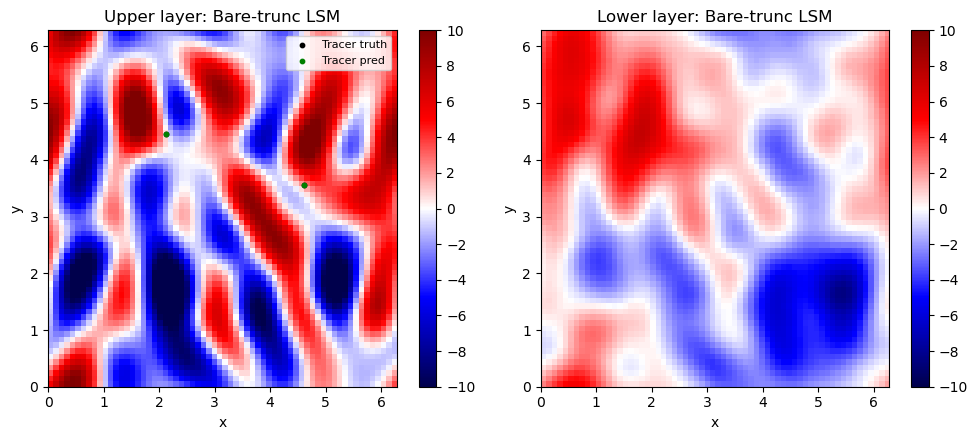

In [38]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(10., 10.)
plot_combined_fields_with_tracers(psi_truth[nt, :, :, 0], psi_truth[nt, :, :, 1], xy_obs[nt, :], xy_obs[nt, :], 'Bare-trunc LSM', colorlim)
plt.savefig('../figure/baretrunc_lsm_nu1e-6.png')

In [12]:
max_imag_abs

8.796313808062965e-15

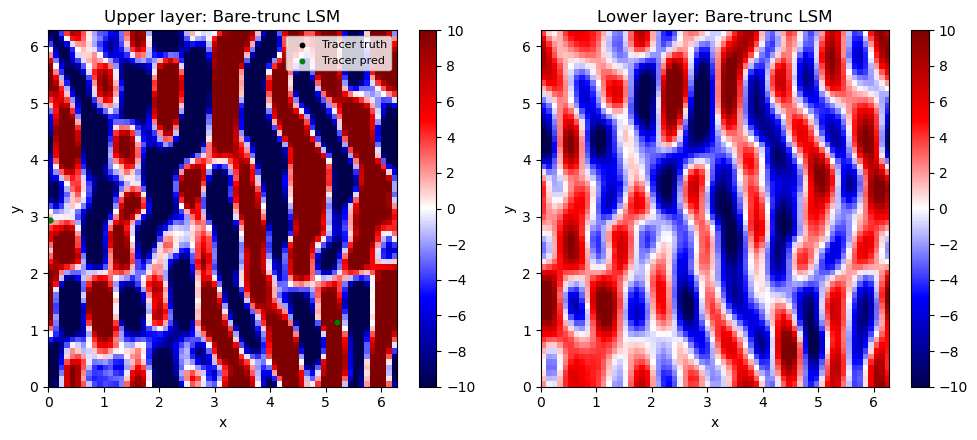

In [41]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(10., 10.)
plot_combined_fields_with_tracers(psi_truth[nt, :, :, 0], psi_truth[nt, :, :, 1], xy_obs[nt, :], xy_obs[nt, :], 'Bare-trunc LSM', colorlim)
plt.savefig('../figure/baretrunc_lsm_nu1e-12.png')

Bare-truncation linear model can not run for a long time stably. Reasons:  
1) The nonlinear Jacobian terms redistribute enery across different modes;
2) Compared to the LSMs calibrated on the full QG data, the damping terms of the bare truncation model (consisting of Ekman damping and viscous damping) are quite different. The calibrated LSMs show distinct patterns for modes |k| < 10 of damping and stochastic noises.

## Data

#### topo

In [2]:
data = np.load('../data/qg_data_sigmaxy01_t2000.npz')
K = data['K']
kd = data['kd']
kb = data['kb']
U = data['U']
r = data['r']
H = data['H']
nu = data['nu']
dt = data['dt']
L = data['L']
dt_ob = data['dt_ob']
xy_obs = data['xy_obs']
psi_noisy = data['psi_noisy']
sigma_obs = data['sigma_obs']
sigma_psi = data['sigma_psi']
psi_truth = data['psi_truth']
xy_truth = data['xy_truth']
sigma_xy = data['sigma_xy']

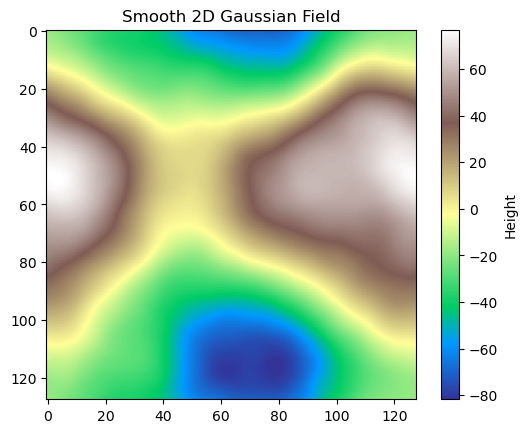

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def generate_topo(N=128, alpha=4.0):
    '''generate a gaussian random field as topography'''
    kx = np.fft.fftfreq(N).reshape(-1, 1)
    ky = np.fft.fftfreq(N).reshape(1, -1)
    k = np.sqrt(kx**2 + ky**2)
    k[0, 0] = 1e-6  # avoid division by zero
    spectrum = 1.0 / k**alpha # Power-law spectrum: 1 / k^alpha
    noise = np.random.normal(size=(N, N)) + 1j * np.random.normal(size=(N, N))
    fft_field = noise * np.sqrt(spectrum)
    field = np.fft.ifft2(fft_field).real
    field -= np.mean(field)
    field /= np.std(field)
    return field

field = generate_topo(N=128, alpha=6)
plt.imshow(40*field, cmap='terrain')
plt.colorbar(label='Height')
plt.title('Smooth 2D Gaussian Field')
plt.show()


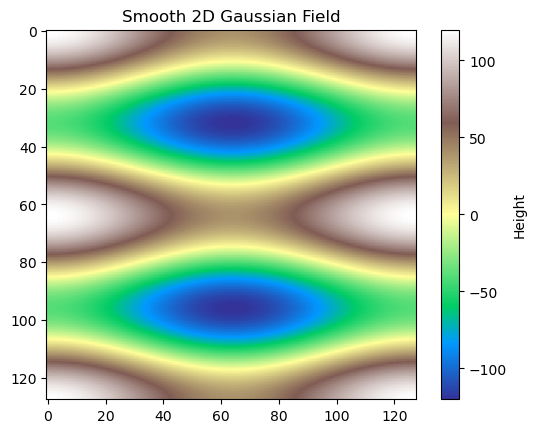

In [4]:
K = 128
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)

dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = 40 * (np.cos(X) + 2 * np.cos(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography
plt.imshow(topo, cmap='terrain')
plt.colorbar(label='Height')
plt.title('Smooth 2D Gaussian Field')
plt.show()

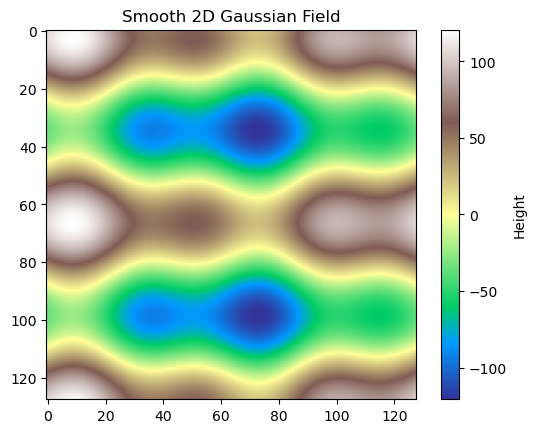

In [69]:
K = 128
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)

dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = 35 * (np.cos(X) + 2 * np.cos(2 * Y) + .5 * np.sin(3 * X) + .5 * np.sin(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography
plt.imshow(topo, cmap='terrain')
plt.colorbar(label='Height')
plt.title('Smooth 2D Gaussian Field')
plt.show()

#### t2000, subsampled

In [1]:
import numpy as np

# Load the .npz file
data = np.load('../data/qg_data_sigmaxy01_t2000.npz')

# Access variables
K = data['K']
kd = data['kd']
kb = data['kb']
U = data['U']
r = data['r']
H = data['H']
nu = data['nu']
dt = data['dt']
L = data['L']
dt_ob = data['dt_ob']
xy_obs = data['xy_obs']
psi_noisy = data['psi_noisy']
sigma_obs = data['sigma_obs']
sigma_psi = data['sigma_psi']
psi_truth = data['psi_truth']
xy_truth = data['xy_truth']
sigma_xy = data['sigma_xy']


In [2]:
psi_truth.shape

(50001, 64, 64, 2)

In [4]:
import numpy as np
from os.path import dirname, join as pjoin
# --------------------- load data --------------------------
train_size = 40000
test_size = 10000
# data_dir = '../data/'
# datafname = pjoin(data_dir, 'qg_data_sigmaxy01_subsampled.npz')
# data = np.load(datafname)
xy_truth_full = data['xy_truth']
x_truth_full = xy_truth_full[..., 0]
y_truth_full = xy_truth_full[..., 1]
xy_train = xy_truth_full[:train_size]
x_train = xy_train[..., 0]
y_train = xy_train[..., 1]
xy_test = xy_truth_full[train_size: train_size+test_size]
x_test = xy_test[..., 0]
y_test = xy_test[..., 1]

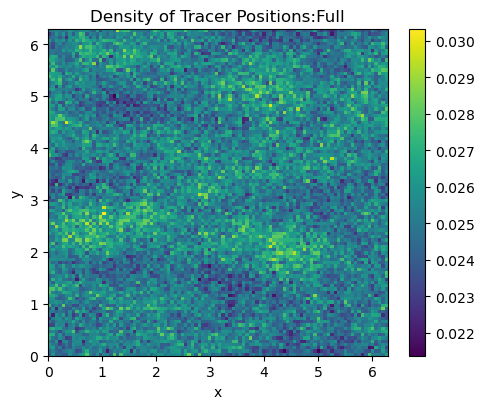

In [5]:
from plot import plot_2d_density
plot_2d_density(x_truth_full.flatten(), y_truth_full.flatten(), bins=100, density=True, dataset='Full')
# plt.savefig('../figure/tracer_density_full.png')

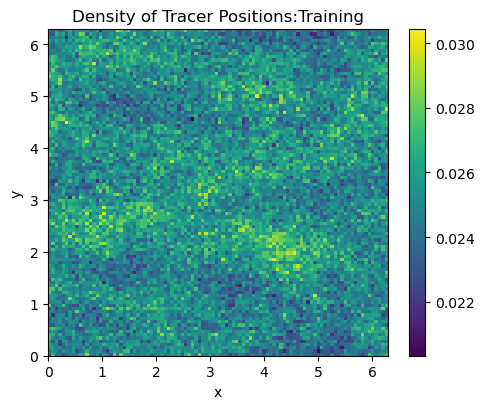

In [6]:
plot_2d_density(x_train.flatten(), y_train.flatten(), bins=100, density=True, dataset='Training')
# plt.savefig('../figure/tracer_density_train.png')

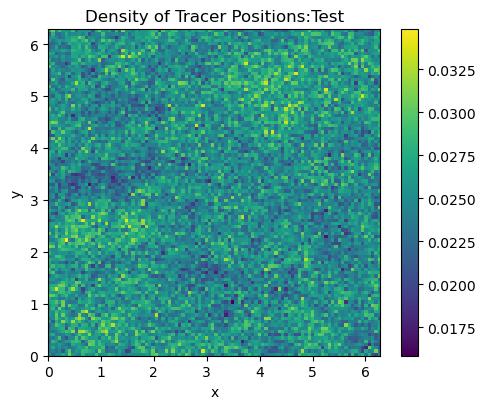

In [7]:
plot_2d_density(x_test.flatten(), y_test.flatten(), bins=100, density=True, dataset='Test')
# plt.savefig('../figure/tracer_density_test.png')

## CGKN traing

###### check training/test dataset distribution (in-distribution)

In [26]:
import numpy as np
from os.path import dirname, join as pjoin
# --------------------- load data --------------------------
train_size = 8000
test_size = 2000
data_dir = '../data/'
datafname = pjoin(data_dir, 'qg_data_sigmaxy01.npz')
data = np.load(datafname)
xy_truth_full = data['xy_truth']
x_truth_full = xy_truth_full[..., 0]
y_truth_full = xy_truth_full[..., 1]
xy_train = xy_truth_full[:train_size]
x_train = xy_train[..., 0]
y_train = xy_train[..., 1]
xy_test = xy_truth_full[train_size: train_size+test_size]
x_test = xy_test[..., 0]
y_test = xy_test[..., 1]

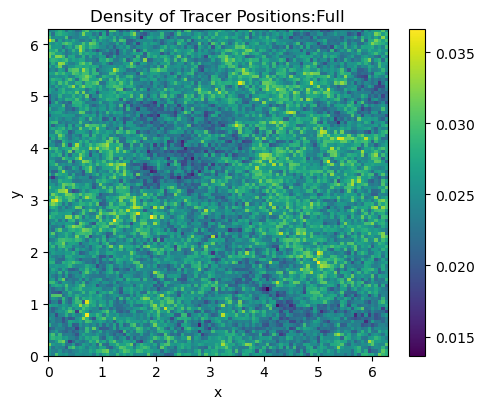

In [32]:
plot_2d_density(x_truth_full.flatten(), y_truth_full.flatten(), bins=100, density=True, dataset='Full')
plt.savefig('../figure/tracer_density_full.png')

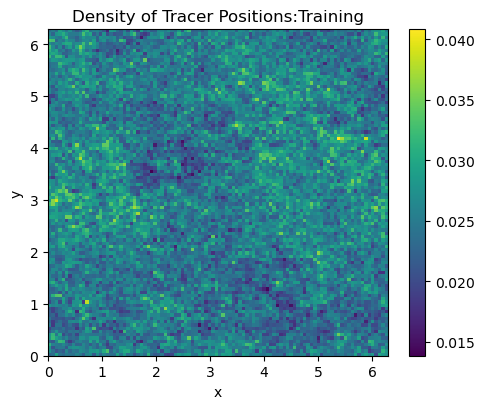

In [33]:
plot_2d_density(x_train.flatten(), y_train.flatten(), bins=100, density=True, dataset='Training')
plt.savefig('../figure/tracer_density_train.png')

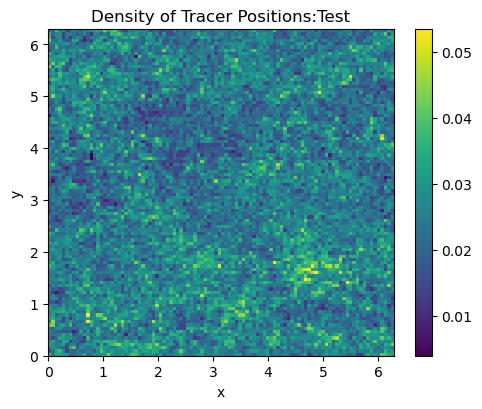

In [34]:
plot_2d_density(x_test.flatten(), y_test.flatten(), bins=100, density=True, dataset='Test')
plt.savefig('../figure/tracer_density_test.png')

###### dimz=16*16, loss_total = loss_forecast_u1 + loss_forecast_u2 + loss_ae + loss_forecast_z + loss_da

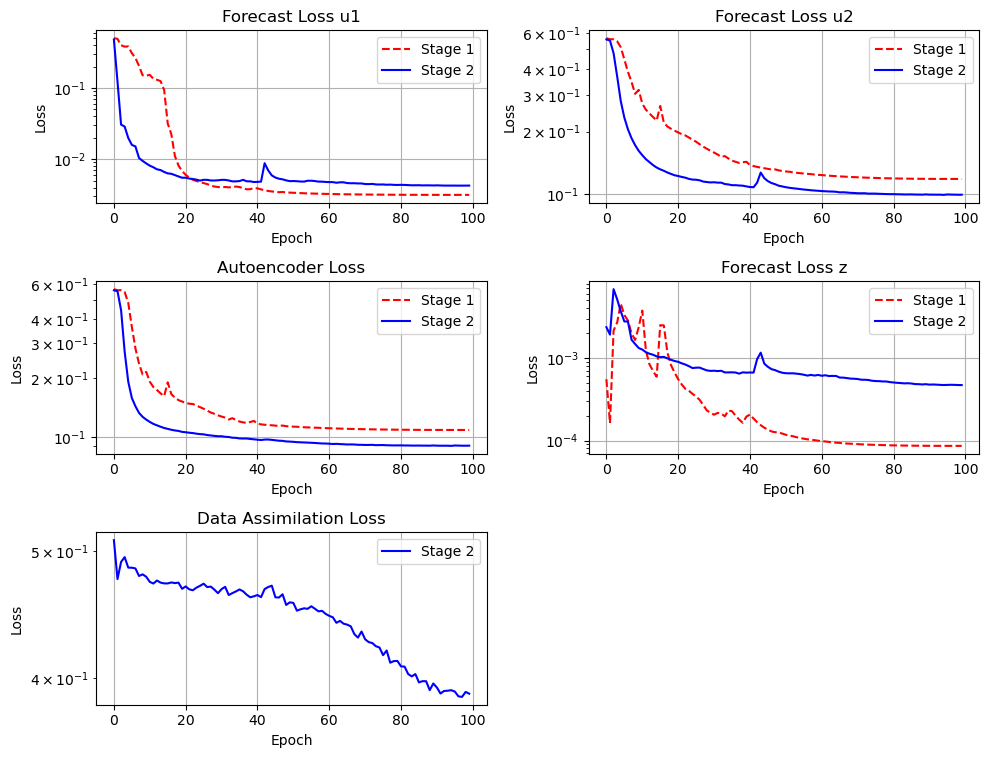

In [95]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 100
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


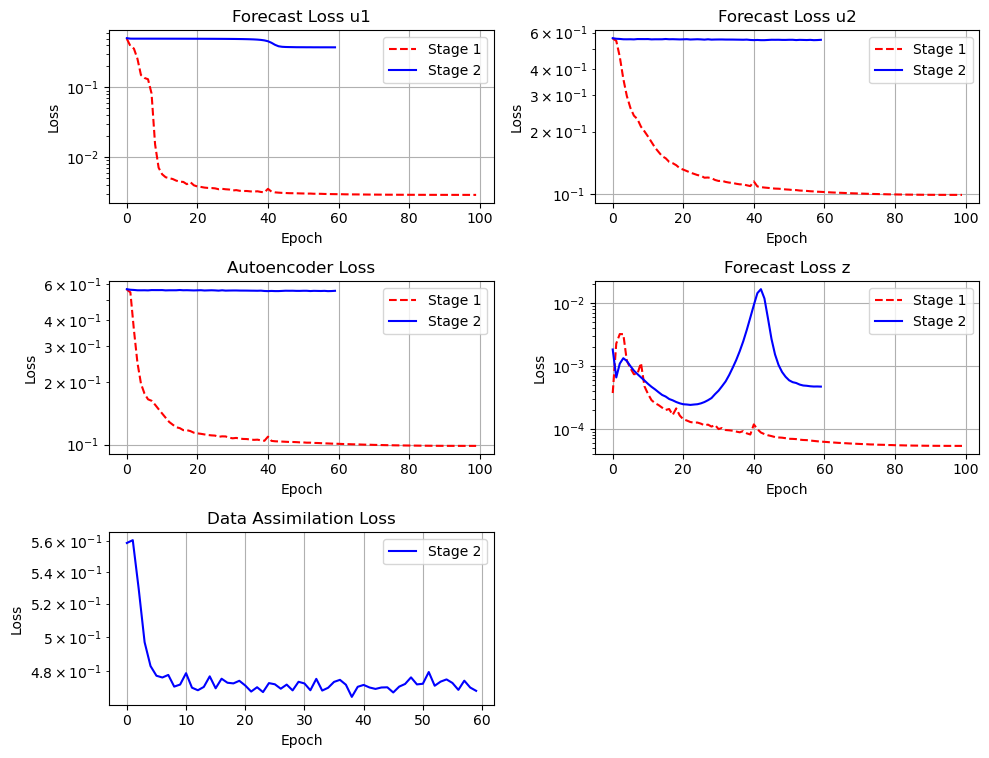

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


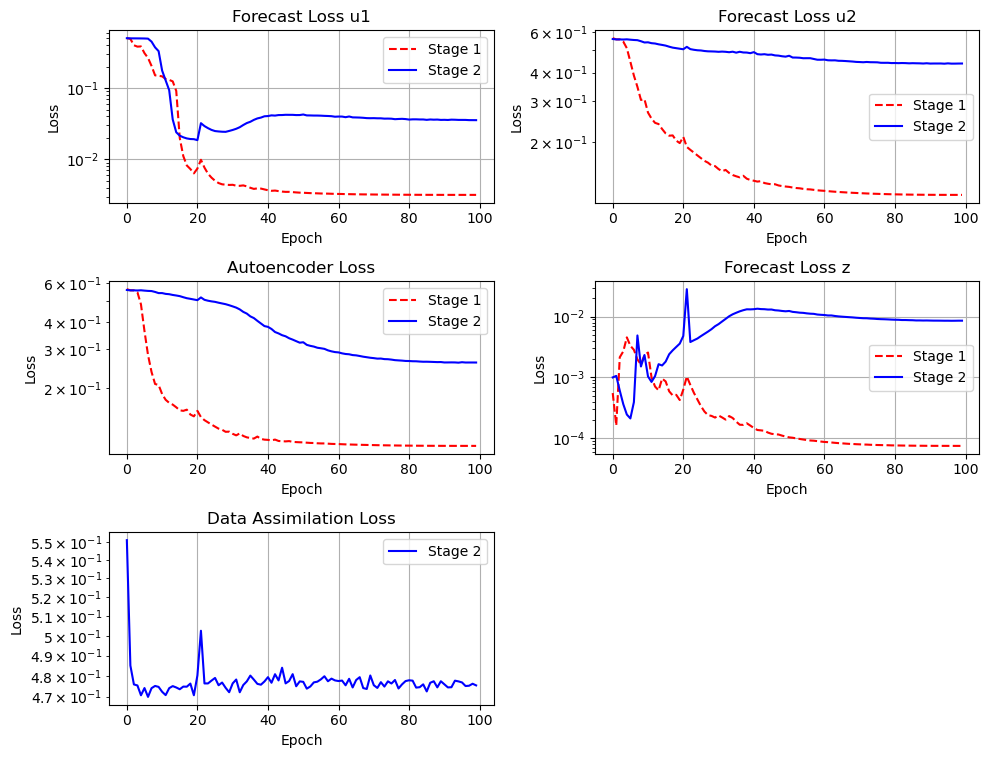

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 100
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


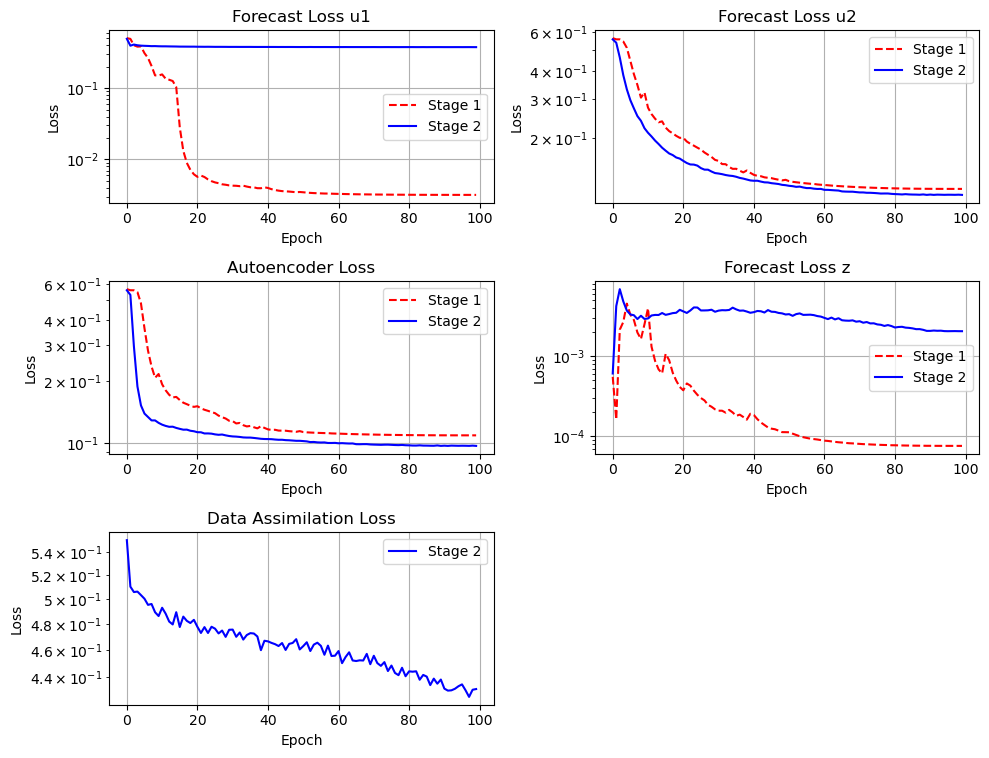

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


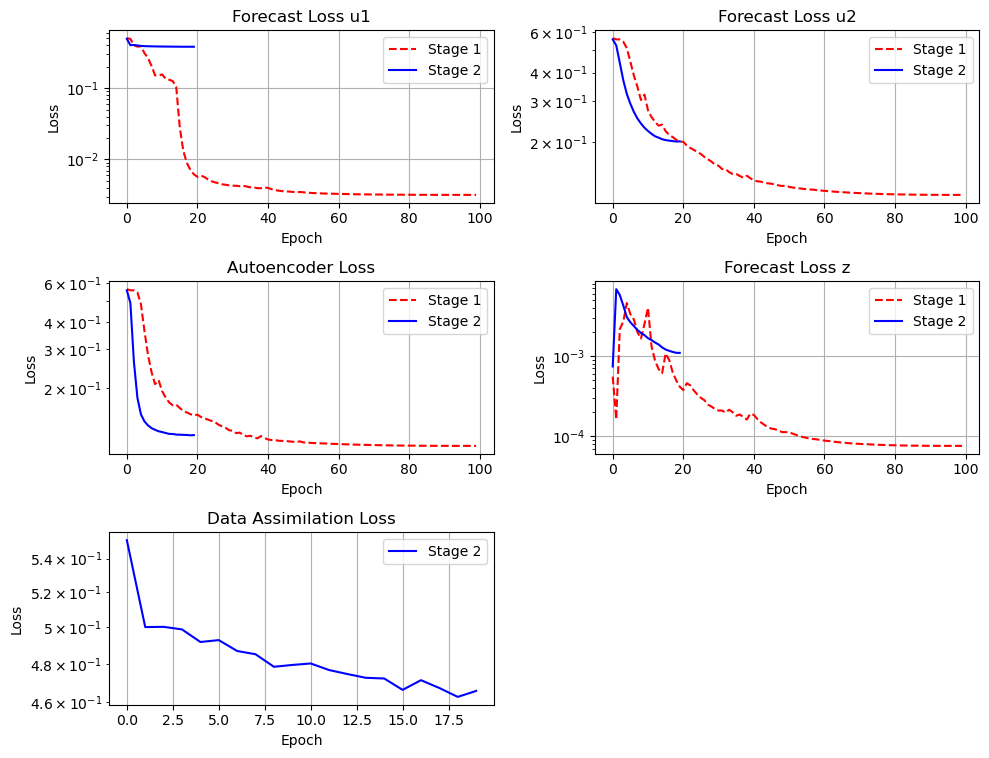

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


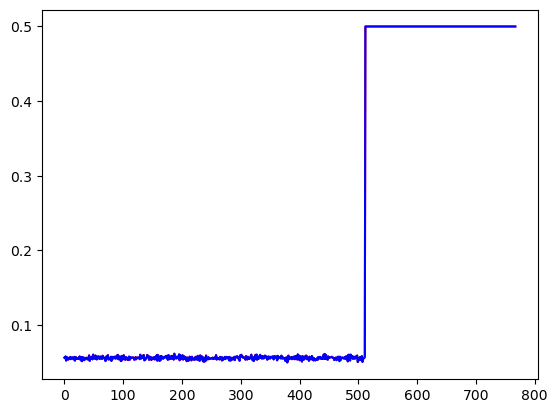

In [8]:
sigma_hat0 = np.load(r"../data/CGKN_old_sigmaxy01_xy_unit_Sigma_compare0.npy")
sigma_hat1 = np.load(r"../data/CGKN_old_sigmaxy01_xy_unit_Sigma_compare1.npy")
plt.plot(sigma_hat0, 'r')
plt.plot(sigma_hat1, 'b')

learning rate 1e-3

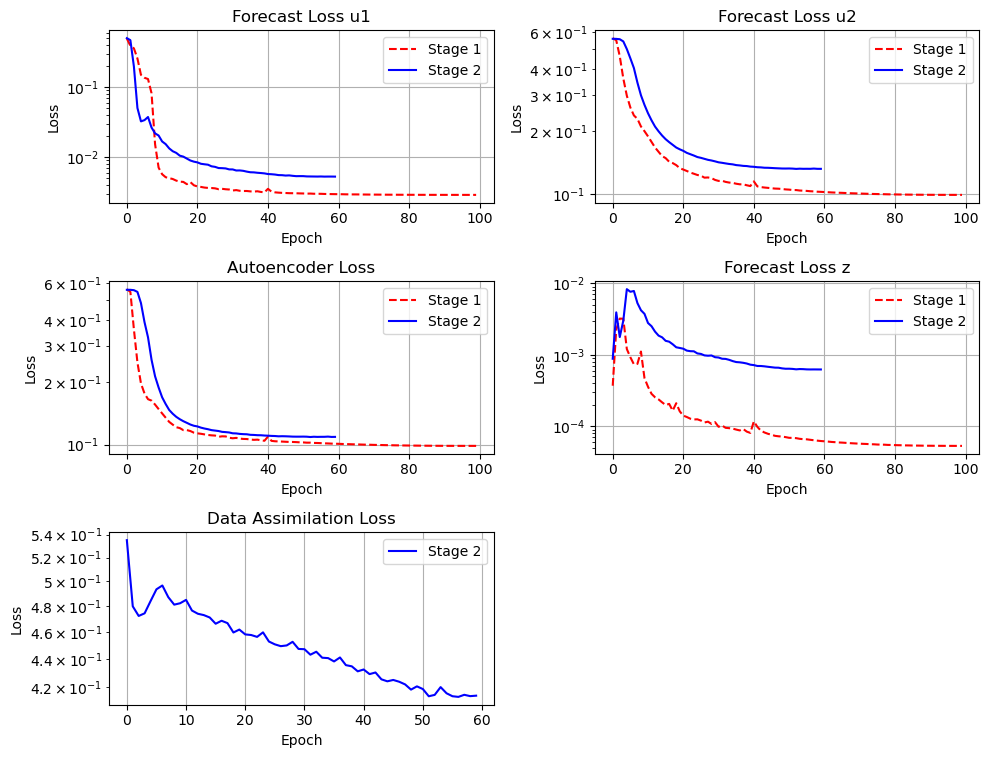

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


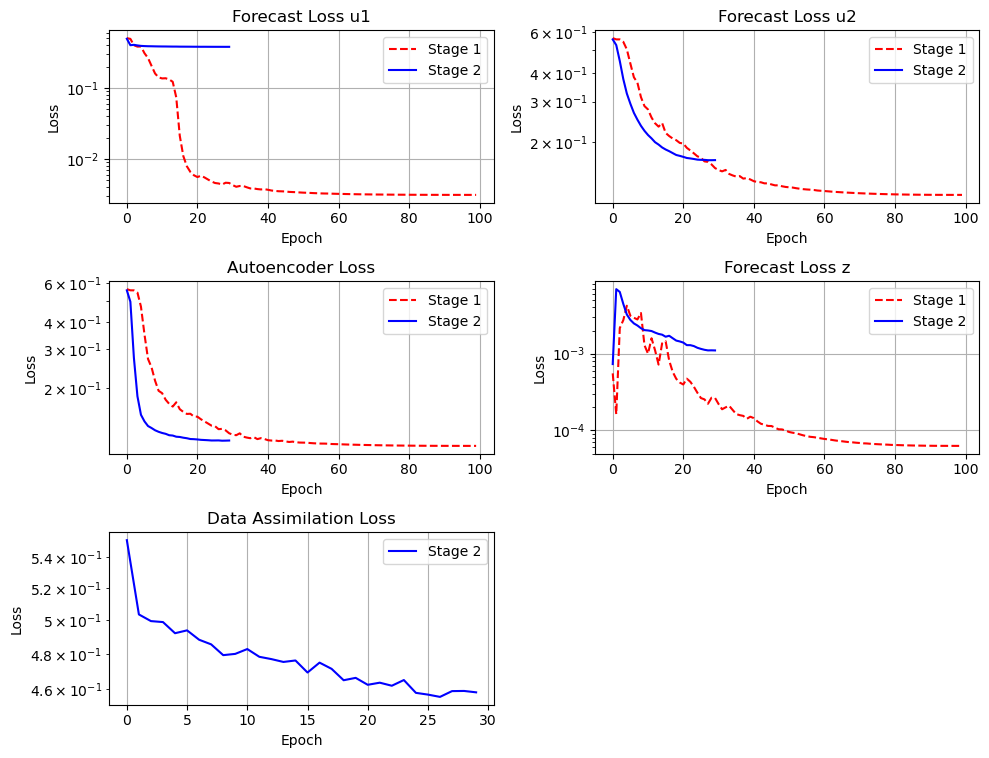

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


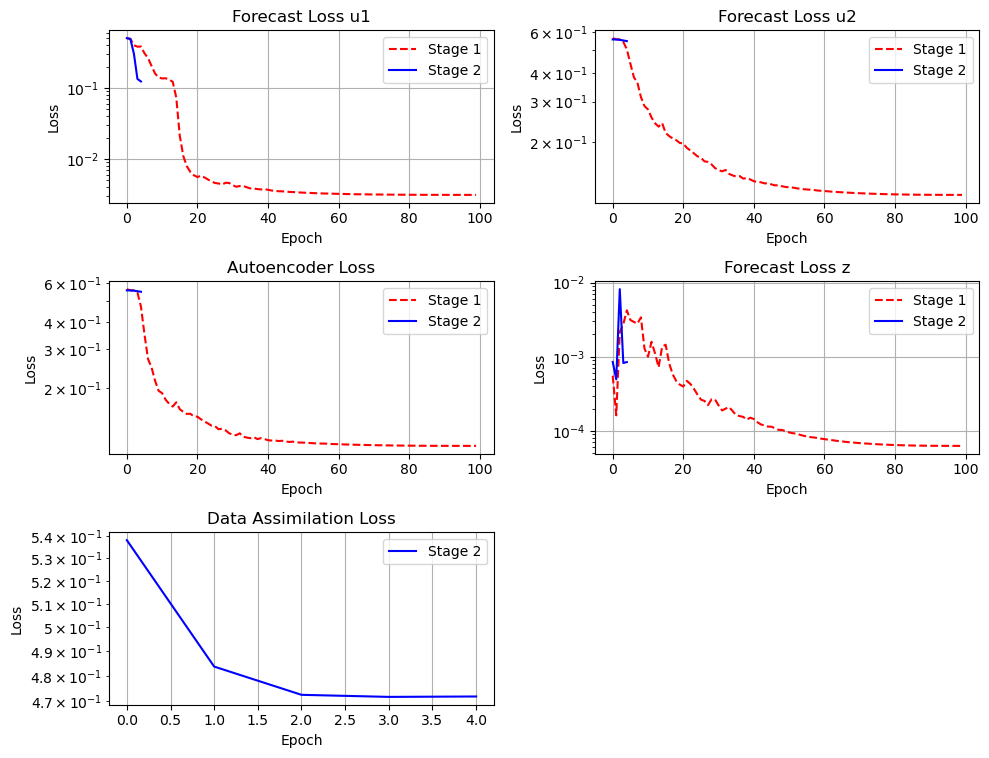

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


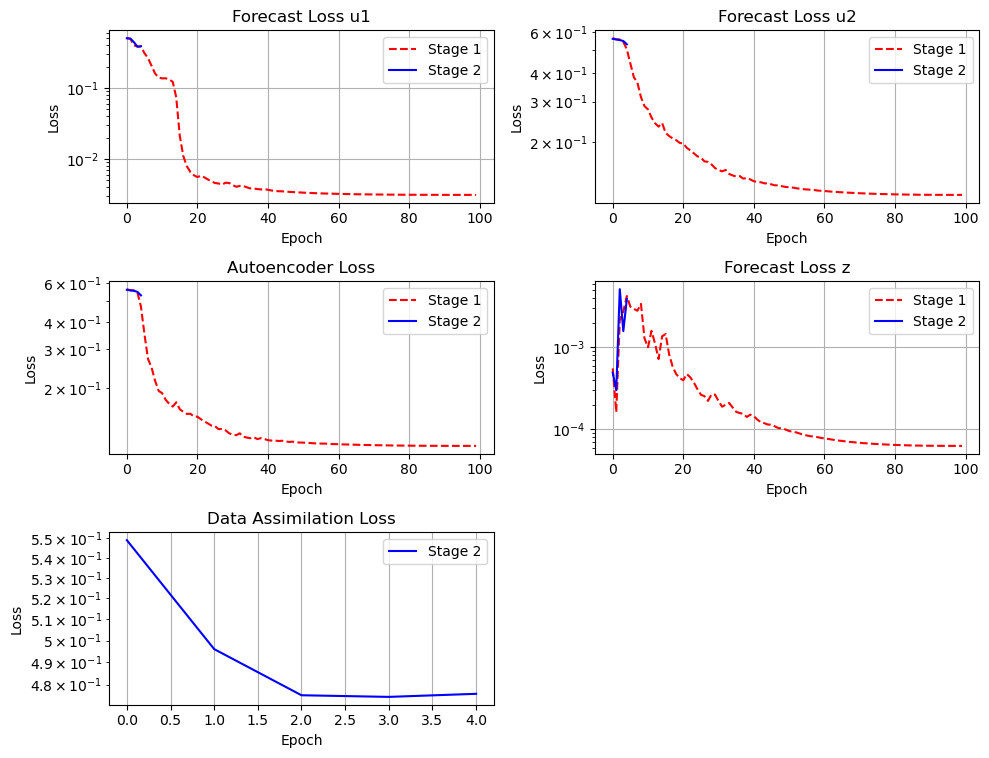

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_old1_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=16*16, unit tracer positions, physics

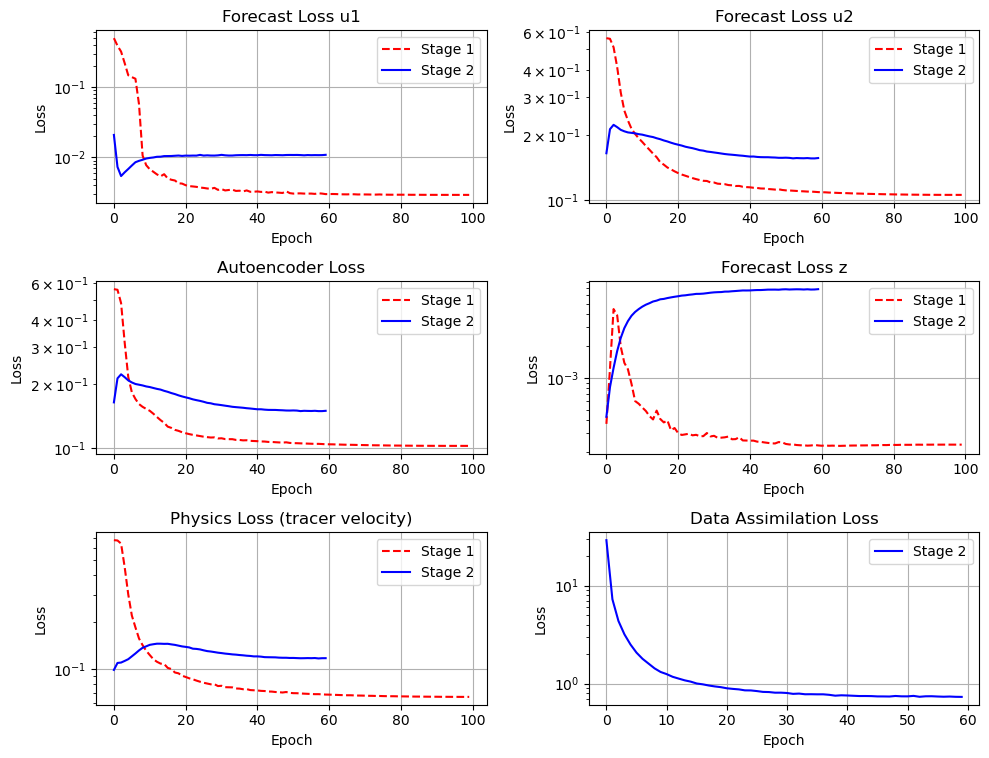

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


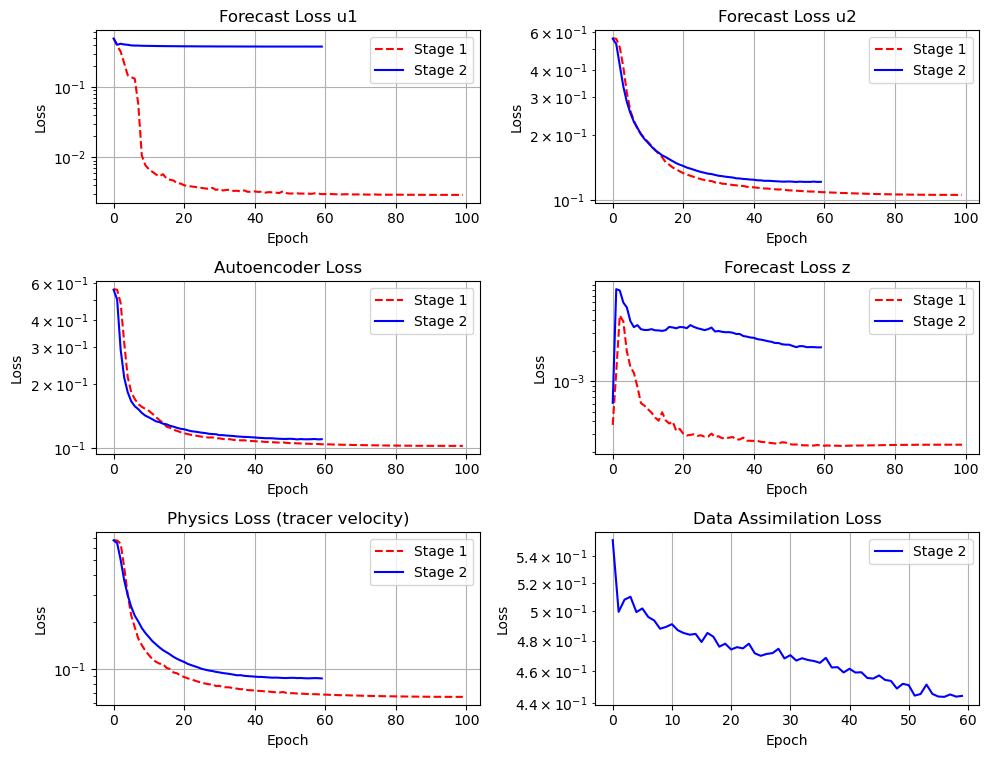

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


sigma_u2 = 0.1

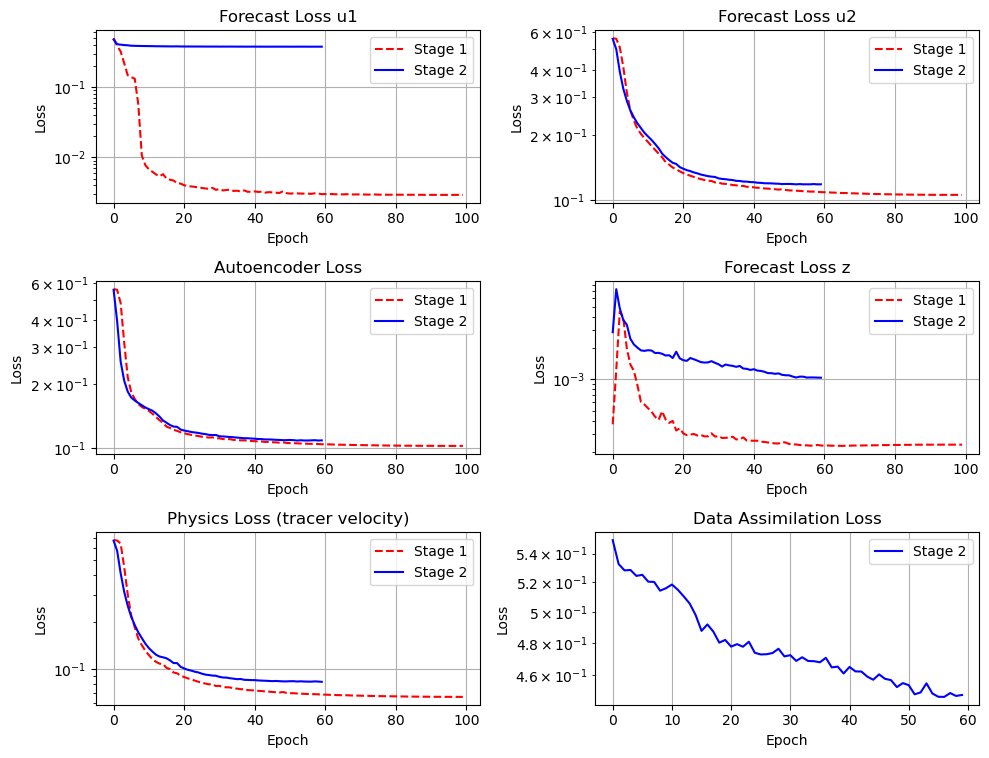

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


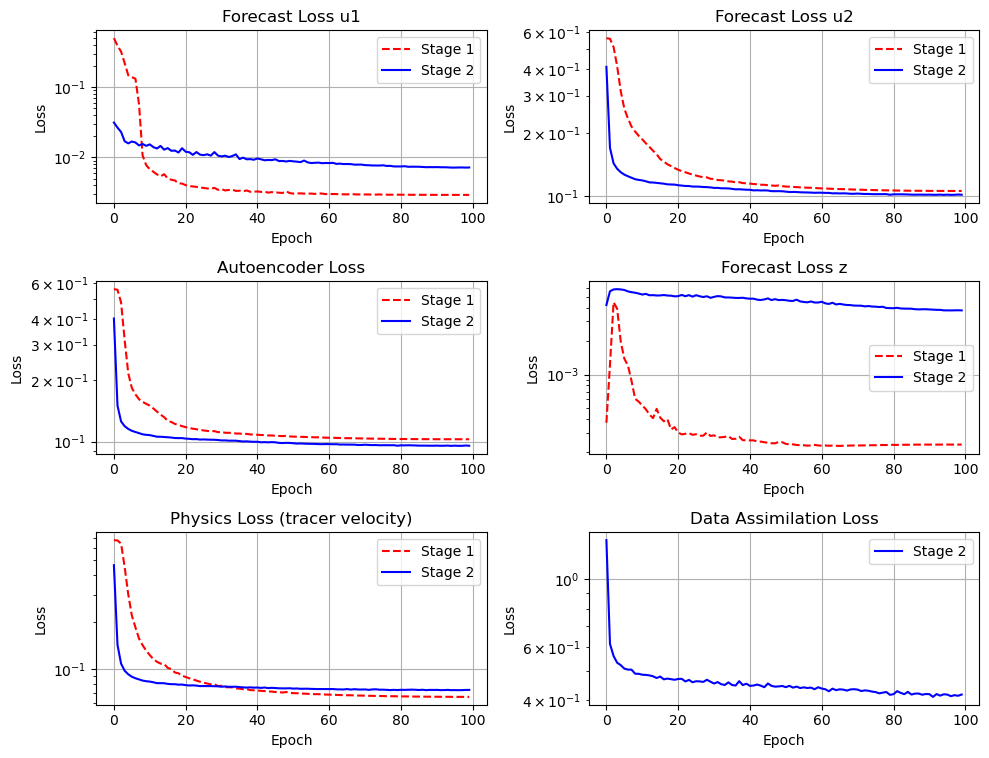

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


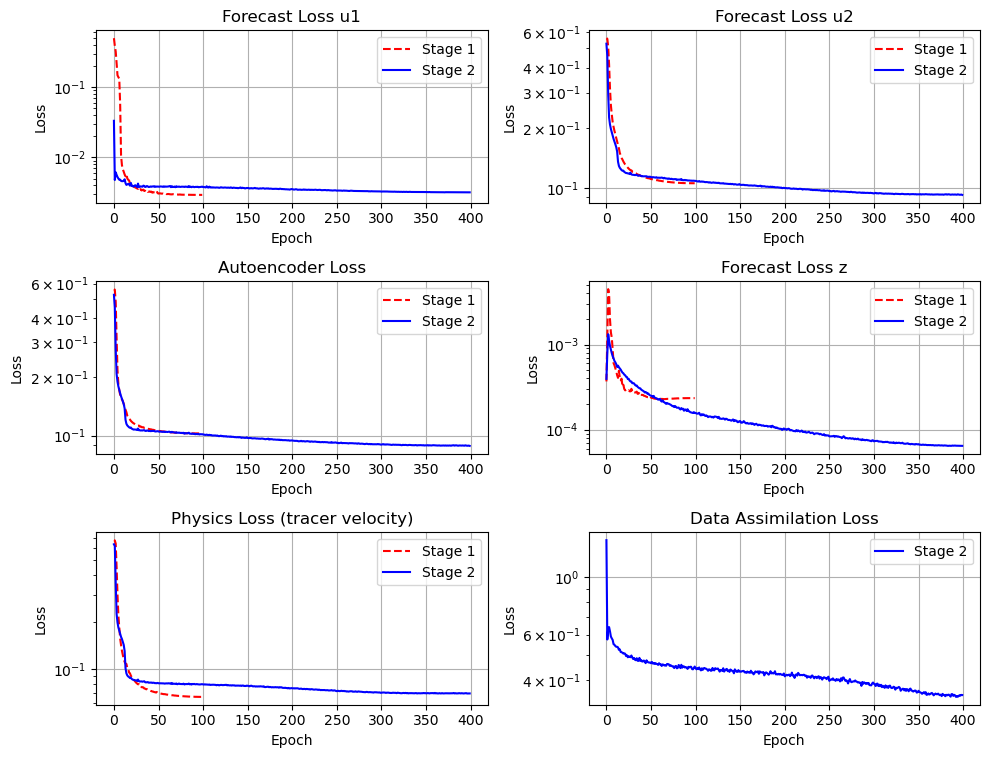

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


weight decay 1e-5, f1,g1 layer:5

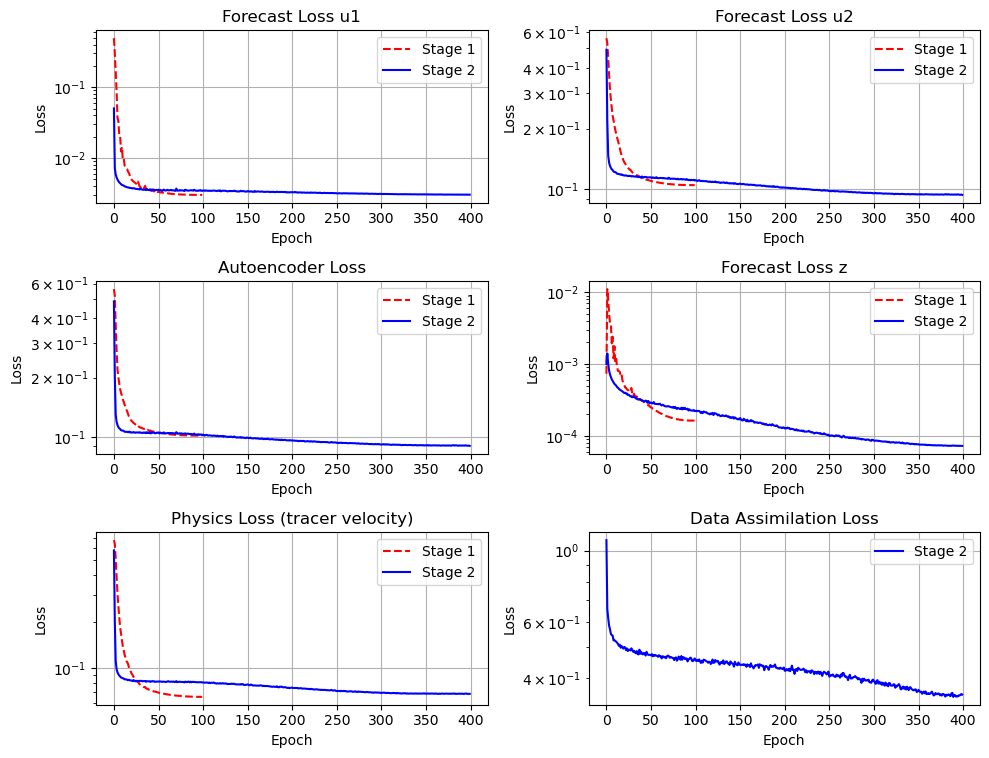

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


weight decay 1e-4, f1,g1 layer:3

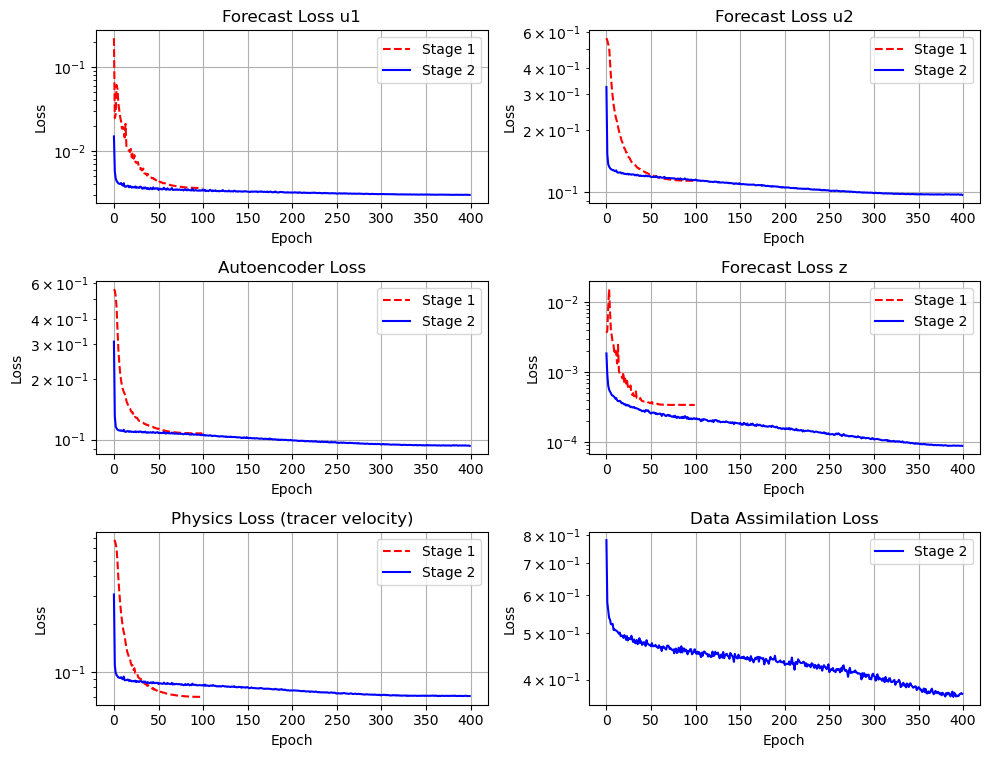

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


weight decay 1e-3, f1,g1 layer:3

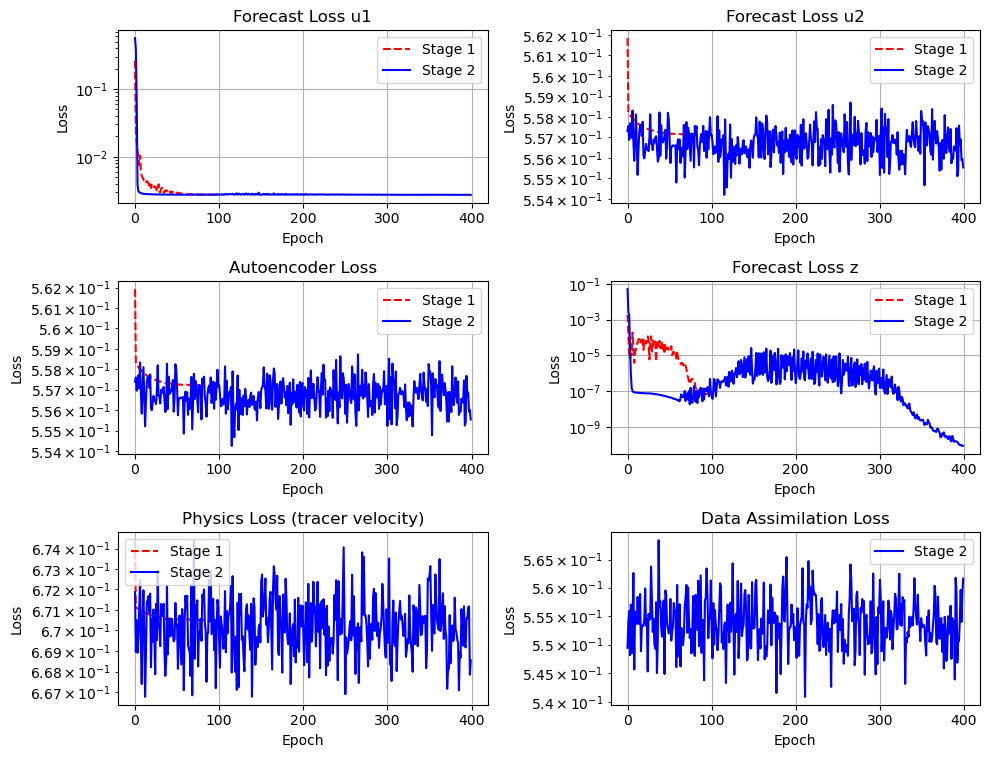

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_weightdecay_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


cgn:3layer, encoder:5layer

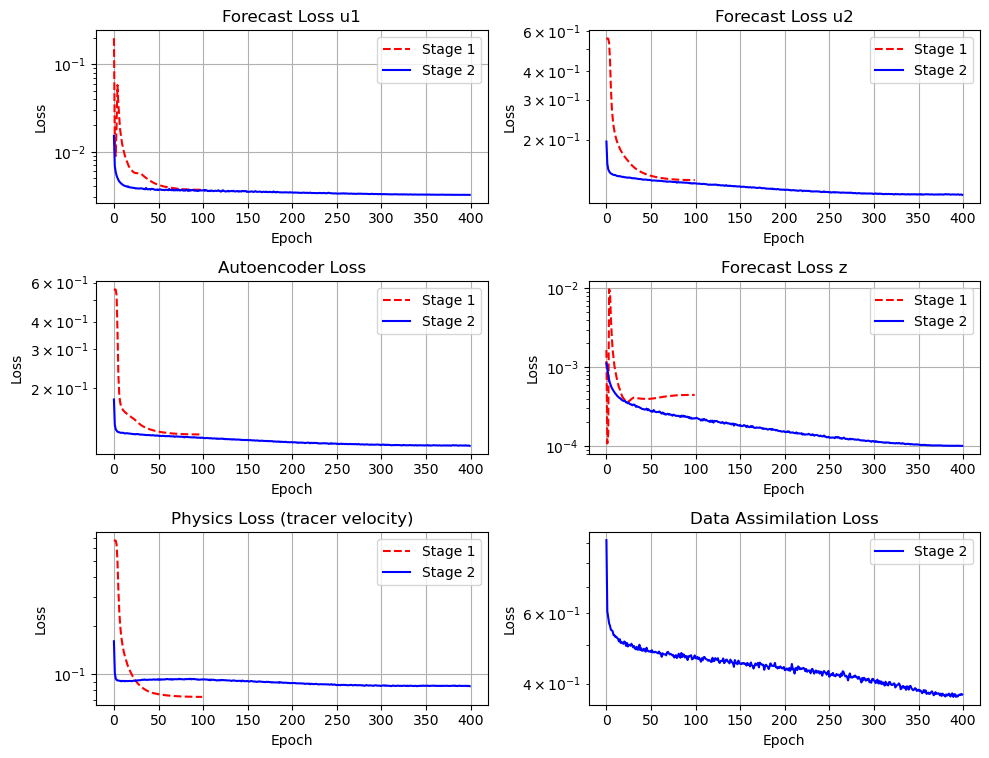

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_encoder5lyr_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


sigma_u2 = 0.01

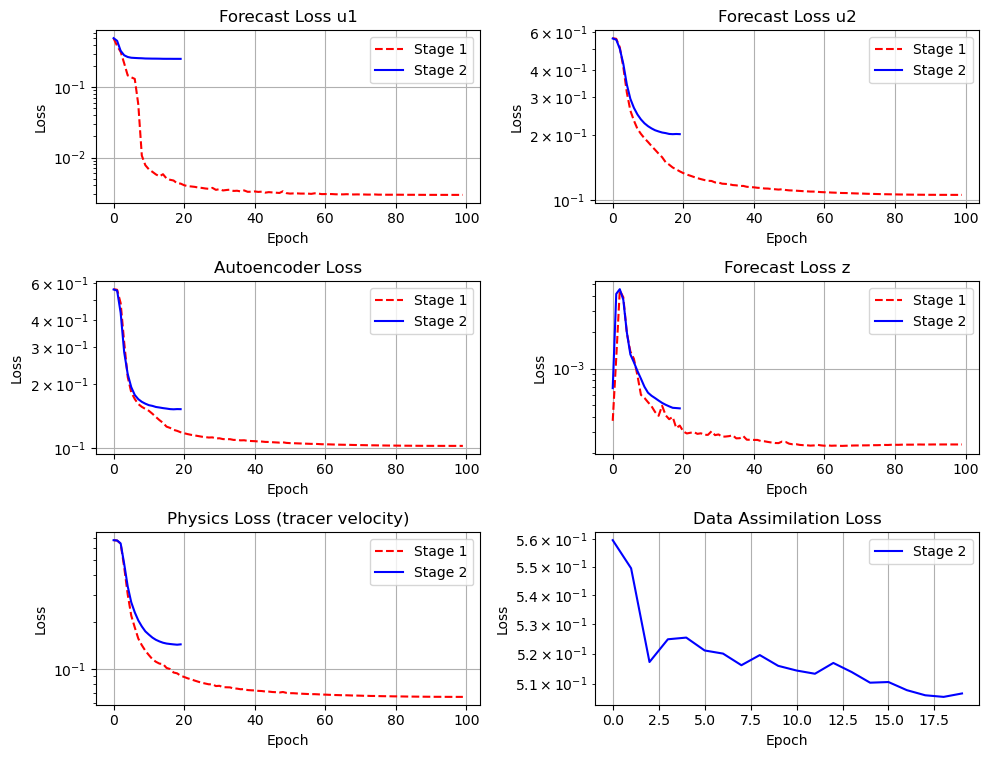

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


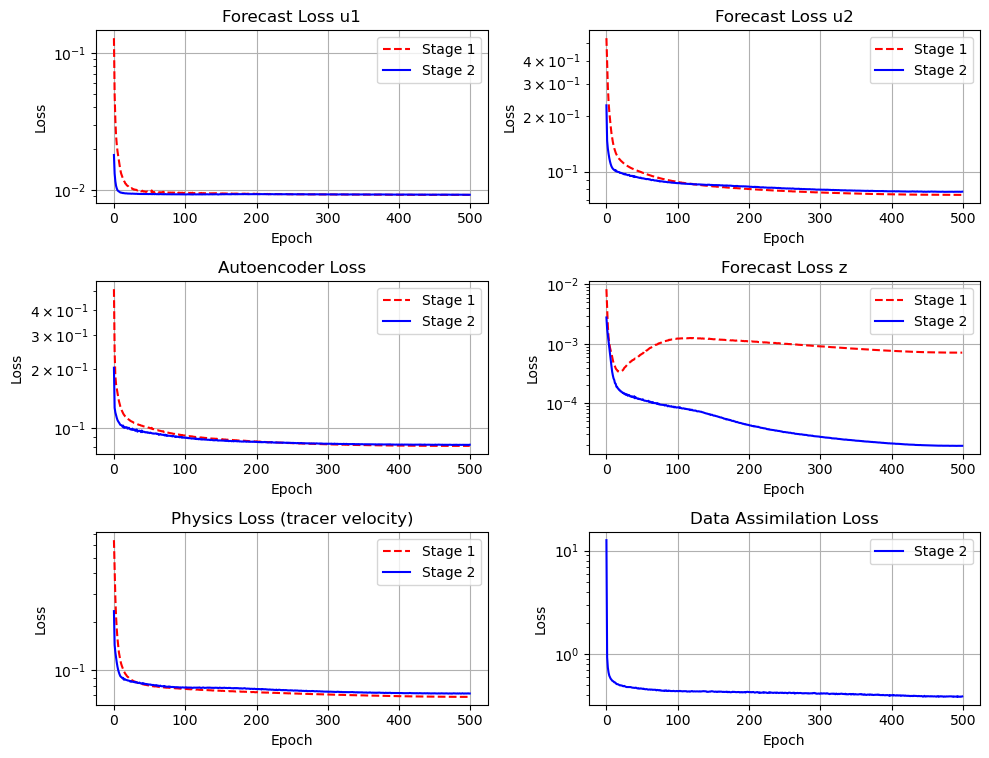

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 20000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


t1000, subsampled

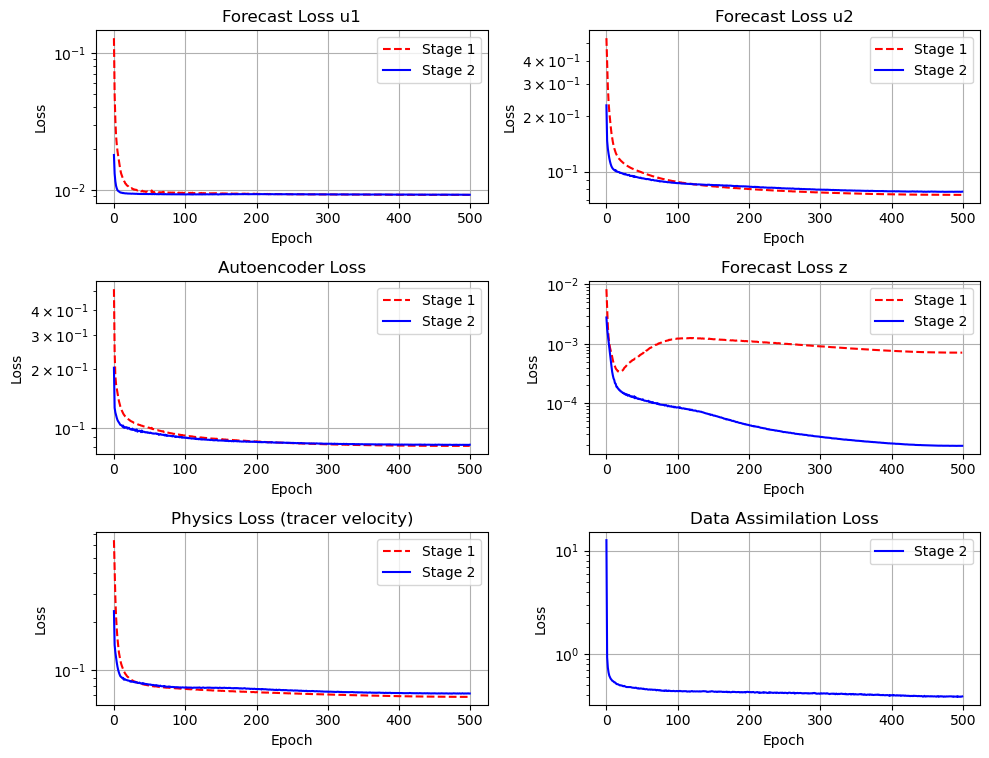

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 20000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dim_z=16x16x2

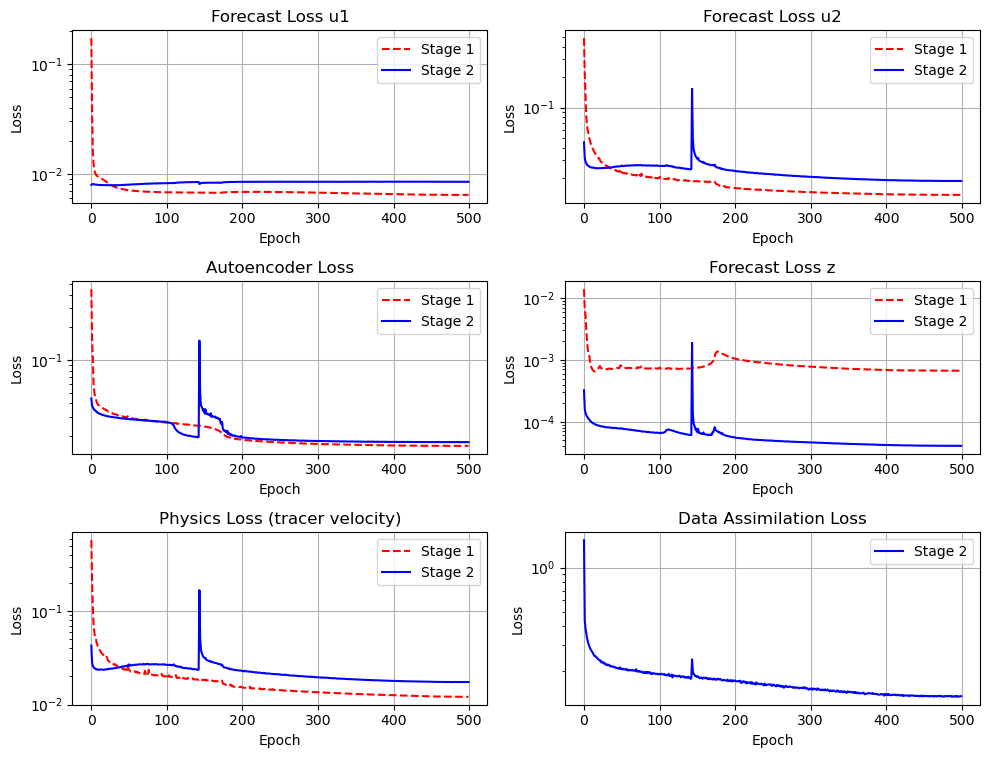

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 20000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


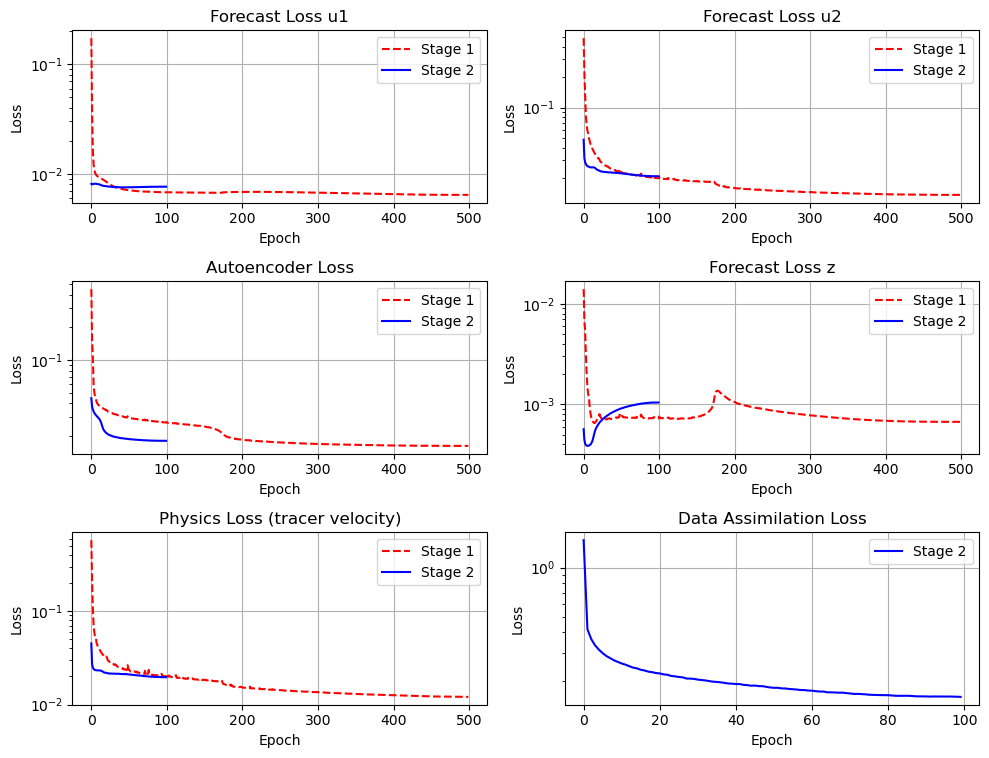

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 20000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_batchda_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_batchda_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_batchda_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_batchda_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_batchda_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_batchda_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


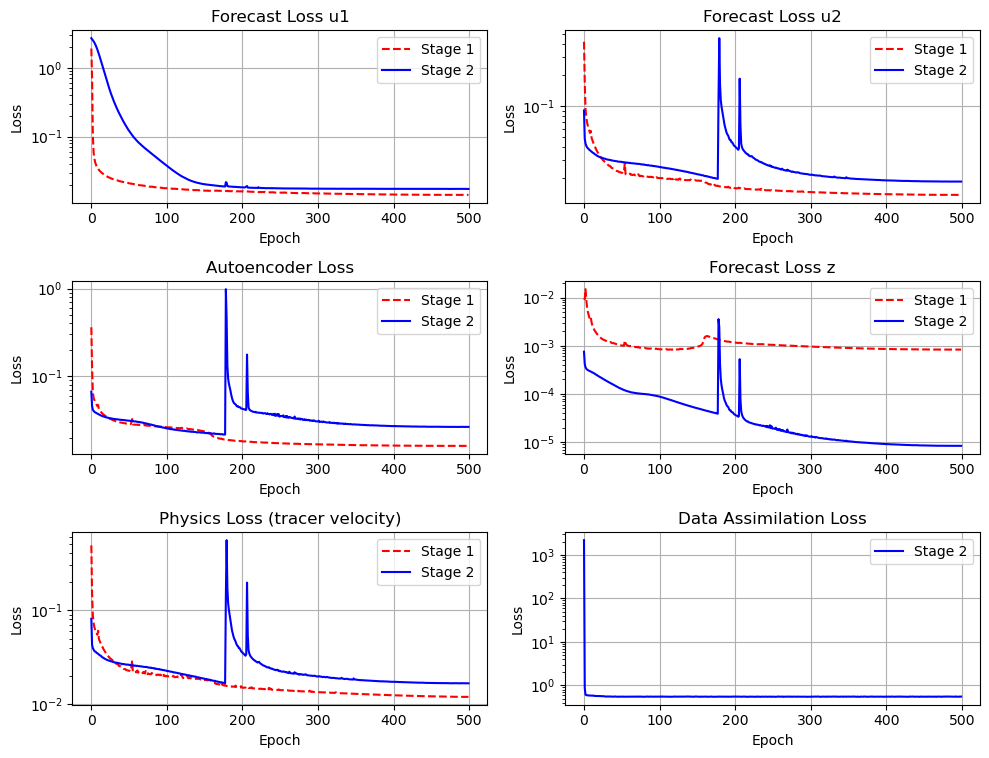

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 200
num_samples = 20000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_forecast_z_history_stage1.npy",
    "physics_stage1":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_physics_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_forecast_z_history_stage2.npy",
    "physics_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_physics_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_64x64_sigmaxy01_CGKN_physics_dimz256_realxy_wrappedloss_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    ("physics_stage1",  "physics_stage2",  "Physics Loss (tracer velocity)"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=16*16, continuous tracer positions, f2(x), g2(x)

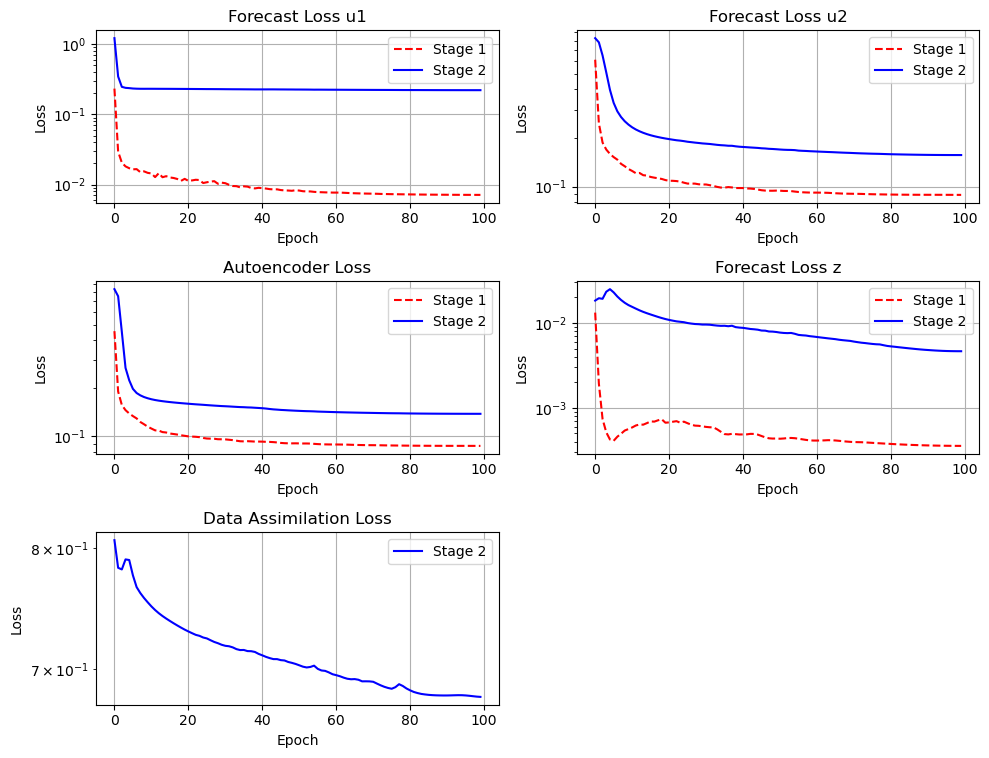

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


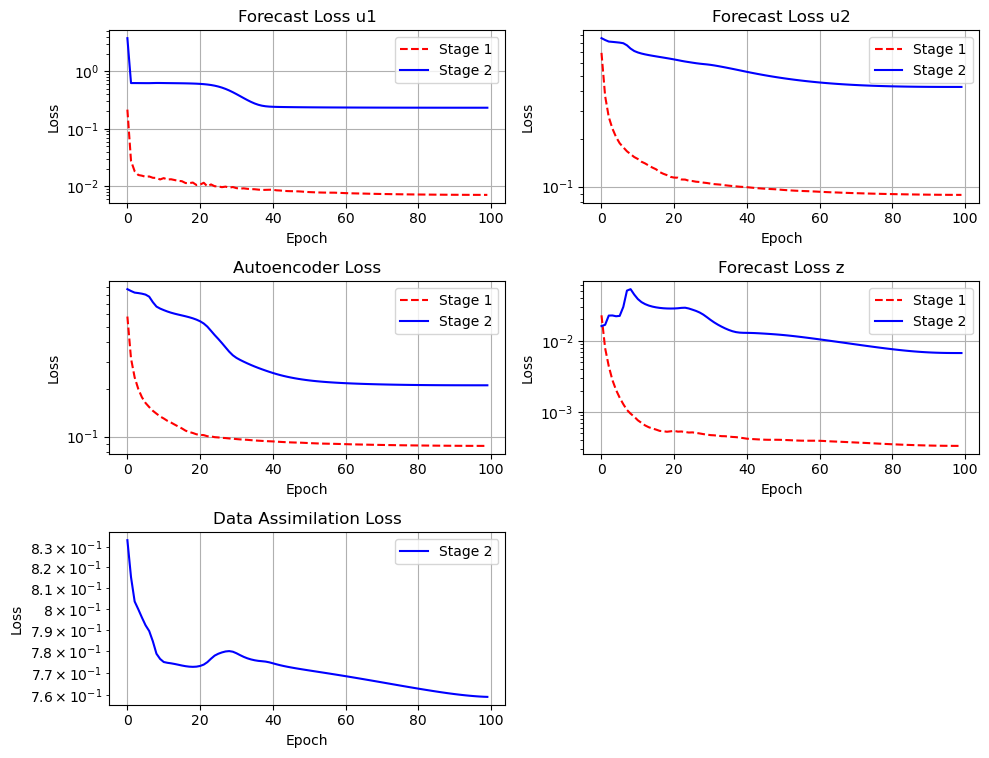

In [86]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


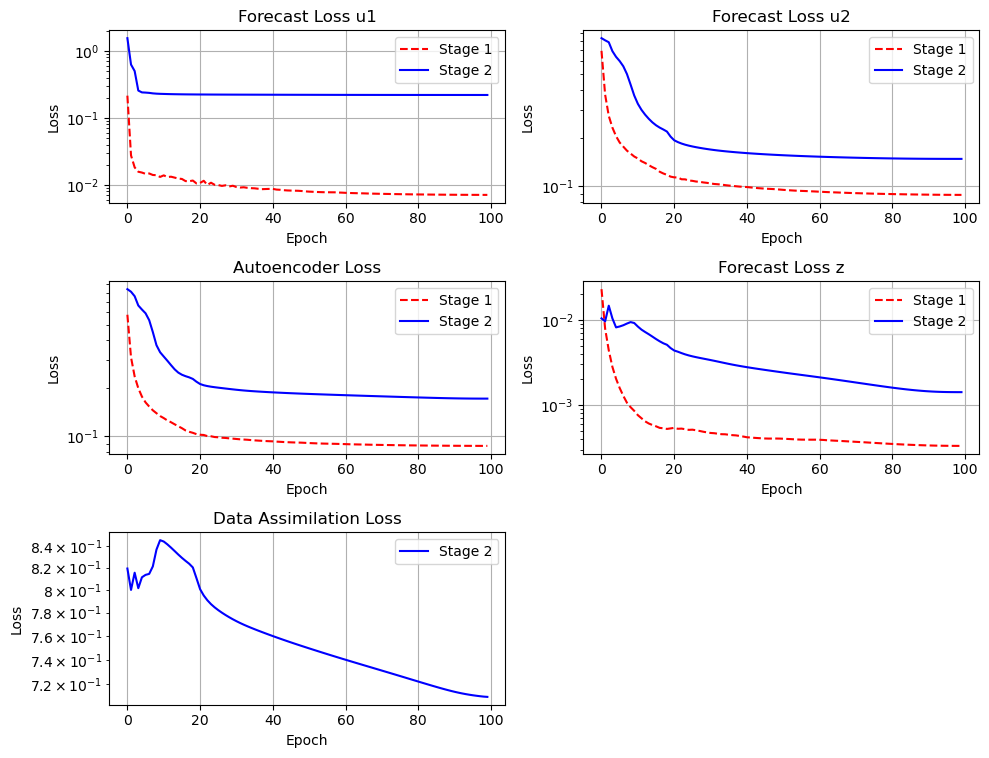

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_f2g2small_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=16*16, continuous tracer positions, memory

without including u[n]

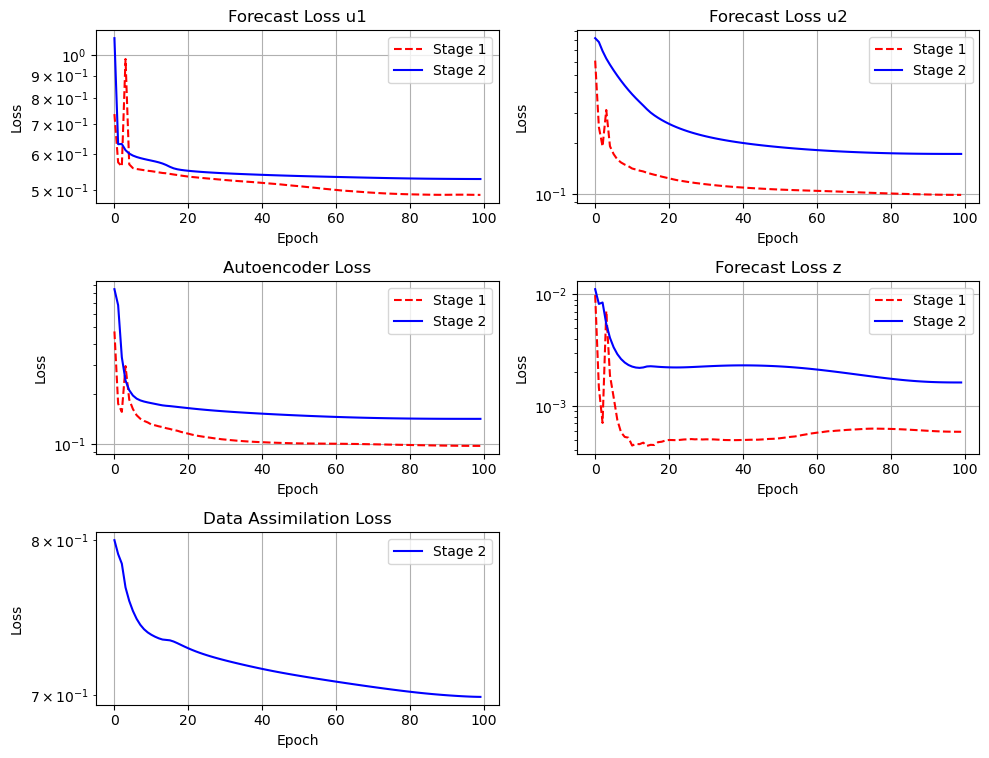

In [102]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


including u[n]

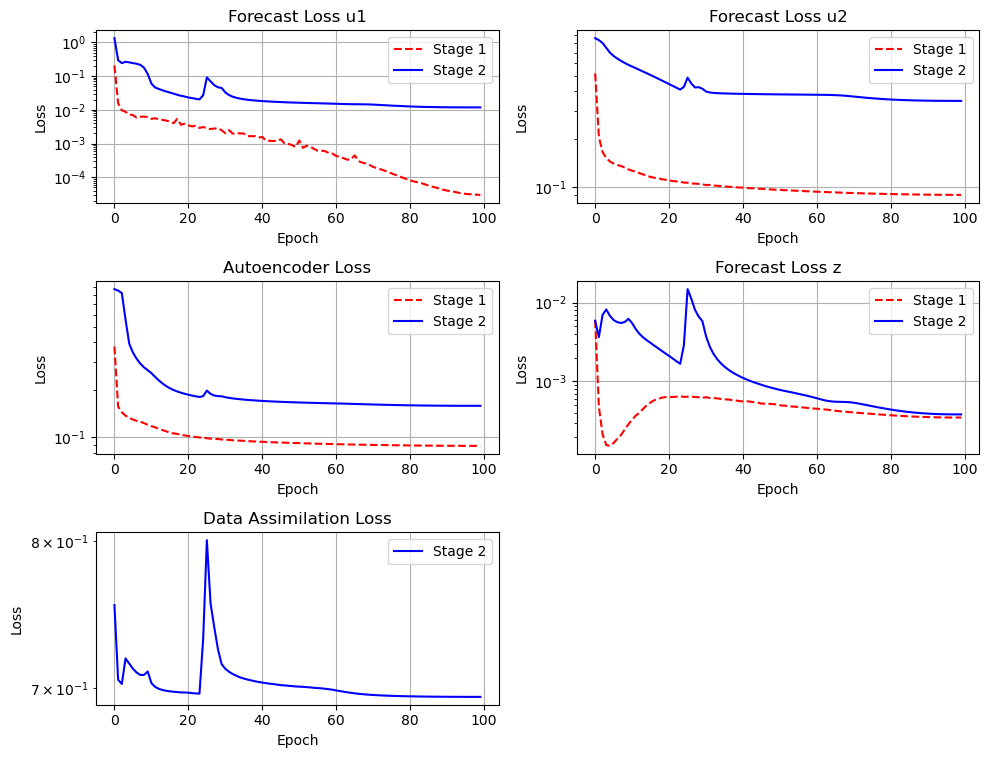

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


needs further stablize the training

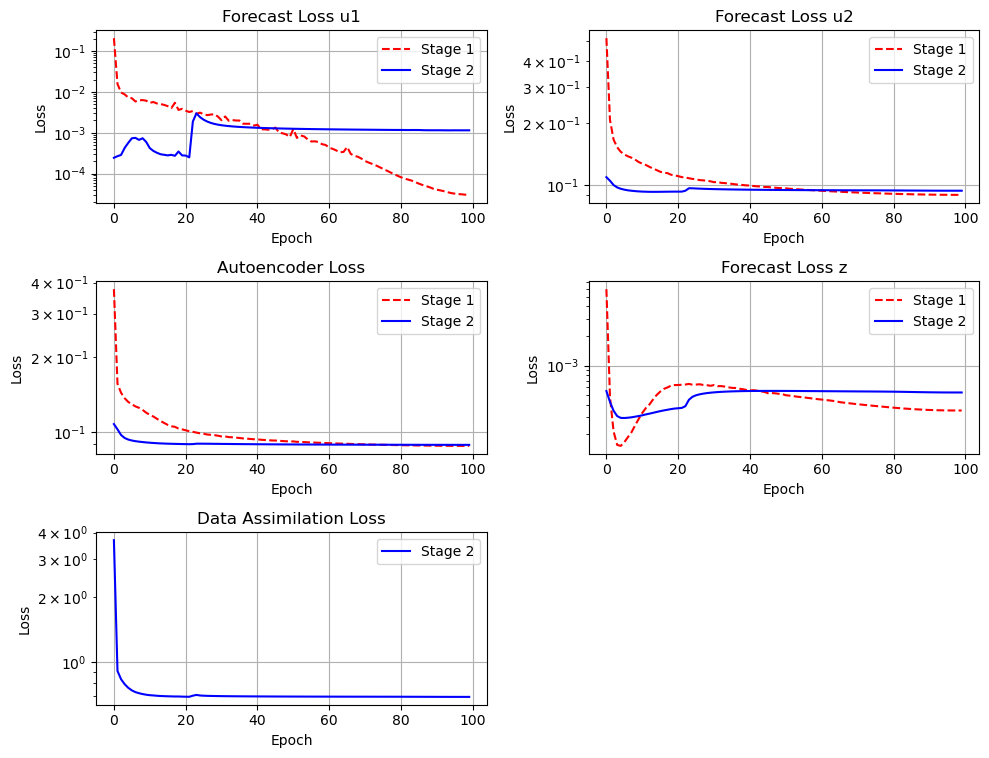

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_initstg1_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_initstg1_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_initstg1_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_initstg1_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_memory_initstg1_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=16*16, unit tracer positions, memory

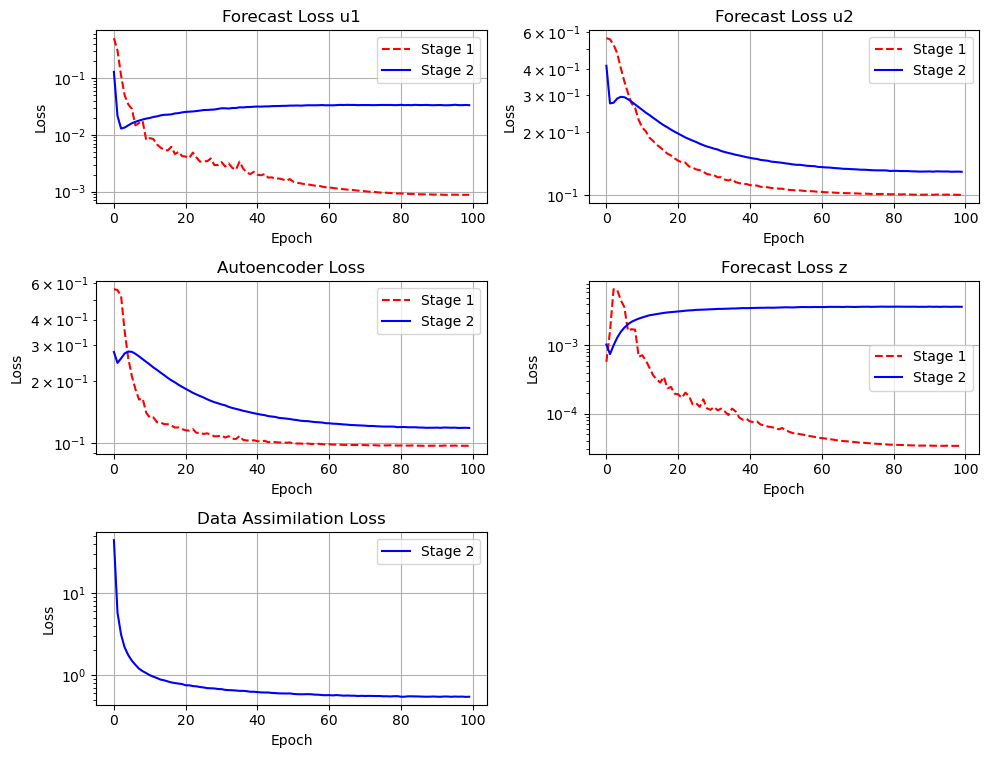

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_initstg1_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_initstg1_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_initstg1_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_initstg1_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_initstg1_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 1 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage1' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch=40)

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch=80)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


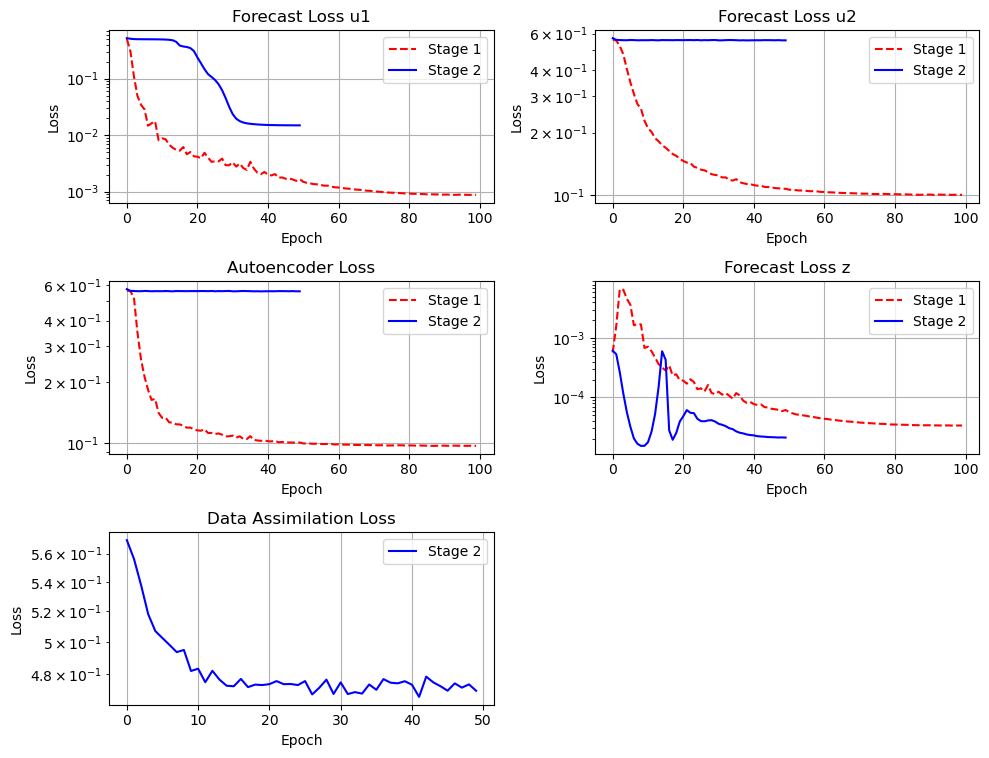

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 1 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage1' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch=40)

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch=40)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


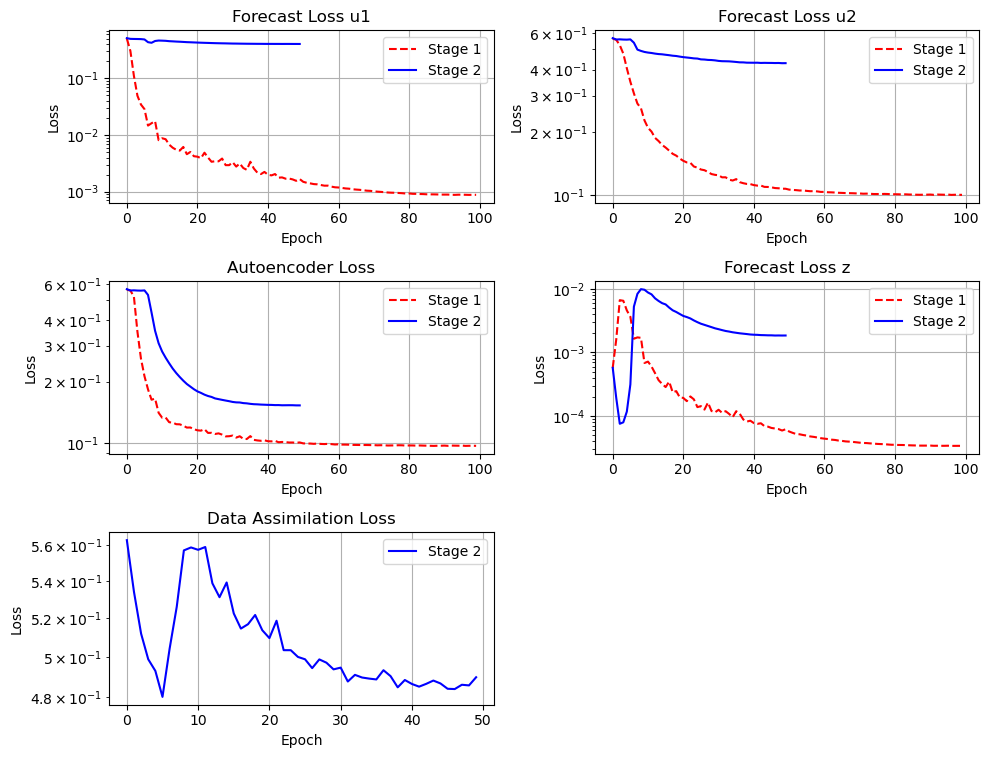

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_memory_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 1 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage1' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch=40)

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch=80)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=16*16, continuous tracer positions (no jump)

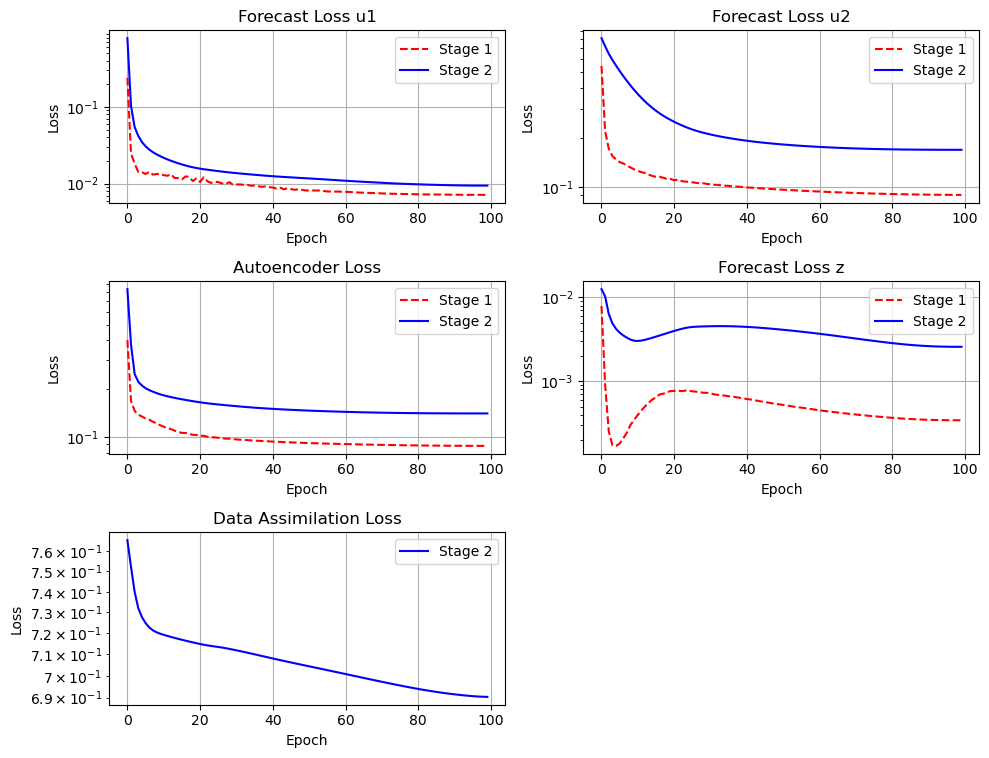

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


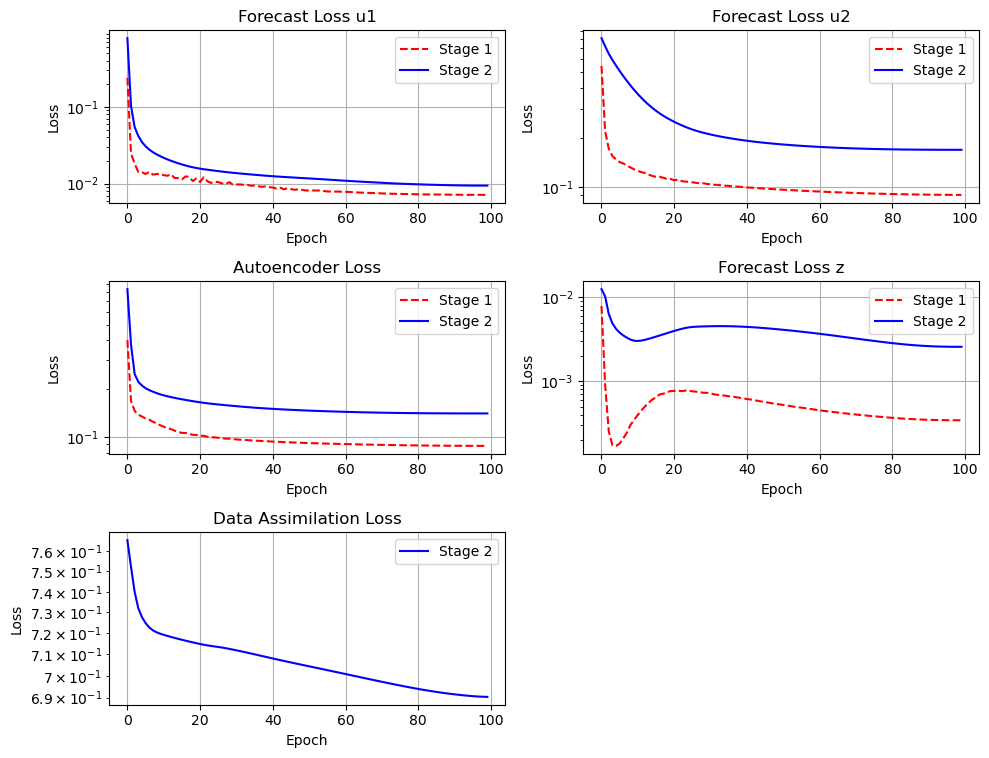

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
# batch_size = 1000
# num_samples = 8000  
# iters_per_epoch = math.ceil(num_samples / batch_size)
iters_per_epoch = 1000

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_continuousxy_CGKN_dimz256_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=16*16, loss_total = loss_da (DA loss only)

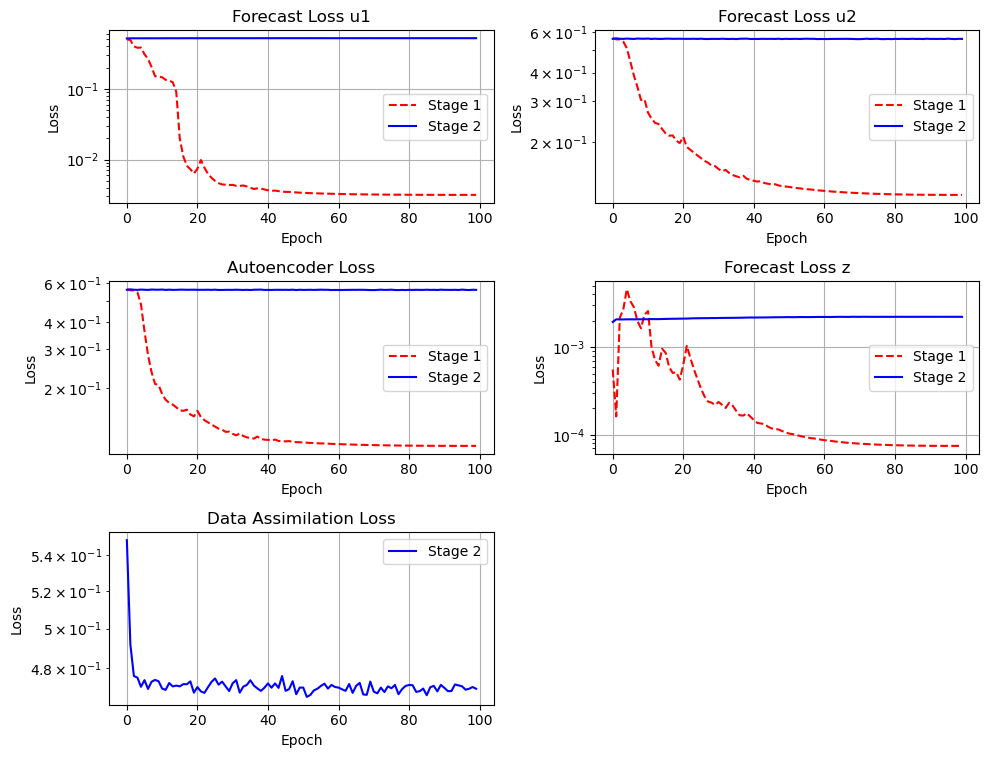

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 100
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])

# File paths
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_dalossonly_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_dalossonly_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_dalossonly_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_dalossonly_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz256_dalossonly_train_loss_da_history_stage2.npy",
}

# Load raw data
raw_losses = {k: np.load(v) for k, v in files.items()}

# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)

# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
# Hide last unused subplot if needed
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()


###### dimz=32*32, learning_rate=5e-5

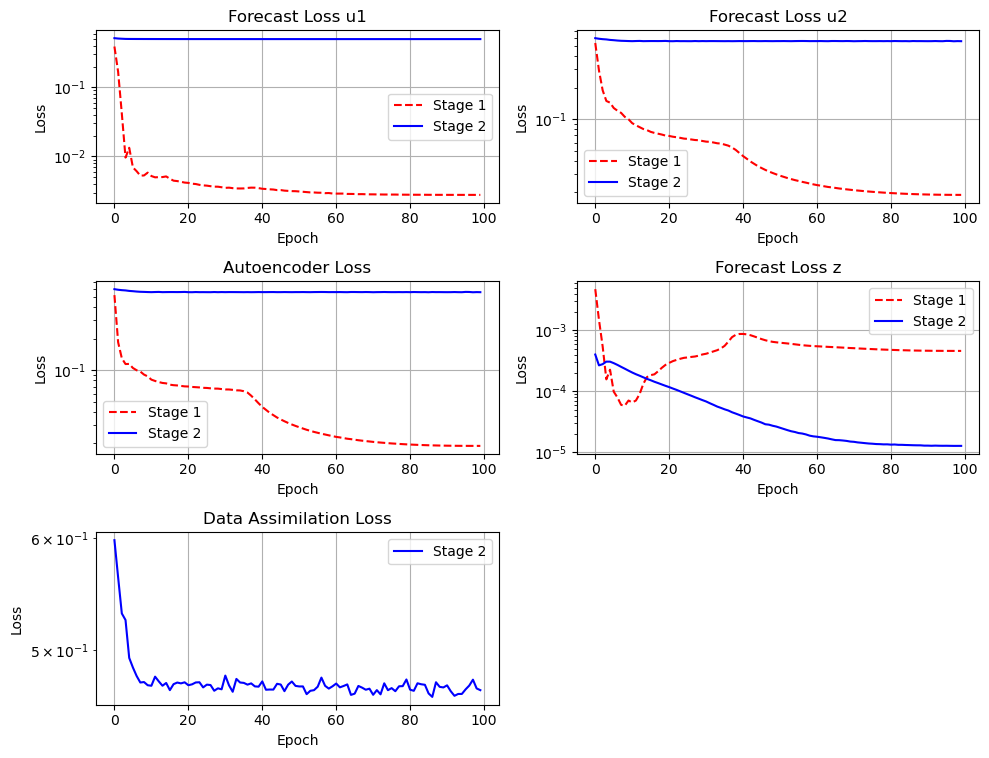

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 100
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])
    
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_da_history_stage2.npy",
}

raw_losses = {k: np.load(v) for k, v in files.items()}
# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)
# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# Save figure
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()

###### weighted loss: loss_total = 4*loss_forecast_u1 + 4*loss_forecast_u2 + 4*loss_ae + loss_forecast_z + loss_da

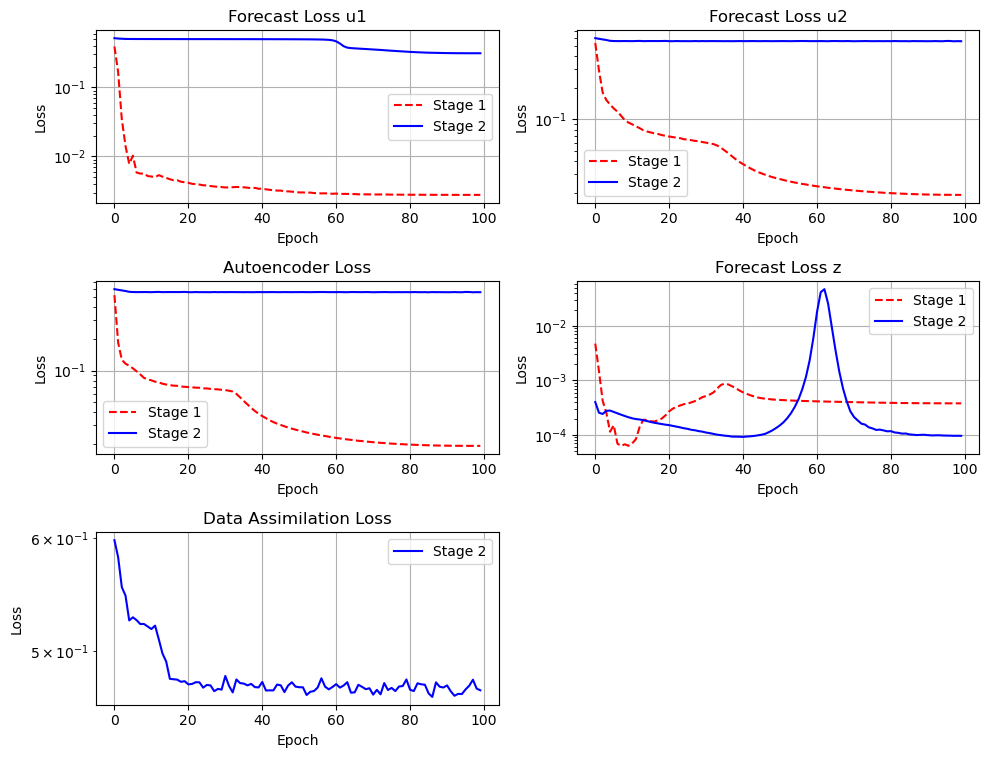

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 100
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])
    
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_da_history_stage2.npy",
}

raw_losses = {k: np.load(v) for k, v in files.items()}
# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)
# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# Save figure
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()

###### weighted loss: loss_total = 10*loss_forecast_u1 + 10*loss_forecast_u2 + 10*loss_ae + loss_forecast_z + loss_da

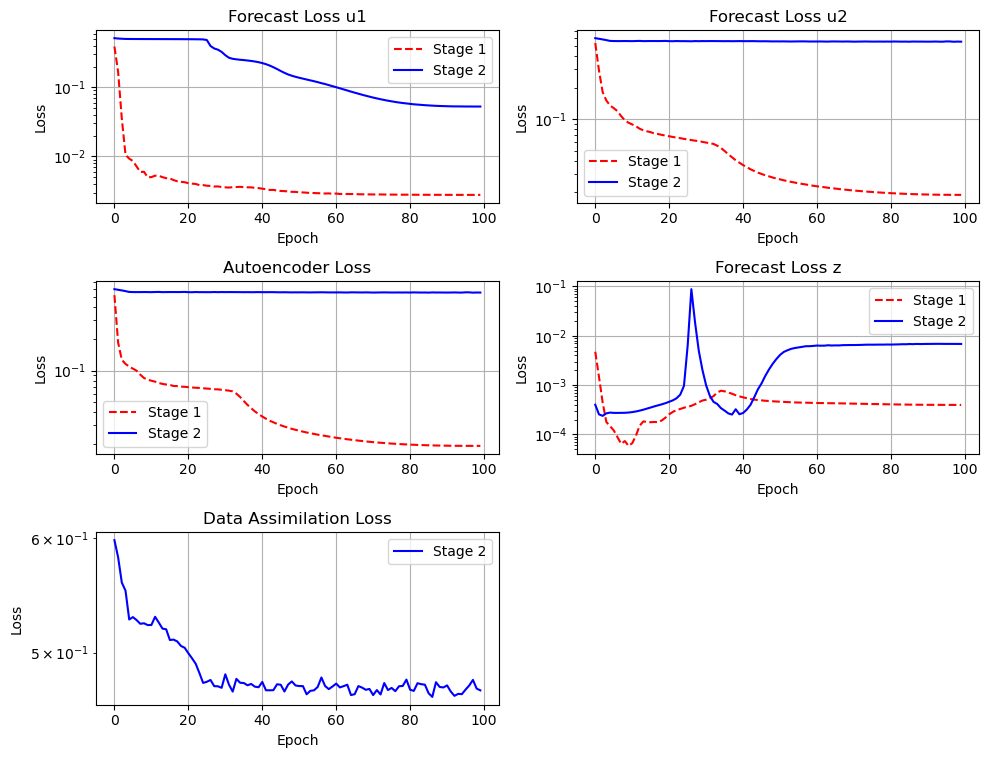

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters
batch_size = 100
num_samples = 8000  
iters_per_epoch = math.ceil(num_samples / batch_size)

# Helper functions
def smooth(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def average_per_epoch(data, iters_per_epoch):
    n_epochs = len(data) // iters_per_epoch
    return np.array([
        np.mean(data[i * iters_per_epoch:(i + 1) * iters_per_epoch])
        for i in range(n_epochs)
    ])
    
files = {
    "u1_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u1_history_stage1.npy",
    "u2_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_u2_history_stage1.npy",
    "ae_stage1": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_ae_history_stage1.npy",
    "z_stage1":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_train_loss_forecast_z_history_stage1.npy",
    "u1_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_forecast_u1_history_stage2.npy",
    "u2_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_forecast_u2_history_stage2.npy",
    "ae_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_ae_history_stage2.npy",
    "z_stage2":  r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_forecast_z_history_stage2.npy",
    "da_stage2": r"../model/QG(Noisy)_sigmaxy01_CGKN_dimz1024_weightloss_train_loss_da_history_stage2.npy",
}

raw_losses = {k: np.load(v) for k, v in files.items()}
# Convert Stage 2 losses from per-iteration to per-epoch
stage2_keys = [k for k in raw_losses if 'stage2' in k]
for key in stage2_keys:
    raw_losses[key] = average_per_epoch(raw_losses[key], iters_per_epoch)
# Smooth all losses
window = 10
# smoothed_losses = {k: smooth(v, window) for k, v in raw_losses.items()}
smoothed_losses = raw_losses

fig, axs = plt.subplots(3, 2, figsize=(10, 8))
axs = axs.flatten()
plot_info = [
    ("u1_stage1", "u1_stage2", "Forecast Loss u1"),
    ("u2_stage1", "u2_stage2", "Forecast Loss u2"),
    ("ae_stage1", "ae_stage2", "Autoencoder Loss"),
    ("z_stage1",  "z_stage2",  "Forecast Loss z"),
    (None,        "da_stage2", "Data Assimilation Loss"),
]
for i, (stage1_key, stage2_key, title) in enumerate(plot_info):
    ax = axs[i]
    if stage1_key:
        ax.plot(smoothed_losses[stage1_key], label="Stage 1", linestyle='--', color='r')
    if stage2_key:
        ax.plot(smoothed_losses[stage2_key], label="Stage 2", linestyle='-', color='b')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()
if len(axs) > len(plot_info):
    axs[-1].axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.96])
# Save figure
# plt.savefig("training_losses_epochwise_comparison.png", dpi=300)
plt.show()

## DA

### Default topo

In [333]:
from os.path import dirname, join as pjoin
# --------------------- load data --------------------------
train_size = 40000
val_size = 5000
test_size = 5000
data_dir = '../data/'
datafname = pjoin(data_dir, 'qg_data_sigmaxy01_t2000.npz')
data = np.load(datafname)
psi_truth_full = data['psi_truth']
xy_truth_full = data['xy_truth']
sigma_xy = data['sigma_xy'].item()
xy_obs_full = data['xy_obs']
sigma_obs = data['sigma_obs'].item()
dt_ob = data['dt_ob'].item()

# split training and test data set (training means tuning inflation and localzaiton)
data_size = test_size
psi_truth = psi_truth_full[train_size+val_size:train_size+val_size+test_size]
xy_truth = xy_truth_full[train_size+val_size:train_size+val_size+test_size]
xy_obs = xy_obs_full[train_size+val_size:train_size+val_size+test_size]

data = np.load('../data/qg_enkf_sigmaxy01_t2000.npz')
zeakf_analy = data['mean_analy']
zeakf_prior = data['mean_prior']
prior_mse_flow1 = data['mse_prior_flow1']
analy_mse_flow1 = data['mse_analy_flow1']
prior_mse_flow2 = data['mse_prior_flow2']
analy_mse_flow2 = data['mse_analy_flow2']
prior_mse_tracer = data['mse_prior_tracer']
analy_mse_tracer = data['mse_analy_tracer']

psi_cgkn_da = np.load('../data/CGKN_psi_DA.npy')
psi_cgkn_pred = np.load('../data/CGKN_psi_OneStepPrediction.npy')
xy_unit_cgkn_pred = np.load('../data/CGKN_xy_unit_OneStepPrediction.npy')

# psi_cgkn_pred_stage1 = np.load('../data/CGKN_psi_OneStepPrediction_stage1.npy')
# xy_unit_cgkn_pred_stage1 = np.load('../data/CGKN_xy_unit_OneStepPrediction_stage1.npy')

Nx = 64 # Number of grid points in each direction
dt = 2e-3 # Time step size
L = 128 # number of tracers

###### Stage 1

In [334]:
xy_cgkn_pred_stage1 = unit2xy(xy_unit_cgkn_pred_stage1)

NameError: name 'xy_unit_cgkn_pred_stage1' is not defined

In [7]:
nobs = 2*L
iobsbeg = 50
# len_mem = 2

print('CGKN Prediction (stage 1):')
print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_cgkn_pred_stage1[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_cgkn_pred_stage1[:-1,:,:,0])[iobsbeg:] ** 2))
print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_cgkn_pred_stage1[:-1,:,:,1])[iobsbeg:] ** 2))
print('pred mse total layers:', np.mean((psi_truth[1:] - psi_cgkn_pred_stage1[:-1])[iobsbeg:] ** 2))

CGKN Prediction (stage 1):
pred mse tracer: 0.01193538882627917
pred mse upper layer: 0.018131549562430103
pred mse lower layer: 0.0077793971307277155
pred mse total layers: 0.012955473346578924


In [32]:
nobs = 2*L
iobsbeg = 50
# len_mem = 2

print('CGKN Prediction (stage 1):')
print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_cgkn_pred_stage1[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_cgkn_pred_stage1[:-1,:,:,0])[iobsbeg:] ** 2))
print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_cgkn_pred_stage1[:-1,:,:,1])[iobsbeg:] ** 2))
print('pred mse total layers:', np.mean((psi_truth[1:] - psi_cgkn_pred_stage1[:-1])[iobsbeg:] ** 2))

# print('CGKN-phy Prediction (stage 1):')
# print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_cgkn_phy_pred_stage1[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
# print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_cgkn_phy_pred_stage1[:-1,:,:,0])[iobsbeg:] ** 2))
# print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_cgkn_phy_pred_stage1[:-1,:,:,1])[iobsbeg:] ** 2))
# print('pred mse total layers:', np.mean((psi_truth[1:] - psi_cgkn_phy_pred_stage1[:-1])[iobsbeg:] ** 2))

CGKN-phy Prediction (stage 1):
pred mse tracer: 0.01251494805967531
pred mse upper layer: 0.017655311617649064
pred mse lower layer: 0.010864309621945102
pred mse total layers: 0.014259810619797074


###### EnKF

In [336]:
psi_enkf = np.reshape(zeakf_analy[:, 2*L:], (test_size, Nx, Nx, 2))

In [337]:
psi1_prior = np.reshape(zeakf_prior[:, 2*L::2], (test_size, Nx, Nx))
psi1_analy = np.reshape(zeakf_analy[:, 2*L::2], (test_size, Nx, Nx))
psi2_prior = np.reshape(zeakf_prior[:, 2*L+1::2], (test_size, Nx, Nx))
psi2_analy = np.reshape(zeakf_analy[:, 2*L+1::2], (test_size, Nx, Nx))

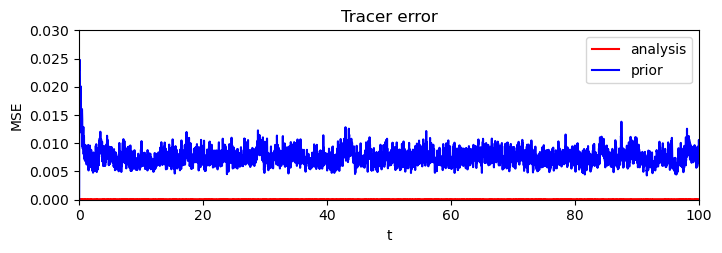

In [338]:
s_rate = 10
interv = 1
data_size = 5000
xaxis = np.arange(0, data_size*(s_rate)*dt, interv*s_rate*dt)
plt.figure(figsize=(8,2.2))
plt.plot(xaxis, analy_mse_tracer[:,0,0], 'r', label='analysis')
# plt.plot(xy_spread, 'r--')
plt.plot(xaxis, prior_mse_tracer[:,0,0], 'b', label='prior')
plt.xlim(0,data_size*(s_rate)*dt)
plt.ylim(0,0.03)
plt.xlabel('t')
plt.ylabel('MSE')
plt.title('Tracer error')
plt.legend()
# plt.savefig('../figure/enkf_sigmaxy01_tracer_mse.png')
plt.show()

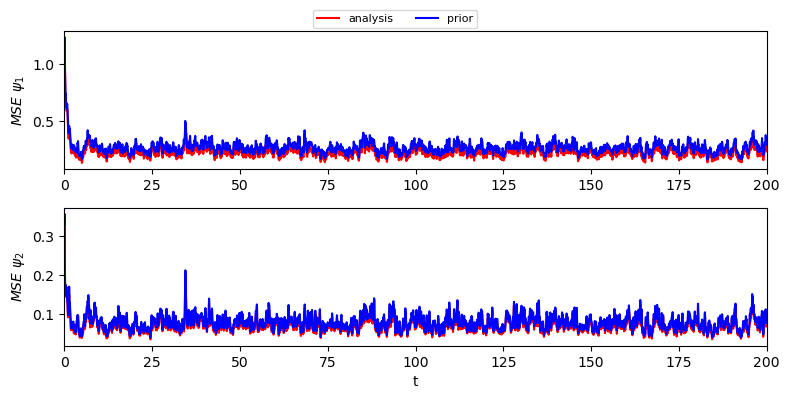

In [339]:
# Plot
data1 = [analy_mse_flow1[:,0,0], prior_mse_flow1[:,0,0]]
data2 = [analy_mse_flow2[:,0,0], prior_mse_flow2[:,0,0]]
interv = 1
s_rate = 1
sel0 = 0; sel1 = 5000 # plot time range
xlim = (0,200)
labels = ['analysis', 'prior']
colors = ['r', 'b']
plot_mses(dt_ob, sel0, sel1, s_rate, interv, xlim, data1, data2, labels, colors)
# plt.savefig('../figure/enkf_psi_mse.png')
plt.show()

CGKN

In [340]:
xy_cgkn = unit2xy(xy_unit_cgkn_pred)

In [341]:
np.mean((np.mod(xy_truth[1:] - xy_cgkn[:-1] + np.pi, 2*np.pi) - np.pi) ** 2)

0.015096967998124775

In [342]:
np.mean((np.mod(xy_truth[1:] - xy_truth[:-1] + np.pi, 2*np.pi) - np.pi) ** 2)

0.018458370151569693

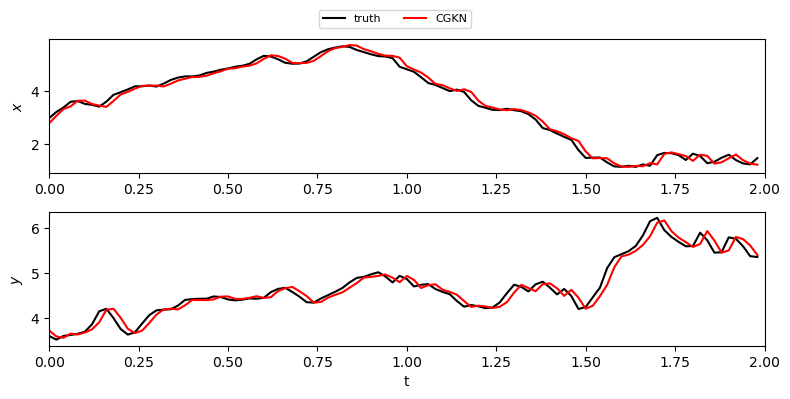

In [344]:
s_rate = 10
interv = 1
l = 0
data_size = 100
xaxis = np.arange(0, data_size*(s_rate)*dt, interv*s_rate*dt)
data1 = [xy_truth[1:, l, 0], xy_cgkn[:-1, l, 0]]
data2 = [xy_truth[1:, l, 1], xy_cgkn[:-1, l, 1]]
sel0 = 0; sel1 = 100 # plot time range
xlim = (0,2)
labels = ['truth', 'CGKN']
colors = ['k','r']

fig = plt.figure(figsize=(8, 4))
widths = [7]
heights = [1, 1]
spec = fig.add_gridspec(ncols=1, nrows=2, width_ratios=widths, height_ratios=heights)
plt.subplots_adjust(wspace=0.35, hspace=0.5)
ax1 = fig.add_subplot(spec[0, 0])
ax2 = fig.add_subplot(spec[1, 0])
lines = []
for i, data in enumerate(data1):
    line, = ax1.plot(xaxis, data[sel0:sel1:interv], colors[i], label=labels[i])
    lines.append(line)
ax1.set_xlim(sel0 * s_rate * dt, sel1 * s_rate * dt)
ax1.set_ylabel(r'$x$')
ax1.set_xlim(xlim)
for i, data in enumerate(data2):
    ax2.plot(xaxis, data[sel0:sel1:interv], colors[i], label=labels[i])
ax2.set_xlim(sel0 * s_rate * dt, sel1 * s_rate * dt)
ax2.set_ylabel(r'$y$')
ax2.set_xlabel('t')
ax2.set_xlim(xlim)
fig.legend(
    handles=lines,
    labels=labels,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.0),  # position below the plot
    ncol=len(labels),
    fontsize=8
)
plt.tight_layout(rect=[0, 0.0, 1, 0.95])  
plt.savefig('../figure/cgkn_tracer_pred.png')
plt.show()

Comparison

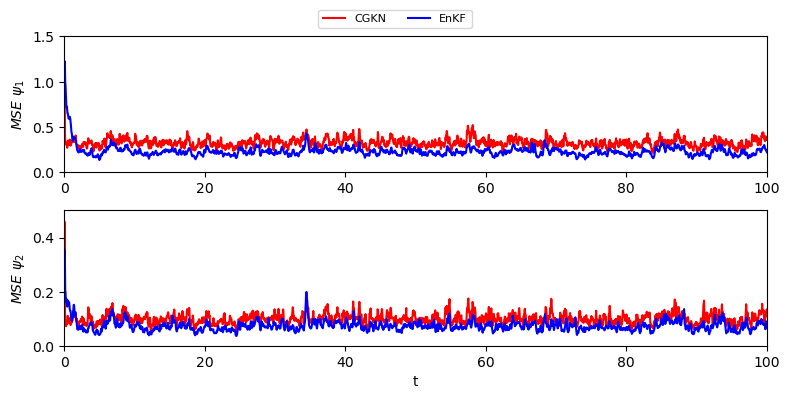

In [345]:
from plot import plot_mses
psi1_mse_enkf = np.mean((psi_truth[:,:,:,0] - psi1_analy) ** 2, axis=(1,2))
psi2_mse_enkf = np.mean((psi_truth[:,:,:,1] - psi2_analy) ** 2, axis=(1,2))
psi1_mse_cgkn = np.mean((psi_truth[:,:,:,0] - psi_cgkn_da[:,:,:,0]) ** 2, axis=(1,2))
psi2_mse_cgkn = np.mean((psi_truth[:,:,:,1] - psi_cgkn_da[:,:,:,1]) ** 2, axis=(1,2))
data1 = [psi1_mse_cgkn, psi1_mse_enkf]
data2 = [psi2_mse_cgkn, psi2_mse_enkf]
interv = 1
s_rate = 1
sel0 = 0; sel1 = 5000 # plot time range
xlim = (0,100)
ylims = [(0.,1.5), (0., .5)]
labels = ['CGKN', 'EnKF']
colors = ['r', 'b']
plot_mses(dt_ob, sel0, sel1, s_rate, interv, xlim, data1, data2, labels, colors, ylims)
plt.savefig('../figure/psi_mse.png')
plt.show()

In [22]:
import matplotlib.pyplot as plt
from plot import plot_contour_fields
nt = -1
colorlim=(5., 5.)

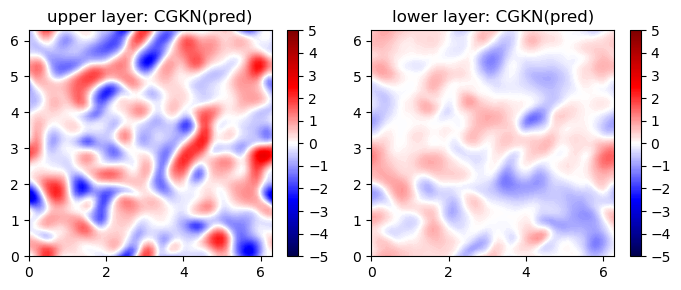

In [28]:
plot_contour_fields(psi_cgkn_pred[nt-1, :, :, 0], psi_cgkn_pred[nt-1, :, :, 1], 'CGKN(pred)', colorlim, levels=201)
plt.savefig('../figure/CGKN_psi_pred.png')
plt.show()

In [347]:
nts=np.array([3900, 3925, 3950, 3975, 4000])
psi_list = np.stack([psi_truth[nts], psi_cgkn_da[nts], psi_enkf[nts]], axis=0)

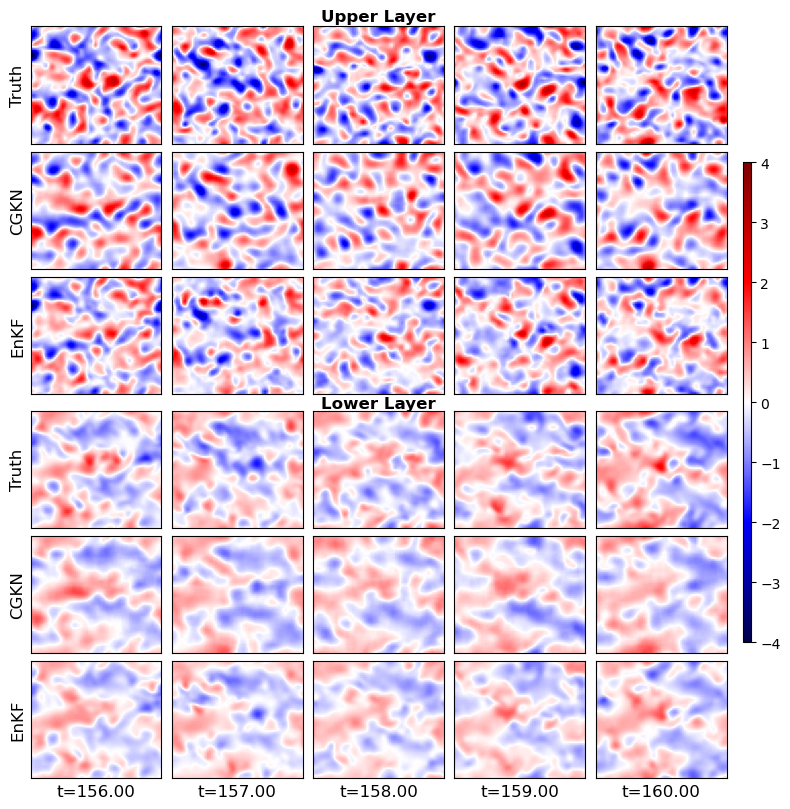

In [352]:
plot_flow_comparison(psi_list[..., 0], psi_list[..., 1], method_names=['Truth', 'CGKN', 'EnKF'], time_indices=(nts*dt_obs).tolist(), colorlim=(-4,4))
plt.savefig('../figure/flow_comparison_default.png')
plt.show()

In [351]:
nobs = 2*L
iobsbeg = 50
len_mem = 2

print('EnKF:')
# print('prior mse tracer:', np.mean(prior_mse_tracer[iobsbeg:]))
print('analy mse tracer:', np.mean(analy_mse_tracer[iobsbeg:]))
print('analy mse upper layer:', np.mean((psi_truth[:,:,:,0] - psi1_analy)[iobsbeg:] ** 2))
print('analy mse lower layer:', np.mean((psi_truth[:,:,:,1] - psi2_analy)[iobsbeg:] ** 2))
print('analy mse total layers:', np.mean(((psi_truth[:,:,:,0] - psi1_analy)[iobsbeg:] ** 2 + (psi_truth[:,:,:,1] - psi2_analy)[iobsbeg:] ** 2))/2)

print('CGKN DA:')
print('analy mse upper layer:', np.mean((psi_truth[:,:,:,0] - psi_cgkn_da[:,:,:,0])[iobsbeg:] ** 2))
print('analy mse lower layer:', np.mean((psi_truth[:,:,:,1] - psi_cgkn_da[:,:,:,1])[iobsbeg:] ** 2))
print('analy mse total layers:', np.mean((psi_truth - psi_cgkn_da)[iobsbeg:] ** 2))

print('CGKN Prediction:')
print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_cgkn[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_cgkn_pred[:-1,:,:,0])[iobsbeg:] ** 2))
print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_cgkn_pred[:-1,:,:,1])[iobsbeg:] ** 2))
print('pred mse total layers:', np.mean((psi_truth[1:] - psi_cgkn_pred[:-1])[iobsbeg:] ** 2))

psi_mean = np.mean(psi_truth, axis=0)
print('climatology')
print('mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_mean[...,0])[iobsbeg:] ** 2))
print('mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_mean[...,1])[iobsbeg:] ** 2))
print('mse total layers:', np.mean((psi_truth[1:] - psi_mean)[iobsbeg:] ** 2))

print('Naive persistence Prediction:')
print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_truth[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_truth[:-1,:,:,0])[iobsbeg:] ** 2))
print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_truth[:-1,:,:,1])[iobsbeg:] ** 2))
print('pred mse total layers:', np.mean((psi_truth[1:] - psi_truth[:-1])[iobsbeg:] ** 2))


EnKF:
analy mse tracer: 9.868093722953114e-05
analy mse upper layer: 0.22065322696970233
analy mse lower layer: 0.07202751024709984
analy mse total layers: 0.14634036860840113
CGKN DA:
analy mse upper layer: 0.32348601330867927
analy mse lower layer: 0.09961210941579358
analy mse total layers: 0.21154906136223642
CGKN Prediction:
pred mse tracer: 0.015095011624092963
pred mse upper layer: 0.031150335226694966
pred mse lower layer: 0.013459061007089193
pred mse total layers: 0.02230469811689203
climatology
mse upper layer: 0.7576123003726918
mse lower layer: 0.17065439659603332
mse total layers: 0.46413334848436455
Naive persistence Prediction:
pred mse tracer: 0.018456200993114603
pred mse upper layer: 0.08642626589367539
pred mse lower layer: 0.03157342749868074
pred mse total layers: 0.05899984669617812


### Topo1

In [19]:
from os.path import dirname, join as pjoin
# --------------------- load data --------------------------
train_size = 5000
val_size = 0
test_size = 5000
data_dir = '../data/'
datafname = pjoin(data_dir, 'qg_data_topo1.npz')
data = np.load(datafname)
psi_truth_full = data['psi_truth']
xy_truth_full = data['xy_truth']
sigma_xy = data['sigma_xy'].item()
xy_obs_full = data['xy_obs']
sigma_obs = data['sigma_obs'].item()
dt_obs = data['dt_obs'].item()

# split training and test data set (training means tuning inflation and localzaiton)
data_size = test_size
psi_truth = psi_truth_full[train_size+val_size:train_size+val_size+test_size]
xy_truth = xy_truth_full[train_size+val_size:train_size+val_size+test_size]
xy_obs = xy_obs_full[train_size+val_size:train_size+val_size+test_size]

data = np.load('../data/qg_enkf_topo1.npz')
zeakf_analy = data['mean_analy']
zeakf_prior = data['mean_prior']
prior_mse_flow1 = data['mse_prior_flow1']
analy_mse_flow1 = data['mse_analy_flow1']
prior_mse_flow2 = data['mse_prior_flow2']
analy_mse_flow2 = data['mse_analy_flow2']
prior_mse_tracer = data['mse_prior_tracer']
analy_mse_tracer = data['mse_analy_tracer']
psi_enkf = np.reshape(zeakf_analy[:,2*L:], (test_size, Nx, Nx, 2))

psi_cgkn_da = np.load('../data/CGKN_topo1_retrain_psi_DA.npy')
psi_cgkn_pred = np.load('../data/CGKN_topo1_retrain_psi_OneStepPrediction.npy')
xy_unit_cgkn_pred = np.load('../data/CGKN_topo1_retrain_xy_unit_OneStepPrediction.npy')

# psi_cgkn_pred_stage1 = np.load('../data/CGKN_psi_OneStepPrediction_stage1.npy')
# xy_unit_cgkn_pred_stage1 = np.load('../data/CGKN_xy_unit_OneStepPrediction_stage1.npy')

Nx = 64 # Number of grid points in each direction
dt = 2e-3 # Time step size
L = 128 # number of tracers

###### EnKF

In [20]:
analy_mse_tracer.shape

(5000, 1, 1)

In [21]:
psi1_prior = np.reshape(zeakf_prior[:, 2*L::2], (test_size, Nx, Nx))
psi1_analy = np.reshape(zeakf_analy[:, 2*L::2], (test_size, Nx, Nx))
psi2_prior = np.reshape(zeakf_prior[:, 2*L+1::2], (test_size, Nx, Nx))
psi2_analy = np.reshape(zeakf_analy[:, 2*L+1::2], (test_size, Nx, Nx))

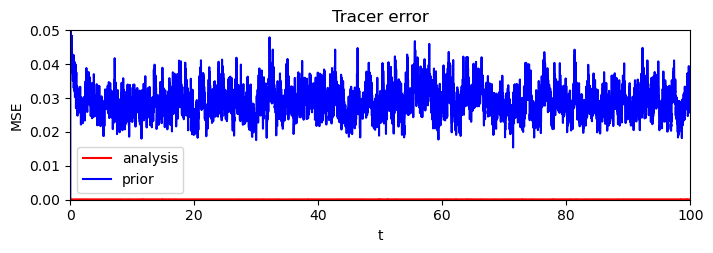

In [23]:
s_rate = 10
interv = 1
data_size = 5000
xaxis = np.arange(0, data_size*(s_rate)*dt, interv*s_rate*dt)
plt.figure(figsize=(8,2.2))
plt.plot(xaxis, analy_mse_tracer[:,0,0], 'r', label='analysis')
# plt.plot(xy_spread, 'r--')
plt.plot(xaxis, prior_mse_tracer[:,0,0], 'b', label='prior')
plt.xlim(0,data_size*(s_rate)*dt)
plt.ylim(0,0.05)
plt.xlabel('t')
plt.ylabel('MSE')
plt.title('Tracer error')
plt.legend()
# plt.savefig('../figure/enkf_sigmaxy01_tracer_mse.png')
plt.show()

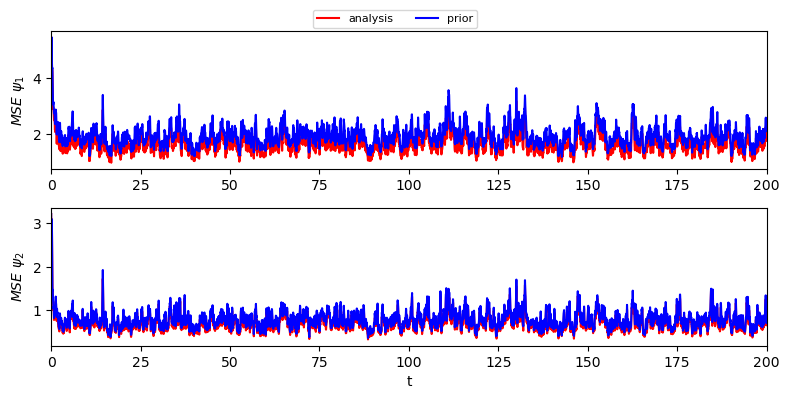

In [25]:
from plot import plot_mses
# Plot
data1 = [analy_mse_flow1[:,0,0], prior_mse_flow1[:,0,0]]
data2 = [analy_mse_flow2[:,0,0], prior_mse_flow2[:,0,0]]
interv = 1
s_rate = 1
sel0 = 0; sel1 = 5000 # plot time range
xlim = (0,200)
labels = ['analysis', 'prior']
colors = ['r', 'b']
plot_mses(dt_ob, sel0, sel1, s_rate, interv, xlim, data1, data2, labels, colors)
# plt.savefig('../figure/enkf_psi_mse.png')
plt.show()

CGKN

In [26]:
xy_cgkn = unit2xy(xy_unit_cgkn_pred)

In [27]:
np.mean((np.mod(xy_truth[1:] - xy_cgkn[:-1] + np.pi, 2*np.pi) - np.pi) ** 2)

0.04068108515016053

In [28]:
np.mean((np.mod(xy_truth[1:] - xy_truth[:-1] + np.pi, 2*np.pi) - np.pi) ** 2)

0.04744810362259827

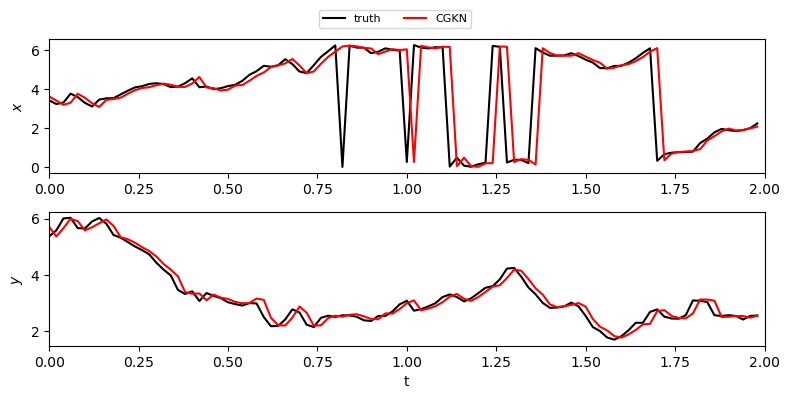

In [31]:
s_rate = 10
interv = 1
l = 0
data_size = 100
xaxis = np.arange(0, data_size*(s_rate)*dt, interv*s_rate*dt)
data1 = [xy_truth[1:, l, 0], xy_cgkn[:-1, l, 0]]
data2 = [xy_truth[1:, l, 1], xy_cgkn[:-1, l, 1]]
sel0 = 0; sel1 = 100 # plot time range
xlim = (0,2)
labels = ['truth', 'CGKN']
colors = ['k','r']

fig = plt.figure(figsize=(8, 4))
widths = [7]
heights = [1, 1]
spec = fig.add_gridspec(ncols=1, nrows=2, width_ratios=widths, height_ratios=heights)
plt.subplots_adjust(wspace=0.35, hspace=0.5)
ax1 = fig.add_subplot(spec[0, 0])
ax2 = fig.add_subplot(spec[1, 0])
lines = []
for i, data in enumerate(data1):
    line, = ax1.plot(xaxis, data[sel0:sel1:interv], colors[i], label=labels[i])
    lines.append(line)
ax1.set_xlim(sel0 * s_rate * dt, sel1 * s_rate * dt)
ax1.set_ylabel(r'$x$')
ax1.set_xlim(xlim)
for i, data in enumerate(data2):
    ax2.plot(xaxis, data[sel0:sel1:interv], colors[i], label=labels[i])
ax2.set_xlim(sel0 * s_rate * dt, sel1 * s_rate * dt)
ax2.set_ylabel(r'$y$')
ax2.set_xlabel('t')
ax2.set_xlim(xlim)
fig.legend(
    handles=lines,
    labels=labels,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.0),  # position below the plot
    ncol=len(labels),
    fontsize=8
)
plt.tight_layout(rect=[0, 0.0, 1, 0.95])  
plt.savefig('../figure/cgkn_topo1_tracer_pred.png')
plt.show()

Comparison

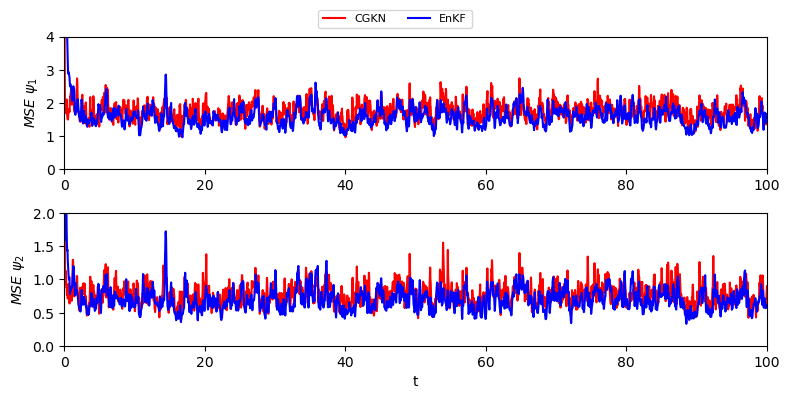

In [39]:
from plot import plot_mses
psi1_mse_enkf = np.mean((psi_truth[:,:,:,0] - psi1_analy) ** 2, axis=(1,2))
psi2_mse_enkf = np.mean((psi_truth[:,:,:,1] - psi2_analy) ** 2, axis=(1,2))
psi1_mse_cgkn = np.mean((psi_truth[:,:,:,0] - psi_cgkn_da[:,:,:,0]) ** 2, axis=(1,2))
psi2_mse_cgkn = np.mean((psi_truth[:,:,:,1] - psi_cgkn_da[:,:,:,1]) ** 2, axis=(1,2))
data1 = [psi1_mse_cgkn, psi1_mse_enkf]
data2 = [psi2_mse_cgkn, psi2_mse_enkf]
interv = 1
s_rate = 1
sel0 = 0; sel1 = 5000 # plot time range
xlim = (0,100)
ylims = [(0.,4), (0., 2)]
labels = ['CGKN', 'EnKF']
colors = ['r', 'b']
plot_mses(dt_ob, sel0, sel1, s_rate, interv, xlim, data1, data2, labels, colors, ylims)
plt.savefig('../figure/psi_mse_topo1.png')
plt.show()

In [311]:
nts=np.array([3900, 3925, 3950, 3975, 4000])
# nts=np.array([3800, 3850, 3900, 3950, 4000])
psi_list = np.stack([psi_truth[nts], psi_cgkn_da[nts], psi_enkf[nts]], axis=0)

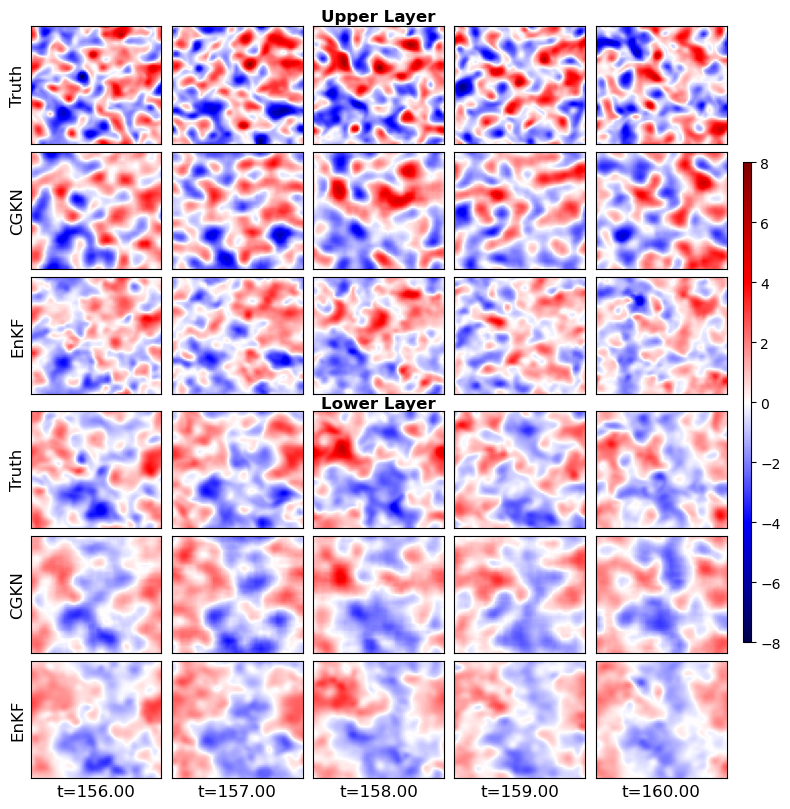

In [312]:
plot_flow_comparison(psi_list[..., 0], psi_list[..., 1], method_names=['Truth', 'CGKN', 'EnKF'], time_indices=(nts*dt_obs).tolist(), colorlim=(-8,8))
plt.savefig('../figure/flow_comparison_topo1.png')
plt.show()

In [45]:
nobs = 2*L
iobsbeg = 50
len_mem = 2

print('EnKF:')
# print('prior mse tracer:', np.mean(prior_mse_tracer[iobsbeg:]))
print('analy mse tracer:', np.mean(analy_mse_tracer[iobsbeg:]))
print('analy mse upper layer:', np.mean((psi_truth[:,:,:,0] - psi1_analy)[iobsbeg:] ** 2))
print('analy mse lower layer:', np.mean((psi_truth[:,:,:,1] - psi2_analy)[iobsbeg:] ** 2))
print('analy mse total layers:', np.mean(((psi_truth[:,:,:,0] - psi1_analy)[iobsbeg:] ** 2 + (psi_truth[:,:,:,1] - psi2_analy)[iobsbeg:] ** 2))/2)

print('CGKN DA:')
print('analy mse upper layer:', np.mean((psi_truth[:,:,:,0] - psi_cgkn_da[:,:,:,0])[iobsbeg:] ** 2))
print('analy mse lower layer:', np.mean((psi_truth[:,:,:,1] - psi_cgkn_da[:,:,:,1])[iobsbeg:] ** 2))
print('analy mse total layers:', np.mean((psi_truth - psi_cgkn_da)[iobsbeg:] ** 2))

print('CGKN Prediction:')
print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_cgkn[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_cgkn_pred[:-1,:,:,0])[iobsbeg:] ** 2))
print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_cgkn_pred[:-1,:,:,1])[iobsbeg:] ** 2))
print('pred mse total layers:', np.mean((psi_truth[1:] - psi_cgkn_pred[:-1])[iobsbeg:] ** 2))

psi_mean = np.mean(psi_truth, axis=0)
print('climatology')
print('mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_mean[...,0])[iobsbeg:] ** 2))
print('mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_mean[...,1])[iobsbeg:] ** 2))
print('mse total layers:', np.mean((psi_truth[1:] - psi_mean)[iobsbeg:] ** 2))

print('Naive persistence Prediction:')
print('pred mse tracer:', np.mean((np.mod(xy_truth[1:] - xy_truth[:-1] + np.pi, 2*np.pi) - np.pi)[iobsbeg:] ** 2))
print('pred mse upper layer:', np.mean((psi_truth[1:,:,:,0] - psi_truth[:-1,:,:,0])[iobsbeg:] ** 2))
print('pred mse lower layer:', np.mean((psi_truth[1:,:,:,1] - psi_truth[:-1,:,:,1])[iobsbeg:] ** 2))
print('pred mse total layers:', np.mean((psi_truth[1:] - psi_truth[:-1])[iobsbeg:] ** 2))


EnKF:
analy mse tracer: 0.00010077029860951881
analy mse upper layer: 1.6030801217242376
analy mse lower layer: 0.7101678810398104
analy mse total layers: 1.1566240013820284
CGKN DA:
analy mse upper layer: 1.7489634352126016
analy mse lower layer: 0.7869762399851672
analy mse total layers: 1.2679698375988817
CGKN Prediction:
pred mse tracer: 0.040649778134562956
pred mse upper layer: 0.19042807613474405
pred mse lower layer: 0.14073748438728542
pred mse total layers: 0.16558278026101458
climatology
mse upper layer: 3.4734860125136384
mse lower layer: 1.2469555798207008
mse total layers: 2.360220796167165
Naive persistence Prediction:
pred mse tracer: 0.04740613016821782
pred mse upper layer: 0.823754670884293
pred mse lower layer: 0.33472842172155615
pred mse total layers: 0.5792415463029237


## Parameter estimation

### Default topo

In [360]:
data = np.load('../data/qg_data_sigmaxy01_t2000.npz')
K = data['K'].item()
kd = data['kd'].item()
kb = data['kb'].item()
U = data['U'].item()
kappa = data['r'].item()
H = data['H'].item()
nu = data['nu'].item()
dt = data['dt'].item()
L = data['L'].item()
dt_ob = data['dt_ob'].item()
beta = kb**2
psi_truth_full = data['psi_truth']

# split training and test data set (training means tuning inflation and localzaiton)
train_size = 40000
val_size = 5000
test_size = 5000
psi_truth = psi_truth_full[train_size+val_size:train_size+val_size+test_size]
psi_cgkn_da = np.load('../data/CGKN_psi_DA.npy')

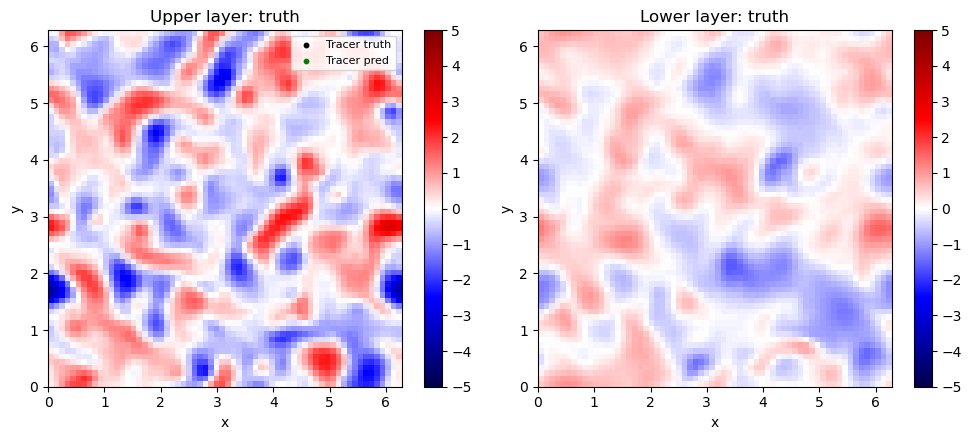

In [15]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(5., 5.)
plot_combined_fields_with_tracers(psi_noisy[nt, :, :, 0], psi_noisy[nt, :, :, 1], np.full((2,2), np.nan), np.full((2,2), np.nan), 'truth', colorlim)

In [361]:
K = 64

In [362]:
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)
dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography
hk = np.fft.fft2(topo)

In [19]:
# from param_est import params_est
psi1_k_t = np.fft.fft2(psi_truth[..., 0], axes=(1, 2)).transpose(1,2,0)
psi2_k_t = np.fft.fft2(psi_truth[..., 1], axes=(1, 2)).transpose(1,2,0)

In [29]:
hk_est = params_est(K, dt_ob, psi1_k_t[:,:,:100], psi2_k_t[:,:,:100], kd, beta, kappa, nu, U, r_cut=32, style='circle').squeeze()

begin compute A, B matrices...
successfully compute A, B matrices...
successfully seperate real and imaginary parts...
successfully regression...
Relative residual (est): 8.71e-01
finished. (time used: 1.08 hrs)


In [30]:
from conj_symm_tools import avg_conj_symm_
hk_est = avg_conj_symm_(hk_est)

In [31]:
h_est = np.fft.ifft2(hk_est)
h_truth = topo

/tmp/ipykernel_1501583/1084631341.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_est


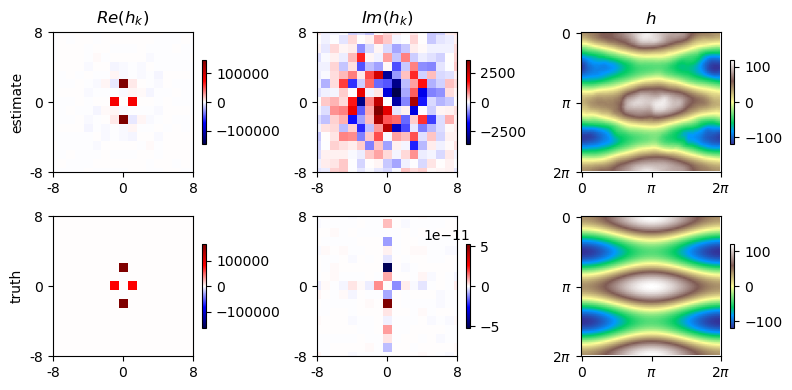

In [32]:
# Plot topography
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk_est.real
dataplot[:, :, 0, 1] = hk_est.imag
dataplot[:, :, 0, 2] = h_est
dataplot[:, :, 1, 0] = hk.real
dataplot[:, :, 1, 1] = hk.imag
dataplot[:, :, 1, 2] = h_truth
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
xticks = np.array([0, np.pi, 2*np.pi])
xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']
r_cut = 8

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        if j<2:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
            axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        else:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='terrain', vmin=-maxabs, vmax=maxabs)
            axs[i,j].set_xticks(np.linspace(0, K, len(xticks))) 
            axs[i,j].set_yticks(np.linspace(0, K, len(xticks)))
            axs[i,j].set_xticklabels(xticklabels)
            axs[i,j].set_yticklabels(xticklabels)
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/topo_est(truth).png')
plt.show()

In [33]:
np.save('../data/topo_est(truth).npy', h_est)

In [364]:
# from param_est import params_est
psi1_k_t = np.fft.fft2(psi_cgkn_da[..., 0], axes=(1, 2)).transpose(1,2,0)
psi2_k_t = np.fft.fft2(psi_cgkn_da[..., 1], axes=(1, 2)).transpose(1,2,0)

In [22]:
hk_est = params_est(K, dt_ob, psi1_k_t[:,:,:100], psi2_k_t[:,:,:100], kd, beta, kappa, nu, U, r_cut=32, style='circle').squeeze()

begin compute A, B matrices...
successfully compute A, B matrices...
successfully seperate real and imaginary parts...
successfully regression...
Relative residual (est): 9.32e-01
finished. (time used: 0.33 hrs)


In [23]:
from conj_symm_tools import avg_conj_symm_
hk_est = avg_conj_symm_(hk_est)

In [24]:
h_est = np.fft.ifft2(hk_est)
h_truth = topo

/tmp/ipykernel_2315965/3751240866.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_est


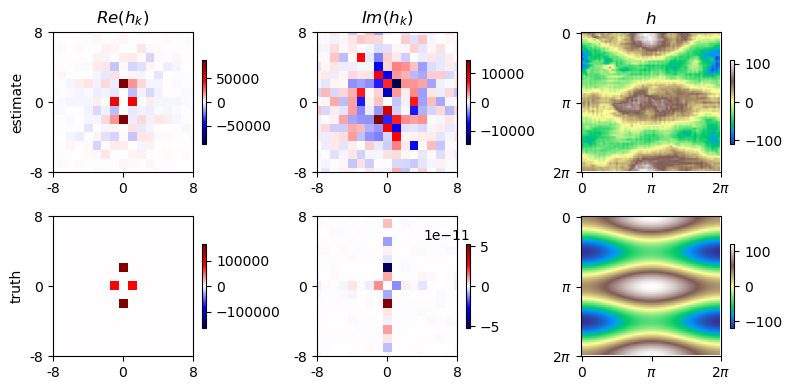

In [25]:
# Plot topography
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk_est.real
dataplot[:, :, 0, 1] = hk_est.imag
dataplot[:, :, 0, 2] = h_est
dataplot[:, :, 1, 0] = hk.real
dataplot[:, :, 1, 1] = hk.imag
dataplot[:, :, 1, 2] = h_truth
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
xticks = np.array([0, np.pi, 2*np.pi])
xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']
r_cut = 8

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        if j<2:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
            axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        else:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='terrain', vmin=-maxabs, vmax=maxabs)
            axs[i,j].set_xticks(np.linspace(0, K, len(xticks))) 
            axs[i,j].set_yticks(np.linspace(0, K, len(xticks)))
            axs[i,j].set_xticklabels(xticklabels)
            axs[i,j].set_yticklabels(xticklabels)
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/topo_est(cgkn).png')
plt.show()

In [26]:
np.save('../data/topo_est(cgkn).npy', h_est)

In [1]:
import numpy as np
data = np.load('../data/qg_data_sigmaxy01_t2000.npz')
H = data['H'].item()
dt_ob = data['dt_ob'].item()
K = 64
Kx = np.fft.fftfreq(K) * K
Ky = np.fft.fftfreq(K) * K
KX, KY = np.meshgrid(Kx, Ky)
dx = 2 * np.pi / K
X, Y = np.meshgrid(np.arange(0, 2*np.pi, dx), np.arange(0, 2*np.pi, dx))
topo = H * (np.cos(X) + 2 * np.cos(2 * Y))
topo -= np.mean(topo)  # subtracting the mean to center the topography

h_est_truth = np.load('../data/topo_est(truth).npy')
hk_est_truth = np.fft.fft2(h_est_truth)
h_est_cgkn = np.load('../data/topo_est(cgkn).npy')
hk_est_cgkn = np.fft.fft2(h_est_cgkn)
h_truth = topo
hk_truth = np.fft.fft2(topo)

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def plot_topography_grid(data_real, data_imag, data_h, method_labels=None, r_cut=8, cmap_freq='seismic', cmap_phys='terrain'):
    """
    Plot frequency-domain and physical topography data.

    Parameters:
    - data_real: list of 2D arrays for Re(h_k)
    - data_imag: list of 2D arrays for Im(h_k)
    - data_h: list of 2D arrays for h (physical space)
    - method_labels: list of row labels (optional)
    - r_cut: zoom-in range for frequency plots
    - cmap_freq: colormap for frequency-domain
    - cmap_phys: colormap for physical domain
    """
    num_methods = len(data_real)
    K = data_real[0].shape[0]
    
    nrow, ncol = num_methods, 3
    fig, axs = plt.subplots(nrow, ncol, figsize=(8, 8))

    dataplot = np.zeros((K, K, nrow, ncol))
    for i in range(nrow):
        dataplot[:, :, i, 0] = data_real[i]
        dataplot[:, :, i, 1] = data_imag[i]
        dataplot[:, :, i, 2] = data_h[i]

    # Shift zero freq to center
    dataplot = np.roll(dataplot, shift=K//2, axis=0)
    dataplot = np.roll(dataplot, shift=K//2, axis=1)
    Kx = np.fft.fftfreq(K) * K
    Kx_shift = np.roll(Kx, shift=K//2)
    xticks = np.array([0, np.pi, 2*np.pi])
    xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']

    for i in range(nrow):
        for j in range(ncol):
            maxabs = np.max(np.abs(dataplot[:, :, i, j]))
            if j < 2:
                im = axs[i, j].imshow(dataplot[:, :, i, j], cmap=cmap_freq, vmin=-maxabs, vmax=maxabs)
                n_tick = K // 8
                axs[i, j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False))
                axs[i, j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
                axs[i, j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
                axs[i, j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
                axs[i, j].set_xlim(K//2 - r_cut, K//2 + r_cut)
                axs[i, j].set_ylim(K//2 - r_cut, K//2 + r_cut)
            else:
                im = axs[i, j].imshow(dataplot[:, :, i, j], cmap=cmap_phys, vmin=-maxabs, vmax=maxabs)
                axs[i, j].set_xticks(np.linspace(0, K, len(xticks)))
                axs[i, j].set_yticks(np.linspace(0, K, len(xticks)))
                axs[i, j].set_xticklabels(xticklabels)
                axs[i, j].set_yticklabels(xticklabels)
            # fig.colorbar(im, ax=axs[i, j], shrink=0.6)
            cbar = fig.colorbar(im, ax=axs[i, j], shrink=0.65, pad=0.05)
            cbar.ax.tick_params(labelsize=9)

    axs[0, 0].set_title(r'$Re(\hat{h}_{k})$')
    axs[0, 1].set_title(r'$Im(\hat{h}_{k})$')
    axs[0, 2].set_title(r'$h$')
    if method_labels is not None:
        for i in range(nrow):
            axs[i, 0].set_ylabel(method_labels[i])
    fig.subplots_adjust(wspace=0.25, hspace=0.0001)

/tmp/ipykernel_1834521/1303329936.py:27: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, i, 2] = data_h[i]


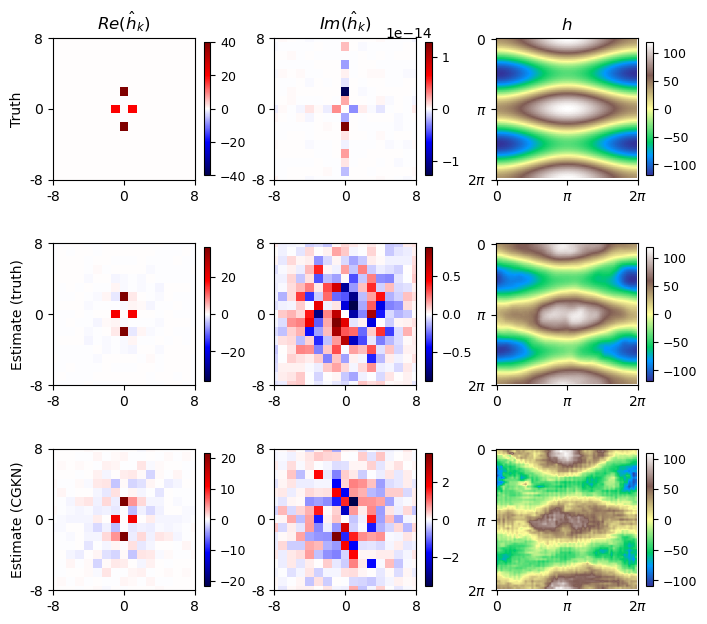

In [3]:
plot_topography_grid(
    data_real=[hk_truth.real/K**2, hk_est_truth.real/K**2, hk_est_cgkn.real/K**2],
    data_imag=[hk_truth.imag/K**2, hk_est_truth.imag/K**2, hk_est_cgkn.imag/K**2],
    data_h=[h_truth, h_est_truth, h_est_cgkn],
    method_labels=['Truth', 'Estimate (truth)', 'Estimate (CGKN)'],
    r_cut=8
)
plt.savefig('../figure/topo_comparison_default.png')

### Topo1

In [2]:
data = np.load('../data/qg_data_topo1.npz')
K = 64
kd = data['kd'].item()
kb = data['kb'].item()
U = data['U'].item()
kappa = data['r'].item()
H = data['H'].item()
nu = data['nu'].item()
dt = data['dt'].item()
L = data['L'].item()
dt_ob = data['dt_ob'].item()
psi_truth = data['psi_truth']
beta = kb**2
topo = data['topo'][::2, ::2]
hk = np.fft.fft2(topo)
psi_cgkn_da = np.load('../data/CGKN_topo1_retrain_psi_DA.npy')

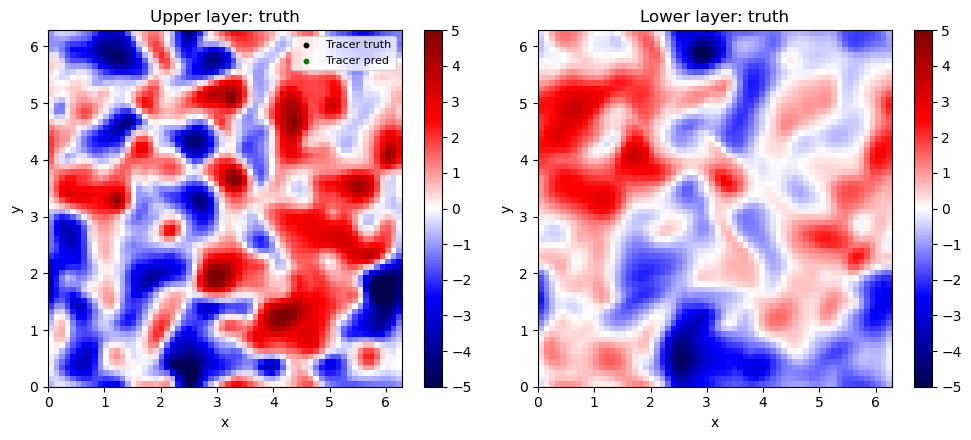

In [3]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(5., 5.)
plot_combined_fields_with_tracers(psi_truth[nt, :, :, 0], psi_truth[nt, :, :, 1], np.full((2,2), np.nan), np.full((2,2), np.nan), 'truth', colorlim)

In [7]:
# from param_est import params_est
train_size = 5000
val_size = 0
test_size = 5000
psi1_k_t = np.fft.fft2(psi_truth[train_size+val_size:train_size+val_size+test_size, :, :, 0], axes=(1, 2)).transpose(1,2,0)
psi2_k_t = np.fft.fft2(psi_truth[train_size+val_size:train_size+val_size+test_size, :, :, 1], axes=(1, 2)).transpose(1,2,0)

In [ ]:
hk_est = params_est(K, dt_ob, psi1_k_t[:,:,:100], psi2_k_t[:,:,:100], kd, beta, kappa, nu, U, r_cut=32, style='circle').squeeze()

begin compute A, B matrices...


In [ ]:
from conj_symm_tools import avg_conj_symm_
hk_est = avg_conj_symm_(hk_est)

In [ ]:
h_est = np.fft.ifft2(hk_est)
h_truth = topo

/tmp/ipykernel_882215/1217558479.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_est


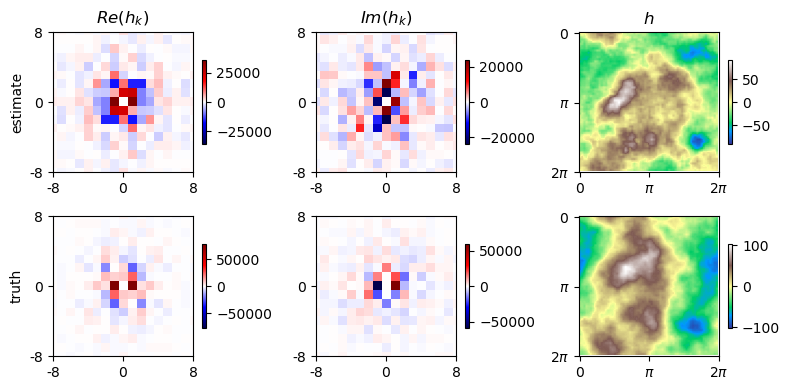

In [327]:
# Plot topography
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk_est.real
dataplot[:, :, 0, 1] = hk_est.imag
dataplot[:, :, 0, 2] = h_est
dataplot[:, :, 1, 0] = hk.real
dataplot[:, :, 1, 1] = hk.imag
dataplot[:, :, 1, 2] = h_truth
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
xticks = np.array([0, np.pi, 2*np.pi])
xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']
r_cut = 8

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        if j<2:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
            axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        else:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='terrain', vmin=-maxabs, vmax=maxabs)
            axs[i,j].set_xticks(np.linspace(0, K, len(xticks))) 
            axs[i,j].set_yticks(np.linspace(0, K, len(xticks)))
            axs[i,j].set_xticklabels(xticklabels)
            axs[i,j].set_yticklabels(xticklabels)
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/topo1_est(truth).png')
plt.show()

In [ ]:
np.save('../data/topo_est(truth).npy', h_est)

In [8]:
# from param_est import params_est
psi1_k_t = np.fft.fft2(psi_cgkn_da[..., 0], axes=(1, 2)).transpose(1,2,0)
psi2_k_t = np.fft.fft2(psi_cgkn_da[..., 1], axes=(1, 2)).transpose(1,2,0)

In [11]:
hk_est = params_est(K, dt_ob, psi1_k_t[:,:,:100], psi2_k_t[:,:,:100], kd, beta, kappa, nu, U, r_cut=32, style='circle').squeeze()

begin compute A, B matrices...
successfully compute A, B matrices...
successfully seperate real and imaginary parts...
successfully regression...
Relative residual (est): 8.88e-01
finished. (time used: 0.85 hrs)


In [12]:
from conj_symm_tools import avg_conj_symm_
hk_est = avg_conj_symm_(hk_est)

In [329]:
h_est = np.load('../data/topo1_est(cgkn).npy')
hk_est = np.fft.fft2(h_est)

In [13]:
h_est = np.fft.ifft2(hk_est)
h_truth = topo

/tmp/ipykernel_882215/3470615920.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_est


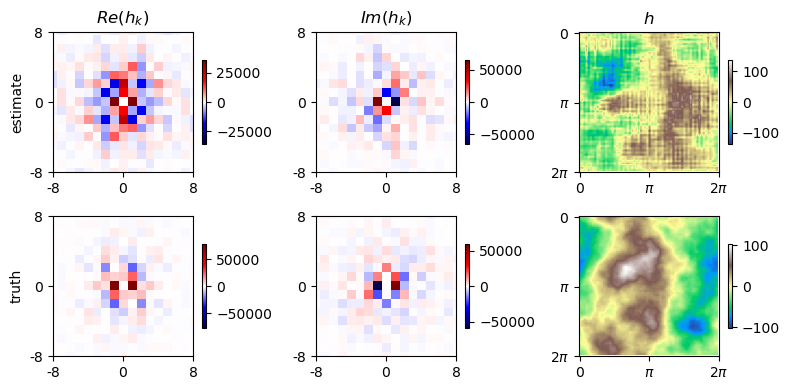

In [331]:
# Plot topography
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk_est.real
dataplot[:, :, 0, 1] = hk_est.imag
dataplot[:, :, 0, 2] = h_est
dataplot[:, :, 1, 0] = hk.real
dataplot[:, :, 1, 1] = hk.imag
dataplot[:, :, 1, 2] = h_truth
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
xticks = np.array([0, np.pi, 2*np.pi])
xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']
r_cut = 8

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        if j<2:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
            axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        else:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='terrain', vmin=-maxabs, vmax=maxabs)
            axs[i,j].set_xticks(np.linspace(0, K, len(xticks))) 
            axs[i,j].set_yticks(np.linspace(0, K, len(xticks)))
            axs[i,j].set_xticklabels(xticklabels)
            axs[i,j].set_yticklabels(xticklabels)
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/topo1_est(cgkn).png')
plt.show()

In [17]:
np.save('../data/topo1_est(cgkn).npy', h_est)

In [75]:
import numpy as np
data = np.load('../data/qg_data_topo1.npz')
topo = data['topo'][::2, ::2]
dt_ob = data['dt_ob'].item()
K = 64
h_est_truth = np.load('../data/topo1_est(truth).npy')
hk_est_truth = np.fft.fft2(h_est_truth)
h_est_cgkn = np.load('../data/topo1_est(cgkn).npy')
hk_est_cgkn = np.fft.fft2(h_est_cgkn)
h_truth = topo
hk_truth = np.fft.fft2(topo)

/tmp/ipykernel_2447439/1303329936.py:27: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, i, 2] = data_h[i]


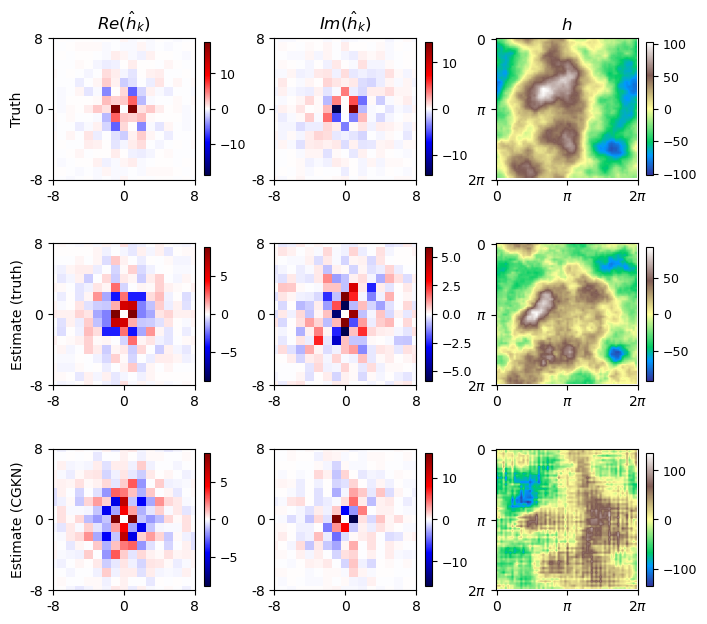

In [76]:
plot_topography_grid(
    data_real=[hk_truth.real/K**2, hk_est_truth.real/K**2, hk_est_cgkn.real/K**2],
    data_imag=[hk_truth.imag/K**2, hk_est_truth.imag/K**2, hk_est_cgkn.imag/K**2],
    data_h=[h_truth, h_est_truth, h_est_cgkn],
    method_labels=['Truth', 'Estimate (truth)', 'Estimate (CGKN)'],
    r_cut=8
)
plt.savefig('../figure/topo_comparison_topo1.png')

### Topo2

In [6]:
data = np.load('../data/qg_data_topo2.npz')
K = 64
kd = data['kd'].item()
kb = data['kb'].item()
U = data['U'].item()
kappa = data['r'].item()
H = data['H'].item()
nu = data['nu'].item()
dt = data['dt'].item()
dt_obs = data['dt_obs'].item()
psi_truth = data['psi_truth']
beta = kb**2
topo = data['topo'][::2, ::2]
hk = np.fft.fft2(topo)
psi_cgkn_da = np.load('../data/CGKN_topo2_retrain_psi_DA.npy')

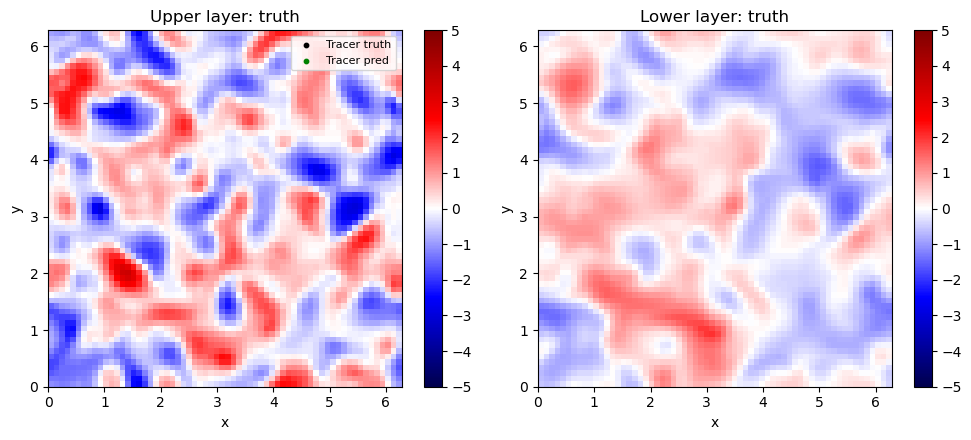

In [7]:
from plot import plot_combined_fields_with_tracers
nt=-1
colorlim=(5., 5.)
plot_combined_fields_with_tracers(psi_truth[nt, :, :, 0], psi_truth[nt, :, :, 1], np.full((2,2), np.nan), np.full((2,2), np.nan), 'truth', colorlim)

In [8]:
train_size = 5000
val_size = 0
test_size = 5000
psi1_k_t = np.fft.fft2(psi_truth[train_size+val_size:train_size+val_size+test_size, :, :, 0], axes=(1, 2)).transpose(1,2,0)
psi2_k_t = np.fft.fft2(psi_truth[train_size+val_size:train_size+val_size+test_size, :, :, 1], axes=(1, 2)).transpose(1,2,0)

In [10]:
from param_est import params_est
hk_est = params_est(K, dt_obs, psi1_k_t[:,:,:100], psi2_k_t[:,:,:100], kd, beta, kappa, nu, U, r_cut=32, style='circle').squeeze()

begin compute A, B matrices...
successfully compute A, B matrices...
successfully seperate real and imaginary parts...
successfully regression...
Relative residual (est): 9.14e-01
finished. (time used: 0.35 hrs)


In [11]:
from conj_symm_tools import avg_conj_symm_
hk_est = avg_conj_symm_(hk_est)

In [12]:
h_est = np.fft.ifft2(hk_est)
h_truth = topo

/tmp/ipykernel_2575213/3177846987.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_est


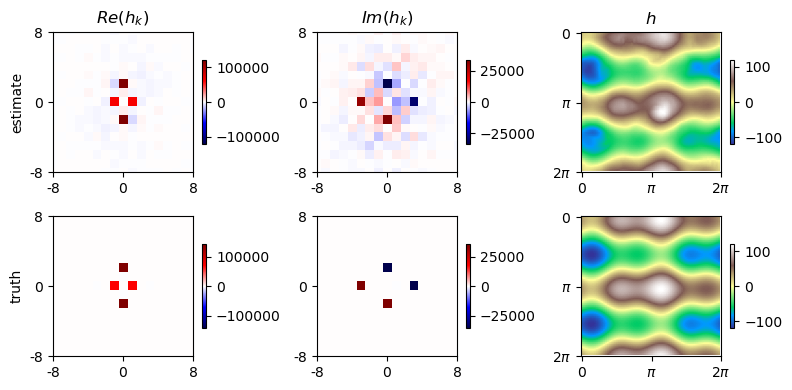

In [13]:
# Plot topography
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk_est.real
dataplot[:, :, 0, 1] = hk_est.imag
dataplot[:, :, 0, 2] = h_est
dataplot[:, :, 1, 0] = hk.real
dataplot[:, :, 1, 1] = hk.imag
dataplot[:, :, 1, 2] = h_truth
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
xticks = np.array([0, np.pi, 2*np.pi])
xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']
r_cut = 8

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        if j<2:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
            axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        else:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='terrain', vmin=-maxabs, vmax=maxabs)
            axs[i,j].set_xticks(np.linspace(0, K, len(xticks))) 
            axs[i,j].set_yticks(np.linspace(0, K, len(xticks)))
            axs[i,j].set_xticklabels(xticklabels)
            axs[i,j].set_yticklabels(xticklabels)
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/topo2_est(truth).png')
plt.show()

In [14]:
np.save('../data/topo2_est(truth).npy', h_est)

In [15]:
# from param_est import params_est
psi1_k_t = np.fft.fft2(psi_cgkn_da[..., 0], axes=(1, 2)).transpose(1,2,0)
psi2_k_t = np.fft.fft2(psi_cgkn_da[..., 1], axes=(1, 2)).transpose(1,2,0)

In [16]:
hk_est = params_est(K, dt_obs, psi1_k_t[:,:,:100], psi2_k_t[:,:,:100], kd, beta, kappa, nu, U, r_cut=32, style='circle').squeeze()

begin compute A, B matrices...
successfully compute A, B matrices...
successfully seperate real and imaginary parts...
successfully regression...
Relative residual (est): 9.16e-01
finished. (time used: 0.33 hrs)


In [17]:
from conj_symm_tools import avg_conj_symm_
hk_est = avg_conj_symm_(hk_est)

In [19]:
h_est = np.fft.ifft2(hk_est)
np.save('../data/topo2_est(cgkn).npy', h_est)

In [28]:
h_est = np.load('../data/topo2_est(cgkn).npy')
hk_est = np.fft.fft2(h_est)

In [29]:
h_est = np.fft.ifft2(hk_est)
h_truth = topo

/tmp/ipykernel_2575213/1620163293.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_est


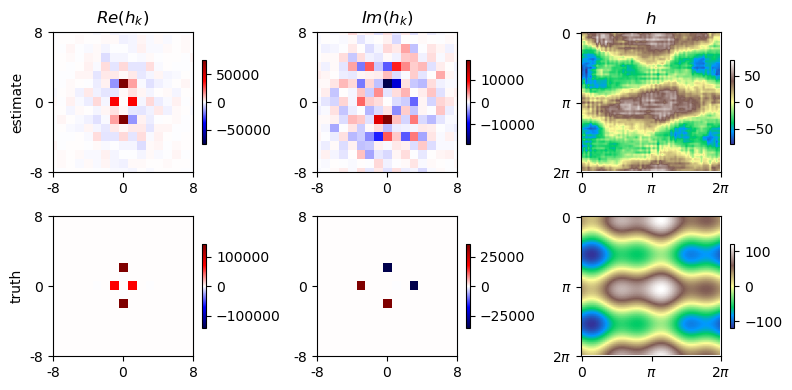

In [21]:
# Plot topography
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk_est.real
dataplot[:, :, 0, 1] = hk_est.imag
dataplot[:, :, 0, 2] = h_est
dataplot[:, :, 1, 0] = hk.real
dataplot[:, :, 1, 1] = hk.imag
dataplot[:, :, 1, 2] = h_truth
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
xticks = np.array([0, np.pi, 2*np.pi])
xticklabels = [r'$0$', r'$\pi$', r'$2\pi$']
r_cut = 8

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        if j<2:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
            axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        else:
            im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='terrain', vmin=-maxabs, vmax=maxabs)
            axs[i,j].set_xticks(np.linspace(0, K, len(xticks))) 
            axs[i,j].set_yticks(np.linspace(0, K, len(xticks)))
            axs[i,j].set_xticklabels(xticklabels)
            axs[i,j].set_yticklabels(xticklabels)
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/topo2_est(cgkn).png')
plt.show()

In [2]:
import numpy as np
data = np.load('../data/qg_data_topo2.npz')
topo = data['topo'][::2, ::2]
K = 64
h_est_truth = np.load('../data/topo2_est(truth).npy')
hk_est_truth = np.fft.fft2(h_est_truth)
h_est_cgkn = np.load('../data/topo2_est(cgkn).npy')
hk_est_cgkn = np.fft.fft2(h_est_cgkn)
h_truth = topo
hk_truth = np.fft.fft2(topo)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/plot.py:881: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, i, 2] = data_h[i]


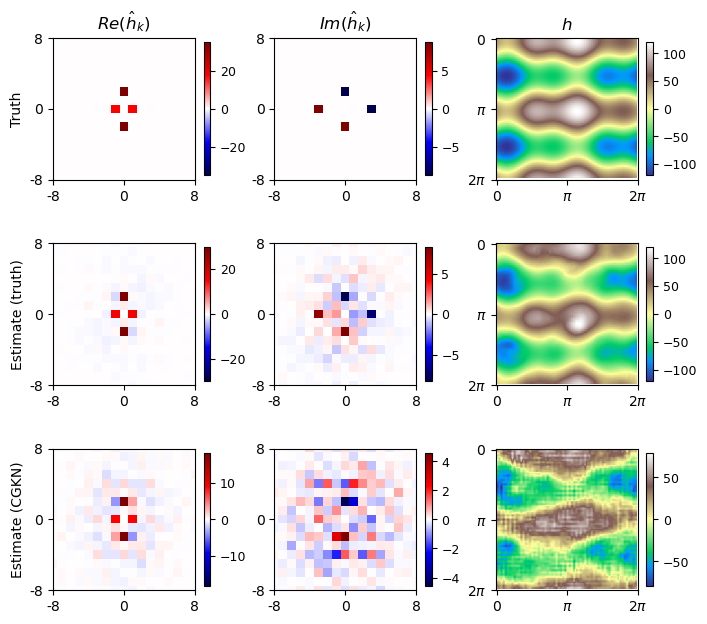

In [3]:
from plot import plot_topography_grid
plot_topography_grid(
    data_real=[hk_truth.real/K**2, hk_est_truth.real/K**2, hk_est_cgkn.real/K**2],
    data_imag=[hk_truth.imag/K**2, hk_est_truth.imag/K**2, hk_est_cgkn.imag/K**2],
    data_h=[h_truth, h_est_truth, h_est_cgkn],
    method_labels=['Truth', 'Estimate (truth)', 'Estimate (CGKN)'],
    r_cut=8
)
plt.savefig('../figure/topo_comparison_topo2.png')

# Appendix

## Learning sparse vector/matrix

##### 2D test

###### Fit $\text{flatten}(g1(x,y))\cdot \text{flatten}(\psi)$

In [16]:
import numpy as np
import torch
import torch.nn as nn
class Field2point(torch.nn.Module):
    def __init__(self, K, dtype=torch.float32, chunk_size=32):
        super().__init__()
        self.K = K
        self.dtype = dtype
        self.chunk_size = chunk_size

        kx = torch.fft.fftfreq(K, d=1.0/K).to(dtype)
        ky = torch.fft.fftfreq(K, d=1.0/K).to(dtype)
        KX, KY = torch.meshgrid(kx, ky, indexing="xy")
        self.register_buffer("KX_flat", KX.flatten().to(dtype=torch.complex64))  # (K²,)
        self.register_buffer("KY_flat", KY.flatten().to(dtype=torch.complex64))  # (K²,)

    def forward(self, x0, y0, psi):
        """
        Parameters:
        - x0, y0: (B, L) float tensors of tracer positions (range [0, 2pi])
        - psi: (B, K, K) real-valued streamfunction fields

        Returns:
        - psi_x: (B, L) interpolated psi values at the positions
        """

        B, L = x0.shape
        K, KX_flat, KY_flat = self.K, self.KX_flat, self.KY_flat  # (K²,)

        # FFT on each sample in the batch
        psi_hat = torch.fft.fft2(psi)  # (B, K, K)
        psi_hat_flat = psi_hat.reshape(B, -1)  # (B, K²)
        psi_x = torch.empty(B, L, dtype=self.dtype, device=psi.device)
        for start in range(0, L, self.chunk_size):
            end = min(start + self.chunk_size, L)
            x_chunk = x0[:, start:end]  # (B, chunk)
            y_chunk = y0[:, start:end]  # (B, chunk)

            # (B, chunk, K²) = (B, chunk, 1) × (1, 1, K²)
            exp_term = torch.exp(1j * (x_chunk[..., None] * KX_flat + y_chunk[..., None] * KY_flat))  # (B, chunk, K²)
            psi_chunk = torch.einsum("blk,bk->bl", exp_term, psi_hat_flat)  # (B, chunk)
            psi_x[:, start:end] = torch.real(psi_chunk) / (K ** 2)

        return psi_x  # shape (B, L)

device = torch.device("cpu")
QG_Data = np.load(r"../data/qg_data_sigmaxy01_t1000_subsampled.npz")
pos = torch.tensor(QG_Data["xy_obs"], dtype=torch.float) # shape (Nt, L, 2)
psi = torch.tensor(QG_Data["psi_noisy"][..., 0], dtype=torch.float) # shape (Nt, 128, 128)
pos = pos.to(device)
psi = psi.to(device)
field2point = Field2point(K=64, chunk_size=2).to(device)
with torch.no_grad():
    psi_pos = field2point(pos[..., 0], pos[..., 1], psi) # shape (Nt, L)

Ntrain = 20000
Ntest = 5000
# test_pos = pos[Ntrain:Ntrain+Ntest].numpy()
# test_psi = psi[Ntrain:Ntrain+Ntest].numpy()
test_psi_pos = psi_pos[Ntrain:Ntrain+Ntest].numpy()
test_psi_pos_pred = np.load("../data/CGN_64x64_g1_test.npy")

In [19]:
np.mean((test_psi_pos-test_psi_pos_pred)**2)

0.034567747

In [21]:
test_psi_pos.shape

(5000, 128)

In [22]:
np.mean((test_psi_pos[1:]-test_psi_pos[:-1])**2)

0.08203644

(0.0, 100.0)

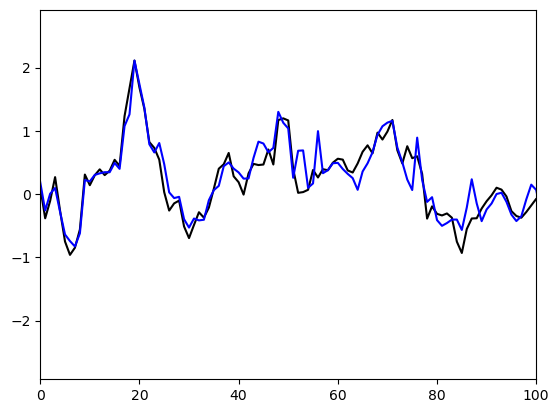

In [20]:
import matplotlib.pyplot as plt
l = 0
plt.plot(test_psi_pos[:, l], 'k')
plt.plot(test_psi_pos_pred[:, l], 'b')
plt.xlim(0,100)

###### Fit $g1(x,y)$ (the interpolation function) directly

Large dataset 10000

Epoch 0, Loss: 1.720745e-03
Epoch 100, Loss: 3.935696e-04
Epoch 200, Loss: 2.581034e-04
Epoch 300, Loss: 2.272336e-04
Epoch 400, Loss: 2.099451e-04
Epoch 500, Loss: 2.029826e-04
Epoch 600, Loss: 2.002237e-04
Epoch 700, Loss: 1.964663e-04
Epoch 800, Loss: 1.943996e-04
Epoch 900, Loss: 1.911595e-04
Epoch 1000, Loss: 1.919664e-04

Test MSE (2D ψ field): 2.028806e-02


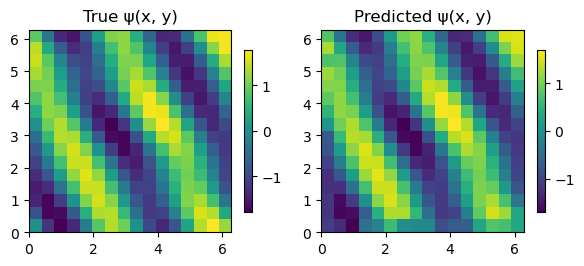

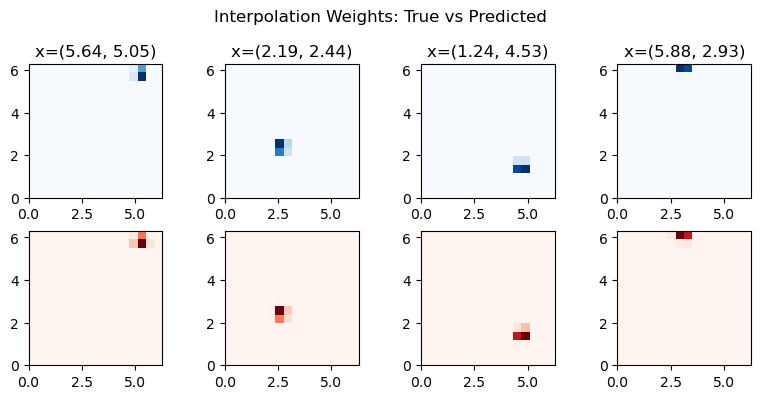

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Grid setup
n = 16  # grid resolution per axis
x1_grid = np.linspace(0, 2*np.pi, n, endpoint=False)
x2_grid = np.linspace(0, 2*np.pi, n, endpoint=False)
xx1, xx2 = np.meshgrid(x1_grid, x2_grid, indexing='ij')

# === Generate training data for 2D interpolation ===
def generate_2d_training_data(num_samples, n):
    xs = np.random.uniform(0, 2*np.pi, size=(num_samples, 2))
    weights = []

    for x in xs:
        x1, x2 = x

        # Find 2D bilinear interpolation weights
        i = np.searchsorted(x1_grid, x1, side='right') % n
        j = np.searchsorted(x2_grid, x2, side='right') % n
        i0, i1 = (i - 1) % n, i % n
        j0, j1 = (j - 1) % n, j % n
        x1_0, x1_1 = x1_grid[i0], x1_grid[i1]
        x2_0, x2_1 = x2_grid[j0], x2_grid[j1]
        tx = (x1 - x1_0) / ((x1_1 - x1_0) % (2*np.pi))
        ty = (x2 - x2_0) / ((x2_1 - x2_0) % (2*np.pi))
        w = np.zeros((n, n))
        w[i0, j0] = (1 - tx) * (1 - ty)
        w[i0, j1] = (1 - tx) * ty
        w[i1, j0] = tx * (1 - ty)
        w[i1, j1] = tx * ty

        weights.append(w.flatten())
        # weights.append(w)
    weights = np.array(weights)

    x_tensor = torch.tensor(xs, dtype=torch.float32).to(device)        # (N, 2)
    w_tensor = torch.tensor(weights, dtype=torch.float32).to(device)   # (N, n²) / # (N, n, n)
    return x_tensor, w_tensor

x_train, w_train = generate_2d_training_data(num_samples=10000, n=n)

# === 2D InterpolationNet ===
class InterpolationNet2D(nn.Module):
    def __init__(self, n, hidden_dim=128, use_pos_encoding=True, num_frequencies=6):
        super().__init__()
        self.n = n
        self.use_pos_encoding = use_pos_encoding
        self.num_frequencies = num_frequencies

        in_dim = 2  # (x1, x2)
        if use_pos_encoding:
            in_dim = 2 + 2 * 2 * num_frequencies  # sin/cos for each x1 and x2

        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, n * n)
        )

    def forward(self, x):
        if self.use_pos_encoding:
            x = self.positional_encoding(x)
        out = self.net(x)
        out = F.softmax(out / 1, dim=1) # sharp attention
        # out = out.view(-1, 1, self.n, self.n)    # shape (B, 1, n, n)
        return out

    def positional_encoding(self, x):
        """
        Input: x of shape (B, 2)
        Output: encoded x of shape (B, 2+ 4*num_frequencies)
        """
        freqs = 2 ** torch.arange(self.num_frequencies, device=x.device) * np.pi  # (F,)
        x1 = x[:, 0:1] * freqs                 # (B, F)
        x2 = x[:, 1:2] * freqs                 # (B, F)
        encoded = torch.cat([x, torch.sin(x1), torch.cos(x1), torch.sin(x2), torch.cos(x2)], dim=1)  # shape: (B, 2+4F)
        return encoded

model = InterpolationNet2D(n=n, hidden_dim=128, use_pos_encoding=False, num_frequencies=4).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# === Training ===
batch_size = 1000
train_dataset = TensorDataset(x_train, w_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
n_epoch = 1001
for epoch in range(n_epoch):
    model.train()
    epoch_loss = 0.0
    for xb, wb in train_loader:
        optimizer.zero_grad()
        w_pred = model(xb)                          # shape (B, 1, n*n)
        loss = loss_fn(w_pred.squeeze(1), wb)       # shape (B, n, n)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * xb.size(0)      # accumulate batch loss

    epoch_loss /= len(train_dataset)                # average over all samples
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {epoch_loss:.6e}")

# === Test ψ and MSE ===
model.eval()
test_size = 1000
test_psis = []
preds = []
with torch.no_grad():
    for _ in range(test_size):
        freqs = np.array([[1, 2], [2, 1], [3, 2]])
        coeffs = np.random.randn(len(freqs)) * np.exp(-np.arange(len(freqs)))
        psi = np.zeros((n, n))
        for c, (k1, k2) in zip(coeffs, freqs):
            psi += c * np.sin(k1 * xx1 + k2 * xx2)

        psi_tensor = torch.tensor(psi.flatten(), dtype=torch.float32, device=device)

        x_eval = np.stack([xx1.ravel(), xx2.ravel()], axis=1)
        x_eval = torch.tensor(x_eval, dtype=torch.float32, device=device)
        w_hat = model(x_eval)  # shape (n², n*n)
        # w_hat = w_hat.view(w_hat.shape[0], -1)
        psi_pred = (w_hat * psi_tensor).sum(dim=1).cpu().numpy()
        psi_true = psi.flatten()

        test_psis.append(psi_true)
        preds.append(psi_pred)

test_psi_true = np.stack(test_psis, axis=0)
test_psi_pred = np.stack(preds, axis=0)
test_mse = np.mean((test_psi_true - test_psi_pred) ** 2)
print(f"\nTest MSE (2D ψ field): {test_mse:.6e}")

# === Visualize one test ψ field ===
ind = -1
plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1)
plt.imshow(test_psi_true[ind].reshape(n, n), origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi])
plt.title('True ψ(x, y)')
plt.colorbar(shrink=.6)
plt.subplot(1, 2, 2)
plt.imshow(test_psi_pred[ind].reshape(n, n), origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi])
plt.title('Predicted ψ(x, y)')
plt.colorbar(shrink=.6)
plt.tight_layout()
plt.show()

# === Plot learned weights vs true weights at a few random (x₁, x₂) ===
with torch.no_grad():
    sample_xs = np.random.uniform(0, 2*np.pi, size=(4, 2))
    fig, axs = plt.subplots(2, 4, figsize=(8, 4))  # 4 samples, 2 images each

    for i, (x1, x2) in enumerate(sample_xs):
        i_idx = np.searchsorted(x1_grid, x1, side='right') % n
        j_idx = np.searchsorted(x2_grid, x2, side='right') % n
        i0, i1 = (i_idx - 1) % n, i_idx % n
        j0, j1 = (j_idx - 1) % n, j_idx % n
        x1_0, x1_1 = x1_grid[i0], x1_grid[i1]
        x2_0, x2_1 = x2_grid[j0], x2_grid[j1]
        tx = (x1 - x1_0) / ((x1_1 - x1_0) % (2*np.pi))
        ty = (x2 - x2_0) / ((x2_1 - x2_0) % (2*np.pi))

        w_true = np.zeros((n, n))
        w_true[i0, j0] = (1 - tx) * (1 - ty)
        w_true[i0, j1] = (1 - tx) * ty
        w_true[i1, j0] = tx * (1 - ty)
        w_true[i1, j1] = tx * ty
        x_tensor = torch.tensor([[x1, x2]], dtype=torch.float32).to(device)
        w_pred = model(x_tensor).squeeze().cpu().numpy().reshape(n, n)
        # w_pred = model(x_tensor).squeeze().cpu().numpy()
        
        axs[0, i].imshow(w_true, origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi], cmap='Blues')
        axs[0, i].set_title(f"x=({x1:.2f}, {x2:.2f})")
        axs[1, i].imshow(w_pred, origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi], cmap='Reds')

    plt.suptitle("Interpolation Weights: True vs Predicted")
    plt.tight_layout()
    plt.show()

small dataset n_samples = 1000

Epoch 0, Loss: 1.704041e-03
Epoch 100, Loss: 8.020535e-04
Epoch 200, Loss: 4.813352e-04
Epoch 300, Loss: 3.937453e-04
Epoch 400, Loss: 3.346409e-04
Epoch 500, Loss: 3.095115e-04
Epoch 600, Loss: 3.051747e-04
Epoch 700, Loss: 2.844040e-04
Epoch 800, Loss: 2.671064e-04
Epoch 900, Loss: 2.876546e-04
Epoch 1000, Loss: 2.662975e-04

Test MSE (2D ψ field): 5.643965e-02


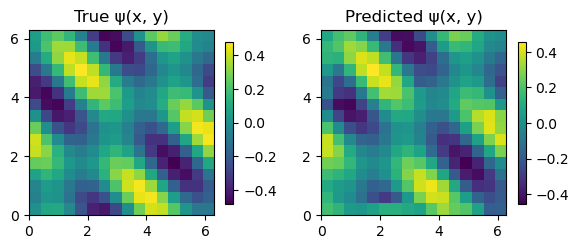

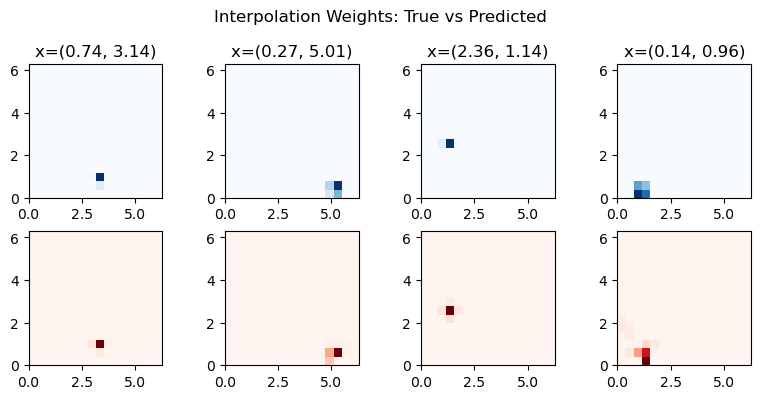

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Grid setup
n = 16  # grid resolution per axis
x1_grid = np.linspace(0, 2*np.pi, n, endpoint=False)
x2_grid = np.linspace(0, 2*np.pi, n, endpoint=False)
xx1, xx2 = np.meshgrid(x1_grid, x2_grid, indexing='ij')

# === Generate training data for 2D interpolation ===
def generate_2d_training_data(num_samples, n):
    xs = np.random.uniform(0, 2*np.pi, size=(num_samples, 2))
    weights = []

    for x in xs:
        x1, x2 = x

        # Find 2D bilinear interpolation weights
        i = np.searchsorted(x1_grid, x1, side='right') % n
        j = np.searchsorted(x2_grid, x2, side='right') % n
        i0, i1 = (i - 1) % n, i % n
        j0, j1 = (j - 1) % n, j % n
        x1_0, x1_1 = x1_grid[i0], x1_grid[i1]
        x2_0, x2_1 = x2_grid[j0], x2_grid[j1]
        tx = (x1 - x1_0) / ((x1_1 - x1_0) % (2*np.pi))
        ty = (x2 - x2_0) / ((x2_1 - x2_0) % (2*np.pi))
        w = np.zeros((n, n))
        w[i0, j0] = (1 - tx) * (1 - ty)
        w[i0, j1] = (1 - tx) * ty
        w[i1, j0] = tx * (1 - ty)
        w[i1, j1] = tx * ty

        weights.append(w.flatten())
        # weights.append(w)
    weights = np.array(weights)

    x_tensor = torch.tensor(xs, dtype=torch.float32).to(device)        # (N, 2)
    w_tensor = torch.tensor(weights, dtype=torch.float32).to(device)   # (N, n²) / # (N, n, n)
    return x_tensor, w_tensor

x_train, w_train = generate_2d_training_data(num_samples=1000, n=n)

# === 2D InterpolationNet ===
class InterpolationNet2D(nn.Module):
    def __init__(self, n, hidden_dim=128, use_pos_encoding=True, num_frequencies=6):
        super().__init__()
        self.n = n
        self.use_pos_encoding = use_pos_encoding
        self.num_frequencies = num_frequencies

        in_dim = 2  # (x1, x2)
        if use_pos_encoding:
            in_dim = 2 + 2 * 2 * num_frequencies  # sin/cos for each x1 and x2

        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, n * n)
        )

    def forward(self, x):
        if self.use_pos_encoding:
            x = self.positional_encoding(x)
        out = self.net(x)
        out = F.softmax(out / 1, dim=1) # sharp attention
        # out = out.view(-1, 1, self.n, self.n)    # shape (B, 1, n, n)
        return out

    def positional_encoding(self, x):
        """
        Input: x of shape (B, 2)
        Output: encoded x of shape (B, 2+ 4*num_frequencies)
        """
        freqs = 2 ** torch.arange(self.num_frequencies, device=x.device) * np.pi  # (F,)
        x1 = x[:, 0:1] * freqs                 # (B, F)
        x2 = x[:, 1:2] * freqs                 # (B, F)
        encoded = torch.cat([x, torch.sin(x1), torch.cos(x1), torch.sin(x2), torch.cos(x2)], dim=1)  # shape: (B, 2+4F)
        return encoded

model = InterpolationNet2D(n=n, hidden_dim=128, use_pos_encoding=False, num_frequencies=4).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# === Training ===
batch_size = 100
train_dataset = TensorDataset(x_train, w_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
n_epoch = 1001
for epoch in range(n_epoch):
    model.train()
    epoch_loss = 0.0
    for xb, wb in train_loader:
        optimizer.zero_grad()
        w_pred = model(xb)                          # shape (B, 1, n*n)
        loss = loss_fn(w_pred.squeeze(1), wb)       # shape (B, n, n)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * xb.size(0)      # accumulate batch loss

    epoch_loss /= len(train_dataset)                # average over all samples
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {epoch_loss:.6e}")

# === Test ψ and MSE ===
model.eval()
test_size = 1000
test_psis = []
preds = []
with torch.no_grad():
    for _ in range(test_size):
        freqs = np.array([[1, 2], [2, 1], [3, 2]])
        coeffs = np.random.randn(len(freqs)) * np.exp(-np.arange(len(freqs)))
        psi = np.zeros((n, n))
        for c, (k1, k2) in zip(coeffs, freqs):
            psi += c * np.sin(k1 * xx1 + k2 * xx2)

        psi_tensor = torch.tensor(psi.flatten(), dtype=torch.float32, device=device)

        x_eval = np.stack([xx1.ravel(), xx2.ravel()], axis=1)
        x_eval = torch.tensor(x_eval, dtype=torch.float32, device=device)
        w_hat = model(x_eval)  # shape (n², n*n)
        # w_hat = w_hat.view(w_hat.shape[0], -1)
        psi_pred = (w_hat * psi_tensor).sum(dim=1).cpu().numpy()
        psi_true = psi.flatten()

        test_psis.append(psi_true)
        preds.append(psi_pred)

test_psi_true = np.stack(test_psis, axis=0)
test_psi_pred = np.stack(preds, axis=0)
test_mse = np.mean((test_psi_true - test_psi_pred) ** 2)
print(f"\nTest MSE (2D ψ field): {test_mse:.6e}")

# === Visualize one test ψ field ===
ind = -1
plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1)
plt.imshow(test_psi_true[ind].reshape(n, n), origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi])
plt.title('True ψ(x, y)')
plt.colorbar(shrink=.6)
plt.subplot(1, 2, 2)
plt.imshow(test_psi_pred[ind].reshape(n, n), origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi])
plt.title('Predicted ψ(x, y)')
plt.colorbar(shrink=.6)
plt.tight_layout()
plt.show()

# === Plot learned weights vs true weights at a few random (x₁, x₂) ===
with torch.no_grad():
    sample_xs = np.random.uniform(0, 2*np.pi, size=(4, 2))
    fig, axs = plt.subplots(2, 4, figsize=(8, 4))  # 4 samples, 2 images each

    for i, (x1, x2) in enumerate(sample_xs):
        i_idx = np.searchsorted(x1_grid, x1, side='right') % n
        j_idx = np.searchsorted(x2_grid, x2, side='right') % n
        i0, i1 = (i_idx - 1) % n, i_idx % n
        j0, j1 = (j_idx - 1) % n, j_idx % n
        x1_0, x1_1 = x1_grid[i0], x1_grid[i1]
        x2_0, x2_1 = x2_grid[j0], x2_grid[j1]
        tx = (x1 - x1_0) / ((x1_1 - x1_0) % (2*np.pi))
        ty = (x2 - x2_0) / ((x2_1 - x2_0) % (2*np.pi))

        w_true = np.zeros((n, n))
        w_true[i0, j0] = (1 - tx) * (1 - ty)
        w_true[i0, j1] = (1 - tx) * ty
        w_true[i1, j0] = tx * (1 - ty)
        w_true[i1, j1] = tx * ty
        x_tensor = torch.tensor([[x1, x2]], dtype=torch.float32).to(device)
        w_pred = model(x_tensor).squeeze().cpu().numpy().reshape(n, n)
        # w_pred = model(x_tensor).squeeze().cpu().numpy()
        
        axs[0, i].imshow(w_true, origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi], cmap='Blues')
        axs[0, i].set_title(f"x=({x1:.2f}, {x2:.2f})")
        axs[1, i].imshow(w_pred, origin='lower', extent=[0, 2*np.pi, 0, 2*np.pi], cmap='Reds')

    plt.suptitle("Interpolation Weights: True vs Predicted")
    plt.tight_layout()
    plt.show()

The sparse vector (interpolation vector) $g(x,y)$ can be learned well with NN in the 2D case.  
One important thing:  
1. Training with minibatch helps.
2. positional encoding helps a lot.
3. Softmax helps.

improve forecast model; (autoencoder, latent dim)
train-test performance gap (data amount: in-distribution)


##### 1D test

###### Fit $g1(x)\cdot \psi$

Epoch 0, Loss: 10.409724
Epoch 100, Loss: 0.143595
Epoch 200, Loss: 0.086168
Epoch 300, Loss: 0.057296
Epoch 400, Loss: 0.042967
Epoch 500, Loss: 0.034462
Epoch 600, Loss: 0.029054
Epoch 700, Loss: 0.025453
Epoch 800, Loss: 0.022934
Epoch 900, Loss: 0.021108

Test MSE: 1.868354e-02


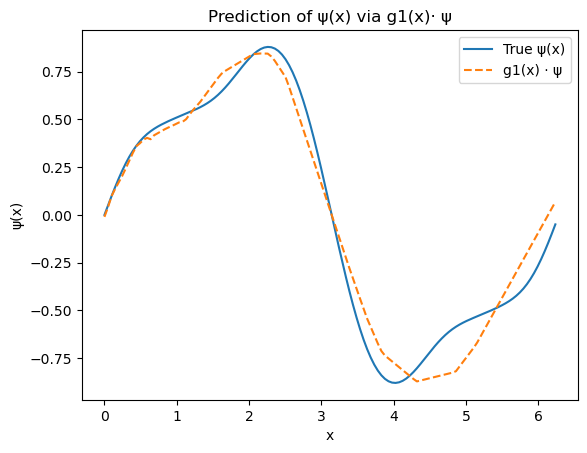

In [65]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Parameters
n = 128  # size of psi
num_samples = int(1e6)  # training samples

# Create dataset: arbitrary psi and x, with target psi(x)
def generate_dataset(num_samples, n):
    X = []
    Psi = []
    Targets = []

    for _ in range(num_samples):
        # Sample arbitrary psi (e.g., sum of random Fourier modes)
        coeffs = np.random.randn(10) * np.exp(-np.arange(10))  # decay for smoothness
        freqs = np.arange(1, 11)
        grid = np.linspace(0, 2*np.pi, n, endpoint=False)
        psi = sum(c * np.sin(f * grid) for c, f in zip(coeffs, freqs))

        # Sample a random point x in [0, 2pi)
        x = np.random.uniform(0, 2*np.pi)

        # Interpolate to get psi(x)
        psi_x = np.interp(x, grid, psi, period=2*np.pi)

        X.append(x)
        Psi.append(psi)
        Targets.append(psi_x)

    return (
        torch.tensor(X, dtype=torch.float32).unsqueeze(1),
        torch.tensor(Psi, dtype=torch.float32),
        torch.tensor(Targets, dtype=torch.float32)
    )

# Generate dataset
x_train, psi_train, y_train = generate_dataset(num_samples, n)
x_train, psi_train, y_train = x_train.to(device), psi_train.to(device), y_train.to(device)

# Neural network g1(x, psi) -> vector of length n
class G1Net(nn.Module):
    def __init__(self, n):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(1, 128),
            nn.ReLU(),
            nn.Linear(128, n)
        )

    def forward(self, x):
        return self.net(x)  # output is shape (batch, n)
# """
# Model, optimizer, loss
model = G1Net(n).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# Training loop
epochs = 1000
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    g1_out = model(x_train)  # shape (batch, n)
    preds = (g1_out * psi_train).sum(dim=1)  # shape (batch,)
    loss = loss_fn(preds, y_train)
    loss.backward()
    optimizer.step()

    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.6f}")
# """
# Evaluate on a new sample
model.eval()
test_size = 1000
test_psis = []
preds = []
with torch.no_grad():
    for i in range(test_size):
        # Generate one test psi and a sweep of x values
        grid = np.linspace(0, 2*np.pi, n, endpoint=False)
        coeffs = np.random.randn(10) * np.exp(-np.arange(10))
        freqs = np.arange(1, 11)
        test_psi = sum(c * np.sin(f * grid) for c, f in zip(coeffs, freqs))
        test_psi_tensor = torch.tensor(test_psi, dtype=torch.float32, device=device).unsqueeze(0).repeat(n, 1)
        x_eval = torch.tensor(grid, dtype=torch.float32, device=device).unsqueeze(1)
        g1_eval = model(x_eval)
        pred = (g1_eval * test_psi_tensor).sum(dim=1).cpu().numpy()
        test_psis.append(test_psi)
        preds.append(pred)
test_psi = np.stack(test_psis, axis=0)
test_psi_pred = np.stack(preds, axis=0)
test_mse = np.mean((test_psi-test_psi_pred)**2)
print(f"\nTest MSE: {test_mse:.6e}")
np.save(r"../data/Sparse_vec_1d_test_psi_truth.npy", test_psi.to("cpu"))
np.save(r"../data/Sparse_vec_1d_test_psi_pred.npy", test_psi_pred.to("cpu"))

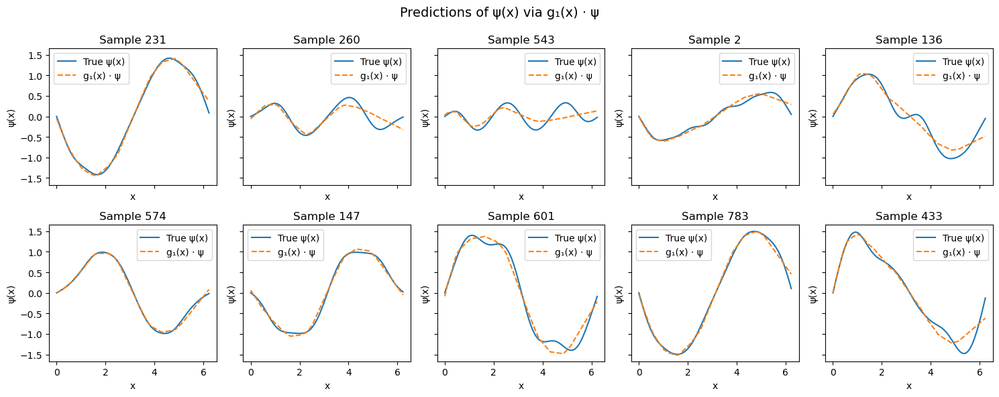

In [92]:
import matplotlib.pyplot as plt
import math

num_plots = 10
indices = np.random.randint(0, test_size, num_plots)  # list of indices to plot
ncols = 5
nrows = math.ceil(num_plots / ncols)

fig, axs = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows), sharex=True, sharey=True)
axs = axs.flatten()  # flatten in case of single row
for i, ind in enumerate(indices):
    ax = axs[i]
    ax.plot(grid, test_psi[ind], label='True ψ(x)')
    ax.plot(grid, test_psi_pred[ind], '--', label='g₁(x) · ψ')
    ax.set_title(f'Sample {ind}')
    ax.set_xlabel('x')
    ax.set_ylabel('ψ(x)')
    ax.legend()
for i in range(len(indices), len(axs)):
    axs[i].axis('off')

plt.suptitle('Predictions of ψ(x) via g₁(x) · ψ', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.99])  # adjust for suptitle
plt.savefig('../figure/sparse_vec_learning_1d.png')
plt.show()

###### Fit $g1(x)$ (the interpolation function) directly

Epoch 0, Loss: 5.085800e-03
Epoch 100, Loss: 3.906084e-05
Epoch 200, Loss: 3.417063e-05
Epoch 300, Loss: 2.541876e-05
Epoch 400, Loss: 2.663841e-05

Test MSE: 2.015710e-05


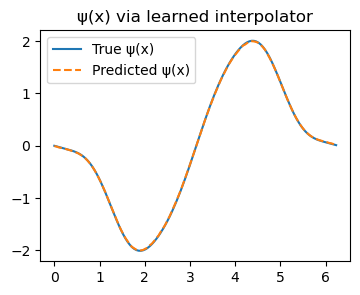

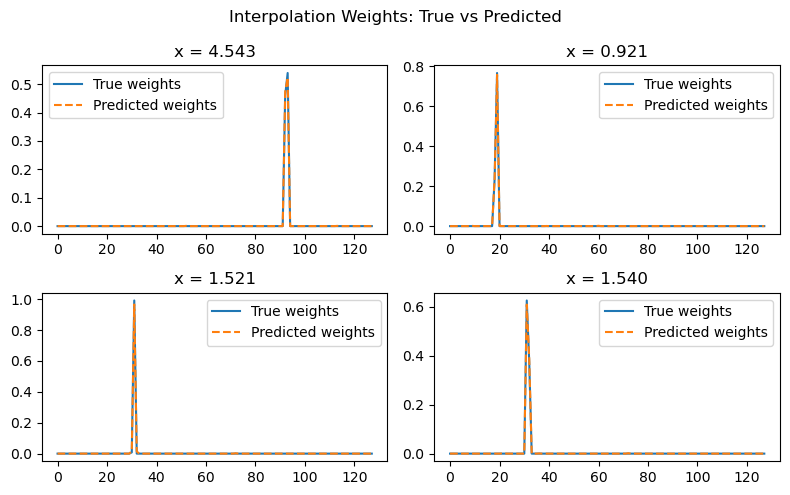

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Grid and resolution
n = 128
x_grid = np.linspace(0, 2*np.pi, n, endpoint=False)

# === Generate training data: x ∈ [0, 2π), target weights for linear interpolation ===
def generate_training_data(num_samples, n):
    xs = np.random.uniform(0, 2*np.pi, size=(num_samples,))
    weights = []

    for x in xs:
        idx = np.searchsorted(x_grid, x, side='right') % n
        x0 = x_grid[(idx - 1) % n]
        x1 = x_grid[idx % n]
        t = (x - x0) / ((x1 - x0) % (2*np.pi))
        w = np.zeros(n)
        w[(idx - 1) % n] = 1 - t
        w[idx % n] = t
        weights.append(w)

    x_tensor = torch.tensor(xs, dtype=torch.float32).unsqueeze(1).to(device)  # shape (N, 1)
    w_tensor = torch.tensor(weights, dtype=torch.float32).to(device)          # shape (N, n)
    return x_tensor, w_tensor

# Training data
x_train, w_train = generate_training_data(num_samples=10000, n=n)

# === Model ===
class InterpolationNet(nn.Module):
    def __init__(self, n, hidden_dim=128, use_pos_encoding=False, num_frequencies=4):
        super().__init__()
        self.n = n
        self.use_pos_encoding = use_pos_encoding
        self.num_frequencies = num_frequencies

        input_dim = 1 + (num_frequencies*2 if use_pos_encoding else 0)
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, n)
        )

    def forward(self, x):
        if self.use_pos_encoding:
            x = self.positional_encoding(x)
        out = self.net(x)
        return F.softmax(out, dim=1)  # Ensures non-negative, sums to 1

    def positional_encoding(self, x):
        freqs = 2 ** torch.arange(self.num_frequencies, device=x.device) * np.pi
        x_expand = x * freqs  # shape (B, num_frequencies)
        sin = torch.sin(x_expand)
        cos = torch.cos(x_expand)
        return torch.cat([x] + [sin, cos], dim=1)  # shape (B, 1 + 2*num_frequencies)

model = InterpolationNet(n, use_pos_encoding=True).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# === Training ===
# Wrap into dataset and loader
batch_size = 256
train_dataset = TensorDataset(x_train, w_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# === Training ===
n_epoch = 500
for epoch in range(n_epoch):
    model.train()
    epoch_loss = 0.0
    for xb, wb in train_loader:
        optimizer.zero_grad()
        w_pred = model(xb)            # shape (B, n)
        loss = loss_fn(w_pred, wb)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * xb.size(0)

    epoch_loss /= len(train_dataset)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {epoch_loss:.6e}")

# === Test ψ and visualize ===
model.eval()
test_size = 1000
test_psis = []
preds = []
with torch.no_grad():
    for i in range(test_size):
        freqs = np.arange(1, 11)
        coeffs = np.random.randn(10) * np.exp(-np.arange(10))
        psi = sum(c * np.sin(f * x_grid) for c, f in zip(coeffs, freqs))
        psi_tensor = torch.tensor(psi, dtype=torch.float32, device=device)
        
        # Evaluate model over full grid
        x_test = torch.tensor(x_grid, dtype=torch.float32).unsqueeze(1).to(device)
        w_hat = model(x_test)  # shape (n, n)
        psi_pred = (w_hat * psi_tensor).sum(dim=1).cpu().numpy()
        psi_true = np.interp(x_grid, x_grid, psi, period=2*np.pi)
        test_psis.append(psi_true)
        preds.append(psi_pred)
test_psi_true = np.stack(test_psis, axis=0)
test_psi_pred = np.stack(preds, axis=0)
test_mse = np.mean((test_psi_true-test_psi_pred)**2)
print(f"\nTest MSE: {test_mse:.6e}")

# Plot ψ(x)
ind = -1
plt.figure(figsize=(4,3))
plt.plot(x_grid, test_psi_true[ind], label='True ψ(x)')
plt.plot(x_grid, test_psi_pred[ind], '--', label='Predicted ψ(x)')
plt.title('ψ(x) via learned interpolator')
plt.legend()
plt.show()

# === Plot learned weights vs true weights at a few x ===
with torch.no_grad():
    sample_xs = np.random.uniform(0, 2*np.pi, 4)
    fig, axs = plt.subplots(2, 2, figsize=(8, 5))

    for i, x in enumerate(sample_xs):
        idx = np.searchsorted(x_grid, x, side='right') % n
        x0 = x_grid[(idx - 1) % n]
        x1 = x_grid[idx % n]
        t = (x - x0) / ((x1 - x0) % (2*np.pi))
        w_true = np.zeros(n)
        w_true[(idx - 1) % n] = 1 - t
        w_true[idx % n] = t

        x_tensor = torch.tensor([[x]], dtype=torch.float32).to(device)  # shape (1, 1)
        w_pred = model(x_tensor).squeeze().cpu().numpy()

        ax = axs[i // 2][i % 2]
        ax.plot(w_true, label='True weights')
        ax.plot(w_pred, '--', label='Predicted weights')
        ax.set_title(f"x = {x:.3f}")
        ax.legend()

    plt.suptitle("Interpolation Weights: True vs Predicted")
    plt.tight_layout()
    plt.show()

Epoch 0, Loss: 5.130230e-03
Epoch 100, Loss: 2.635061e-03
Epoch 200, Loss: 1.961705e-03
Epoch 300, Loss: 1.466862e-03
Epoch 400, Loss: 1.143208e-03

Test MSE: 5.608832e-05


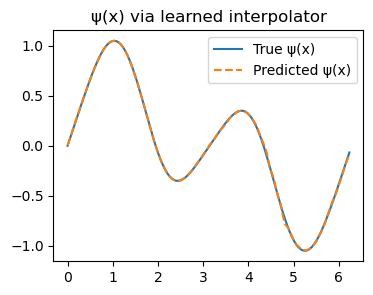

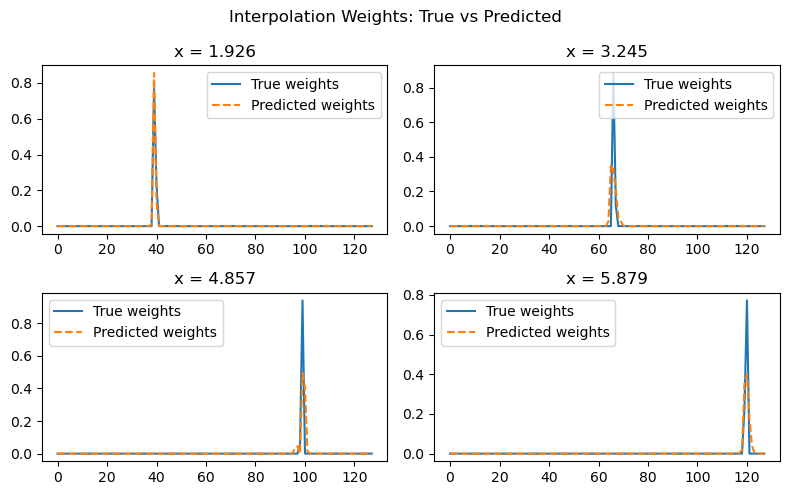

In [17]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Grid and resolution
n = 128
x_grid = np.linspace(0, 2*np.pi, n, endpoint=False)

# === Generate training data: x ∈ [0, 2π), target weights for linear interpolation ===
def generate_training_data(num_samples, n):
    xs = np.random.uniform(0, 2*np.pi, size=(num_samples,))
    weights = []

    for x in xs:
        idx = np.searchsorted(x_grid, x, side='right') % n
        x0 = x_grid[(idx - 1) % n]
        x1 = x_grid[idx % n]
        t = (x - x0) / ((x1 - x0) % (2*np.pi))
        w = np.zeros(n)
        w[(idx - 1) % n] = 1 - t
        w[idx % n] = t
        weights.append(w)

    x_tensor = torch.tensor(xs, dtype=torch.float32).unsqueeze(1).to(device)  # shape (N, 1)
    w_tensor = torch.tensor(weights, dtype=torch.float32).to(device)          # shape (N, n)
    return x_tensor, w_tensor

# Training data
x_train, w_train = generate_training_data(num_samples=10000, n=n)

# === Model ===
class InterpolationNet(nn.Module):
    def __init__(self, n, hidden_dim=128, use_pos_encoding=False, num_frequencies=4):
        super().__init__()
        self.n = n
        self.use_pos_encoding = use_pos_encoding
        self.num_frequencies = num_frequencies

        input_dim = 1 + (num_frequencies*2 if use_pos_encoding else 0)
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, n)
        )

    def forward(self, x):
        if self.use_pos_encoding:
            x = self.positional_encoding(x)
        out = self.net(x)
        return F.softmax(out, dim=1)  # Ensures non-negative, sums to 1

    def positional_encoding(self, x):
        freqs = 2 ** torch.arange(self.num_frequencies, device=x.device) * np.pi
        x_expand = x * freqs  # shape (B, num_frequencies)
        sin = torch.sin(x_expand)
        cos = torch.cos(x_expand)
        return torch.cat([x] + [sin, cos], dim=1)  # shape (B, 1 + 2*num_frequencies)

model = InterpolationNet(n, use_pos_encoding=False).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# === Training ===
# Wrap into dataset and loader
batch_size = 200
train_dataset = TensorDataset(x_train, w_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# === Training ===
n_epoch = 500
for epoch in range(n_epoch):
    model.train()
    epoch_loss = 0.0
    for xb, wb in train_loader:
        optimizer.zero_grad()
        w_pred = model(xb)            # shape (B, n)
        loss = loss_fn(w_pred, wb)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * xb.size(0)

    epoch_loss /= len(train_dataset)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {epoch_loss:.6e}")

# === Test ψ and visualize ===
model.eval()
test_size = 1000
test_psis = []
preds = []
with torch.no_grad():
    for i in range(test_size):
        freqs = np.arange(1, 11)
        coeffs = np.random.randn(10) * np.exp(-np.arange(10))
        psi = sum(c * np.sin(f * x_grid) for c, f in zip(coeffs, freqs))
        psi_tensor = torch.tensor(psi, dtype=torch.float32, device=device)
        
        # Evaluate model over full grid
        x_test = torch.tensor(x_grid, dtype=torch.float32).unsqueeze(1).to(device)
        w_hat = model(x_test)  # shape (n, n)
        psi_pred = (w_hat * psi_tensor).sum(dim=1).cpu().numpy()
        psi_true = np.interp(x_grid, x_grid, psi, period=2*np.pi)
        test_psis.append(psi_true)
        preds.append(psi_pred)
test_psi_true = np.stack(test_psis, axis=0)
test_psi_pred = np.stack(preds, axis=0)
test_mse = np.mean((test_psi_true-test_psi_pred)**2)
print(f"\nTest MSE: {test_mse:.6e}")

# Plot ψ(x)
ind = -1
plt.figure(figsize=(4,3))
plt.plot(x_grid, test_psi_true[ind], label='True ψ(x)')
plt.plot(x_grid, test_psi_pred[ind], '--', label='Predicted ψ(x)')
plt.title('ψ(x) via learned interpolator')
plt.legend()
plt.show()

# === Plot learned weights vs true weights at a few x ===
with torch.no_grad():
    sample_xs = np.random.uniform(0, 2*np.pi, 4)
    fig, axs = plt.subplots(2, 2, figsize=(8, 5))

    for i, x in enumerate(sample_xs):
        idx = np.searchsorted(x_grid, x, side='right') % n
        x0 = x_grid[(idx - 1) % n]
        x1 = x_grid[idx % n]
        t = (x - x0) / ((x1 - x0) % (2*np.pi))
        w_true = np.zeros(n)
        w_true[(idx - 1) % n] = 1 - t
        w_true[idx % n] = t

        x_tensor = torch.tensor([[x]], dtype=torch.float32).to(device)  # shape (1, 1)
        w_pred = model(x_tensor).squeeze().cpu().numpy()

        ax = axs[i // 2][i % 2]
        ax.plot(w_true, label='True weights')
        ax.plot(w_pred, '--', label='Predicted weights')
        ax.set_title(f"x = {x:.3f}")
        ax.legend()

    plt.suptitle("Interpolation Weights: True vs Predicted")
    plt.tight_layout()
    plt.show()

The sparse vector (interpolation vector) $g(x)$ can be learned well with NN in the 1D case.  
Two important things:  
1. Training with minibatch helps.
2. Positional encoding [$sin(2^kx), cos(2^kx)$], k=0,1,2,... helps

## Flow forecasts with CNN 

###### t1000 subsampled

In [93]:
import numpy as nptest_u_original_pred
QG_Data = np.load(r"../data/qg_data_sigmaxy01_t1000_subsampled.npz")
psi = QG_Data["psi_noisy"]
Ntrain = 20000
Ntest = 5000
test_psi = psi[Ntrain:Ntrain+Ntest]
test_psi_pred = np.load("../data/CNN_psi_64x64_OneStepPrediction.npy")

In [94]:
print('upper layer MSE', np.mean((test_psi_pred[:-1, :, :, 0] - test_psi[1:, :, :, 0])**2))
print('lower layer MSE', np.mean((test_psi_pred[:-1, :, :, 1] - test_psi[1:, :, :, 1])**2))
print('total MSE', np.mean((test_psi_pred[:-1] - test_psi[1:])**2))

upper layer MSE 0.008929116957104683
lower layer MSE 0.006860427284951516
total MSE 0.007894772121028099


###### t200

In [98]:
import numpy as nptest_u_original_pred
QG_Data = np.load(r"../data/qg_data_sigmaxy01.npz")
psi = QG_Data["psi_noisy"]
Ntrain = 8000
Ntest = 2000
test_psi = psi[Ntrain:Ntrain+Ntest]
test_psi_pred = np.load("../data/CNN_psi_OneStepPrediction.npy")

In [101]:
test_psi = test_psi[1:]
test_psi_pred = test_psi_pred[:-1]

In [106]:
np.mean((test_psi[:-1] - test_psi[1:])**2)

0.016716820802785116

In [107]:
from plot import plot_contour_fields
nt = -1
colorlim=(5., 5.)

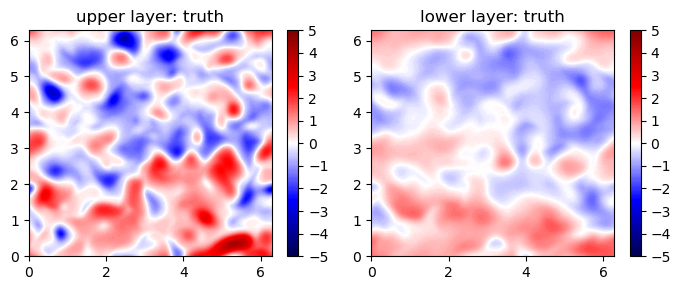

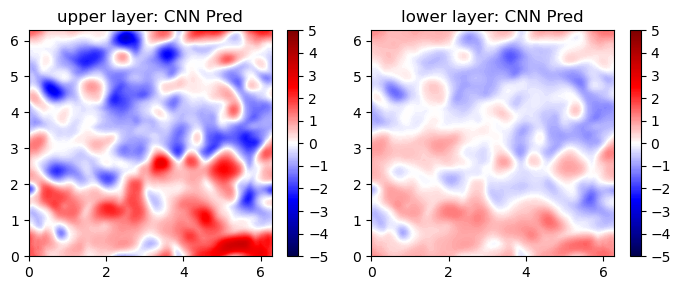

In [108]:
plot_contour_fields(test_psi[nt, :, :, 0], test_psi[nt, :, :, 1], 'truth', colorlim, levels=201)
plot_contour_fields(test_psi_pred[nt, :, :, 0], test_psi_pred[nt, :, :, 1], 'CNN Pred', colorlim, levels=201)
plt.savefig('../figure/CNN_pred_psi.png')
plt.show()

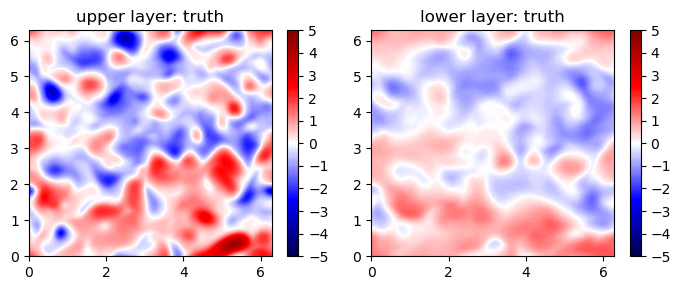

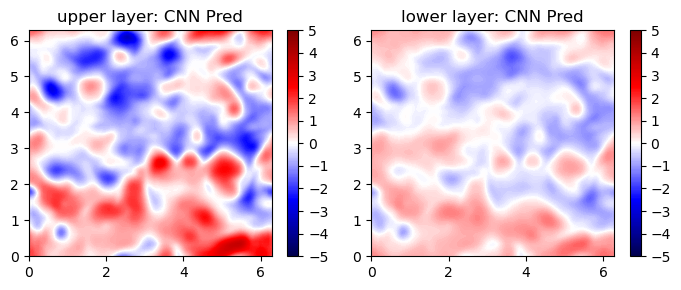

In [105]:
nt=-2
plot_contour_fields(test_psi[nt, :, :, 0], test_psi[nt, :, :, 1], 'truth', colorlim, levels=201)
# plt.savefig('../figure/truth_psi_sigmaxy01.png')
plot_contour_fields(test_psi_pred[nt, :, :, 0], test_psi_pred[nt, :, :, 1], 'CNN Pred', colorlim, levels=201)
plt.show()

# Continuous

## 0. Control run (truth)

In [3]:
# load data
data_path = '../data/qg/QG_DATA_topo40_nu1e-12_beta22_K128_dt1e-3_subs.mat'
with h5py.File(data_path, 'r') as file:
    print("Keys: %s" % file.keys())
    psi1_k_t = np.transpose(file['psi_1_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    psi2_k_t = np.transpose(file['psi_2_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    psi1_k_t_fine = np.transpose(file['psi_1_t_fine'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    dt = file['dt'][()][0,0]
    s_rate = int(file['s_rate'][()][0,0])
    params_dataset = file['params']
    nu = params_dataset['nu'][()] [0,0]
    topo = params_dataset['H'][()] [0,0]
    kd = params_dataset['kd'][()] [0,0]
    U = params_dataset['U'][()] [0,0]
    kb = params_dataset['kb'][()] [0,0]
    kappa = params_dataset['r'][()] [0,0]
    beta = kb**2
    K = int(params_dataset['N'][()] [0,0])
    H = params_dataset['H'][()] [0,0]
    topo = np.transpose(file['topo'][()], axes=(1,0))
psi1_k_t = psi1_k_t['real'] + 1j * psi1_k_t['imag']
psi2_k_t = psi2_k_t['real'] + 1j * psi2_k_t['imag']
psi1_k_t_fine = psi1_k_t_fine['real'] + 1j * psi1_k_t_fine['imag']
h_hat = np.fft.fft2(topo)
# print('psi1_k_t.shape',psi1_k_t.shape)

Keys: <KeysViewHDF5 ['#refs#', 'T', 'ape', 'countDiag', 'cut', 'dt', 'ene', 'etp', 'ii', 'ke', 'params', 'psi_1_t', 'psi_1_t_fine', 'psi_2_t', 'qp', 's_rate', 'tol', 'topo', 'utz', 'vb']>


In [6]:
# run obs model
L = 256 # number of tracers
K = psi1_k_t.shape[0]
N = psi1_k_t_fine.shape[-1]
sigma_xy = 0.1
x0 = np.random.uniform(-np.pi, np.pi, L)
y0 = np.random.uniform(-np.pi, np.pi, L)

# run model
model = Lagrange_tracer_model(N, L, K, psi1_k_t_fine, dt, sigma_xy, x0, y0, interv=8, t_interv=40000, style='square')
xt, yt, ut, vt = model.forward()   

# save data
obs = {
    'xt': xt,
    'yt': yt,
    'ut': ut,
    'vt': vt,
    'sigma_xy': sigma_xy,
    'L': L,
    'dt': dt
}
np.savez('../data/obs_K128_beta22_h40.npz', **obs)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/Lagrangian_tracer.py:128: ComplexWarning: Casting complex values to real discards the imaginary part
  self.ut[:,:,l] = u_ifft_shift[::self.interv, ::self.interv] # only save the sparsely sampled grids
/grad/wang3262/Proj_2_DAnPE_CGKN/code/Lagrangian_tracer.py:132: ComplexWarning: Casting complex values to real discards the imaginary part
  self.vt[:,:,l] = v_ifft_shift[::self.interv, ::self.interv] # only save the sparsely sampled grids


In [4]:
# truncate parameter
r_cut = 16
style = 'circle'

In [5]:
# Compute eigenvalues and eigenvectors
eigens = solve_eigen(K, beta, kd, U)
omega1 = eigens['omega1']
omega2 = eigens['omega2']
r1 = eigens['r1']
r2 = eigens['r2']

# np.savez('../data/eigens_K128_beta22.npz', **eigens)
np.where(np.isnan(r1))

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [6]:
# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)

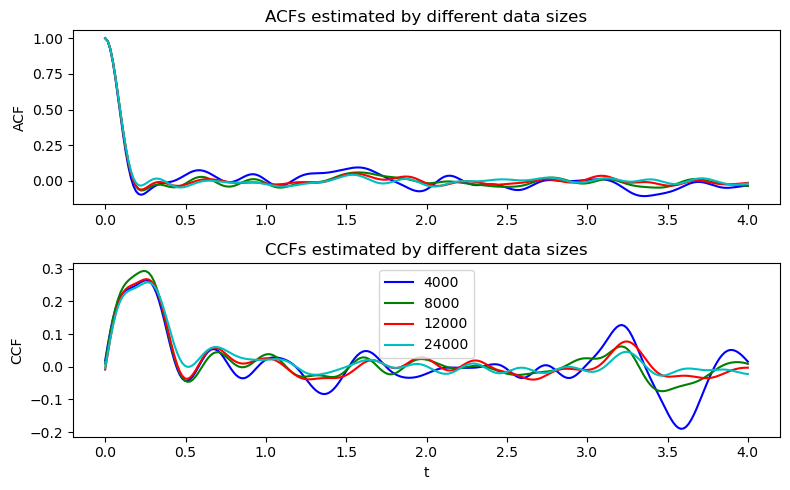

In [8]:
# Vary the amount of data used to estimate ACF    
def cf_eigen(psi1_hat_t, psi2_hat_t, r1, r2, ikx, iky, Lag):
    eigenmat_inv = np.linalg.inv(np.array([r1[iky,ikx,:],r2[iky,ikx,:]]).T)
    eigenmode = eigenmat_inv @ np.array([psi1_hat_t[iky,ikx,:],psi2_hat_t[iky,ikx,:]])
    psi1_hat = eigenmode[0,:] 
    psi2_hat = eigenmode[1,:]
    acf_psi1 = acf(np.real(psi1_hat), nlags=Lag, fft=True)  # ACF of the real part
    acf_psi2 = acf(np.real(psi2_hat), nlags=Lag, fft=True)  # ACF of the real part
    ccf_psi1 = -ccf(np.real(psi1_hat), np.imag(psi1_hat), adjusted=False)[:Lag+1]  # cross-correlation between the real and imaginary parts 
    ccf_psi2 = -ccf(np.real(psi2_hat), np.imag(psi2_hat), adjusted=False)[:Lag+1]  # cross-correlation between the real and imaginary parts
    
    return acf_psi1, acf_psi2, ccf_psi1, ccf_psi2

nums = [4000, 8000, 12000, 24000]
Lag = 250  # lag for computing the ACF
tt = np.linspace(0, Lag*dt*s_rate, num=Lag+1, endpoint=True) # time interval to plot the ACF or cross-correlation function
acf_psi = np.zeros((Lag+1,len(nums)))
acf_tau = np.zeros((Lag+1,len(nums)))
ccf_psi = np.zeros((Lag+1,len(nums)))
ccf_tau = np.zeros((Lag+1,len(nums)))

ikx = 3; iky = 0;
for inum,num in enumerate(nums):
    acf_psi[:,inum], acf_tau[:,inum], ccf_psi[:,inum], ccf_tau[:,inum] = cf_eigen(psi1_k_t[:,:,:num+Lag], psi2_k_t[:,:,:num+Lag], r1, r2, ikx, iky, Lag)
    
plt.figure(figsize=(8, 5))  # Set the figure size (optional)
colors = ['b', 'g', 'r', 'c','k']  # Colors for different lines
labels = [f'{num}' for num in nums]  # Labels for the legend

plt.subplot(2, 1, 1)
for i in range(len(nums)):
    plt.plot(tt, acf_psi[:, i], color=colors[i], label=labels[i])
plt.ylabel('ACF')
plt.title('ACFs estimated by different data sizes')

plt.subplot(2, 1, 2)
for i in range(len(nums)):
    plt.plot(tt, ccf_psi[:, i], color=colors[i], label=labels[i])
plt.xlabel('t')
plt.ylabel('CCF')
plt.title('CCFs estimated by different data sizes')
plt.legend()
plt.tight_layout()
plt.savefig('../figure/acf_ccf_diffN_K128_beta22_tr_h40.png')
plt.show()

In [9]:
# Model calibration
est_params = calibrate_OU(r1, psi_k_t, tau_k_t, K, dt*s_rate, Lag=250, r_cut=r_cut, style=style, corr_noise=False)
gamma_est = est_params['gamma']
omega_est_ccf = est_params['omega_ccf']
omega_est_acf = est_params['omega_acf']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

np.savez('../data/est_paras_ou_K128_beta22_tr_h40.npz', **est_params)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/LSM_QG.py:123: OptimizeWarning: Covariance of the parameters could not be estimated
  x1, _ = curve_fit(ACF, tt, acf_psi, p0=x0, check_finite=True, maxfev=2000)


## 1. Reduced-order stochastic models

In [2]:
# load data
data_path = '../data/qg/QG_DATA_topo32_nu1e-12_beta22_K128_dt1e-3_subs.mat'
with h5py.File(data_path, 'r') as file:
    print("Keys: %s" % file.keys())
    psi1_k_t = np.transpose(file['psi_1_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    psi2_k_t = np.transpose(file['psi_2_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    psi1_k_t_fine = np.transpose(file['psi_1_t_fine'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    dt = file['dt'][()][0,0]
    s_rate = int(file['s_rate'][()][0,0])
    params_dataset = file['params']
    nu = params_dataset['nu'][()] [0,0]
    topo = params_dataset['H'][()] [0,0]
    kd = params_dataset['kd'][()] [0,0]
    U = params_dataset['U'][()] [0,0]
    kb = params_dataset['kb'][()] [0,0]
    kappa = params_dataset['r'][()] [0,0]
    beta = kb**2
    K = int(params_dataset['N'][()] [0,0])
    H = params_dataset['H'][()] [0,0]
    topo = np.transpose(file['topo'][()], axes=(1,0))
psi1_k_t = psi1_k_t['real'] + 1j * psi1_k_t['imag']
psi2_k_t = psi2_k_t['real'] + 1j * psi2_k_t['imag']
psi1_k_t_fine = psi1_k_t_fine['real'] + 1j * psi1_k_t_fine['imag']
h_hat = np.fft.fft2(topo)
# print('psi1_k_t.shape',psi1_k_t.shape)

Keys: <KeysViewHDF5 ['#refs#', 'T', 'ape', 'countDiag', 'cut', 'dt', 'ene', 'etp', 'ii', 'ke', 'params', 'psi_1_t', 'psi_1_t_fine', 'psi_2_t', 'qp', 's_rate', 'tol', 'topo', 'utz', 'vb']>


In [6]:
# run obs model
L = 256 # number of tracers
K = psi1_k_t.shape[0]
N = psi1_k_t_fine.shape[-1]
sigma_xy = 0.1
x0 = np.random.uniform(-np.pi, np.pi, L)
y0 = np.random.uniform(-np.pi, np.pi, L)

# run model
model = Lagrange_tracer_model(N, L, K, psi1_k_t_fine, dt, sigma_xy, x0, y0, interv=8, t_interv=40000, style='square')
xt, yt, ut, vt = model.forward()   

# save data
obs = {
    'xt': xt,
    'yt': yt,
    'ut': ut,
    'vt': vt,
    'sigma_xy': sigma_xy,
    'L': L,
    'dt': dt
}
np.savez('../data/obs_K128_beta22_h32.npz', **obs)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/Lagrangian_tracer.py:128: ComplexWarning: Casting complex values to real discards the imaginary part
  self.ut[:,:,l] = u_ifft_shift[::self.interv, ::self.interv] # only save the sparsely sampled grids
/grad/wang3262/Proj_2_DAnPE_CGKN/code/Lagrangian_tracer.py:132: ComplexWarning: Casting complex values to real discards the imaginary part
  self.vt[:,:,l] = v_ifft_shift[::self.interv, ::self.interv] # only save the sparsely sampled grids


In [3]:
# truncate parameter
r_cut = 16
style = 'circle'

### 1.1 Linear stochastic models of eigenmodes

In [10]:
# Compute eigenvalues and eigenvectors
eigens = solve_eigen(K, beta, kd, U)
omega1 = eigens['omega1']
omega2 = eigens['omega2']
r1 = eigens['r1']
r2 = eigens['r2']

np.savez('../data/eigens_K128_beta22.npz', **eigens)
np.where(np.isnan(r1))

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [11]:
# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)

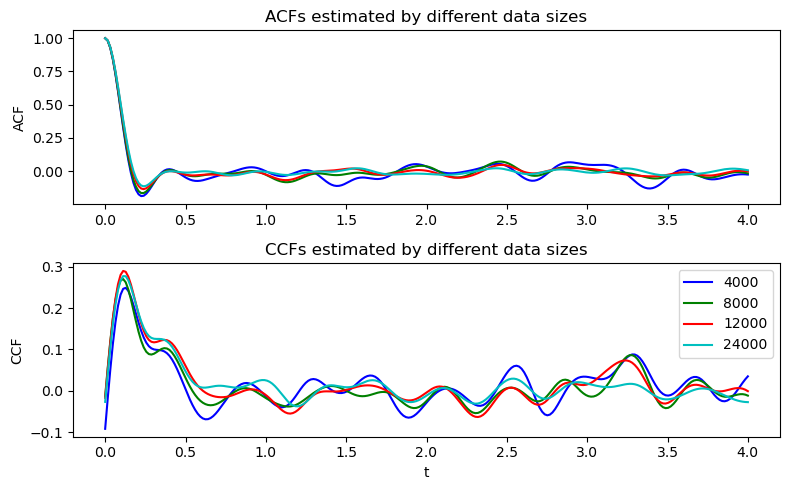

In [12]:
# Vary the amount of data used to estimate ACF    
def cf_eigen(psi1_hat_t, psi2_hat_t, r1, r2, ikx, iky, Lag):
    eigenmat_inv = np.linalg.inv(np.array([r1[iky,ikx,:],r2[iky,ikx,:]]).T)
    eigenmode = eigenmat_inv @ np.array([psi1_hat_t[iky,ikx,:],psi2_hat_t[iky,ikx,:]])
    psi1_hat = eigenmode[0,:] 
    psi2_hat = eigenmode[1,:]
    acf_psi1 = acf(np.real(psi1_hat), nlags=Lag, fft=True)  # ACF of the real part
    acf_psi2 = acf(np.real(psi2_hat), nlags=Lag, fft=True)  # ACF of the real part
    ccf_psi1 = -ccf(np.real(psi1_hat), np.imag(psi1_hat), adjusted=False)[:Lag+1]  # cross-correlation between the real and imaginary parts 
    ccf_psi2 = -ccf(np.real(psi2_hat), np.imag(psi2_hat), adjusted=False)[:Lag+1]  # cross-correlation between the real and imaginary parts
    
    return acf_psi1, acf_psi2, ccf_psi1, ccf_psi2

nums = [4000, 8000, 12000, 24000]
Lag = 250  # lag for computing the ACF
tt = np.linspace(0, Lag*dt*s_rate, num=Lag+1, endpoint=True) # time interval to plot the ACF or cross-correlation function
acf_psi = np.zeros((Lag+1,len(nums)))
acf_tau = np.zeros((Lag+1,len(nums)))
ccf_psi = np.zeros((Lag+1,len(nums)))
ccf_tau = np.zeros((Lag+1,len(nums)))

ikx = 3; iky = 0;
for inum,num in enumerate(nums):
    acf_psi[:,inum], acf_tau[:,inum], ccf_psi[:,inum], ccf_tau[:,inum] = cf_eigen(psi1_k_t[:,:,:num+Lag], psi2_k_t[:,:,:num+Lag], r1, r2, ikx, iky, Lag)
    
plt.figure(figsize=(8, 5))  # Set the figure size (optional)
colors = ['b', 'g', 'r', 'c','k']  # Colors for different lines
labels = [f'{num}' for num in nums]  # Labels for the legend

plt.subplot(2, 1, 1)
for i in range(len(nums)):
    plt.plot(tt, acf_psi[:, i], color=colors[i], label=labels[i])
plt.ylabel('ACF')
plt.title('ACFs estimated by different data sizes')

plt.subplot(2, 1, 2)
for i in range(len(nums)):
    plt.plot(tt, ccf_psi[:, i], color=colors[i], label=labels[i])
plt.xlabel('t')
plt.ylabel('CCF')
plt.title('CCFs estimated by different data sizes')
plt.legend()
plt.tight_layout()
plt.savefig('../figure/acf_ccf_diffN_K128_beta22_tr_h32.png')
plt.show()

In [13]:
# Model calibration
est_params = calibrate_OU(r1, psi_k_t, tau_k_t, K, dt*s_rate, Lag=250, r_cut=r_cut, style=style, corr_noise=False)
gamma_est = est_params['gamma']
omega_est_ccf = est_params['omega_ccf']
omega_est_acf = est_params['omega_acf']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

np.savez('../data/est_paras_ou_K128_beta22_tr_h32.npz', **est_params)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/LSM_QG.py:123: OptimizeWarning: Covariance of the parameters could not be estimated
  x1, _ = curve_fit(ACF, tt, acf_psi, p0=x0, check_finite=True, maxfev=2000)


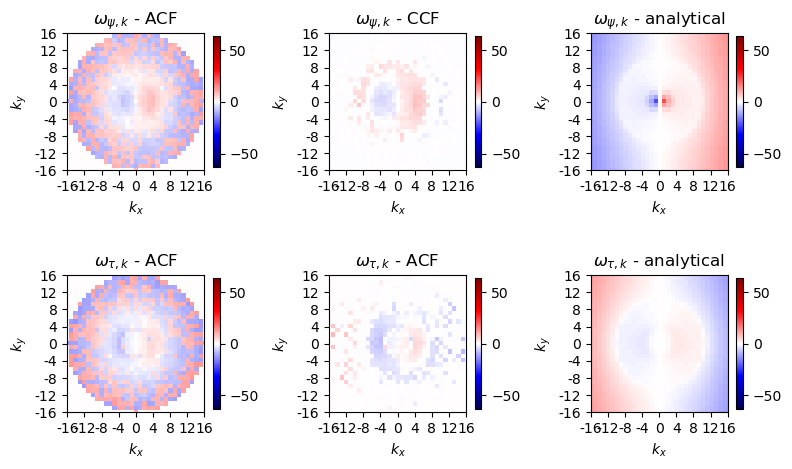

In [14]:
# Plot modes of omega
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,5))

dataplot = np.zeros((K,K,nrow, ncol))
dataplot[:,:,0,0] = omega_est[:,:,0]
dataplot[:,:,0,1] = omega_est_ccf[:,:,0]
dataplot[:,:,0,2] = omega1.real
dataplot[:,:,1,0] = omega_est[:,:,1]
dataplot[:,:,1,1] = omega_est_ccf[:,:,1]
dataplot[:,:,1,2] = omega2.real

dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
r = r_cut

for i in range(2):
    for j in range(3):
        n_tick = K//8*2
        maxabs = np.max(abs(dataplot[:, :, 0, 2]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
        axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
        axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_xlim(K//2-r, K//2+r) 
        axs[i,j].set_ylim(K//2-r, K//2+r)
        axs[i,j].set_xlabel('$k_x$')
        axs[i,j].set_ylabel('$k_y$')
        fig.colorbar(im, ax=axs[i,j], shrink=0.7)

axs[0,0].set_title(r'$\omega_{\psi,k}$ - ACF')
axs[0,1].set_title(r'$\omega_{\psi,k}$ - CCF')
axs[0,2].set_title(r'$\omega_{\psi,k}$ - analytical')
axs[1,0].set_title(r'$\omega_{\tau,k}$ - ACF')
axs[1,1].set_title(r'$\omega_{\tau,k}$ - ACF')
axs[1,2].set_title(r'$\omega_{\tau,k}$ - analytical')

plt.tight_layout()
plt.savefig('../figure/omega_compare_K128_beta22_tr_h32.png', dpi=100)
plt.show()

In [ ]:
# Run OU process
N = 40000
# get the initial condition
psi_k0 = psi_k_t[:,:,0]
tau_k0 = tau_k_t[:,:,0]
psi_k, tau_k = run_OU(psi_k0, tau_k0, K, N, dt, r_cut, r1, r2, gamma_est, omega_est, f_est, sigma_est, style=style, s_rate=s_rate, corr_noise=False)
psi1_k, psi2_k = eigen2layer(K,r_cut,r1,r2,psi_k,tau_k,style)


In [16]:
# ifft to real space
interv = 5
psi1_k, psi2_k = eigen2layer(K,r_cut,r1,r2,psi_k,tau_k,style)

psi1_ifft = np.fft.ifft2(psi1_k[:, :, ::interv], axes=(0,1))
psi1_ifft_t = np.fft.ifft2(psi1_k_t[:, :, ::interv], axes=(0,1))
psi2_ifft = np.fft.ifft2(psi2_k[:, :, ::interv], axes=(0,1))
psi2_ifft_t = np.fft.ifft2(psi2_k_t[:, :, ::interv], axes=(0,1))

psi1_ifft = np.roll(psi1_ifft, shift=K//2, axis=0) # shift domain from [0,2pi) to [-pi,pi)
psi1_ifft = np.roll(psi1_ifft, shift=K//2, axis=1) # shift domain from [0,2pi) to [-pi,pi)
psi2_ifft = np.roll(psi2_ifft, shift=K//2, axis=0) # shift domain from [0,2pi) to [-pi,pi)
psi2_ifft = np.roll(psi2_ifft, shift=K//2, axis=1) # shift domain from [0,2pi) to [-pi,pi)
psi1_ifft_t = np.roll(psi1_ifft_t, shift=K//2, axis=0) # shift domain from [0,2pi) to [-pi,pi)
psi1_ifft_t = np.roll(psi1_ifft_t, shift=K//2, axis=1) # shift domain from [0,2pi) to [-pi,pi)
psi2_ifft_t = np.roll(psi2_ifft_t, shift=K//2, axis=0) # shift domain from [0,2pi) to [-pi,pi)
psi2_ifft_t = np.roll(psi2_ifft_t, shift=K//2, axis=1) # shift domain from [0,2pi) to [-pi,pi)

In [17]:
psi1_ifft_t = psi1_ifft_t[:,:,:500]
psi2_ifft_t = psi2_ifft_t[:,:,:500]

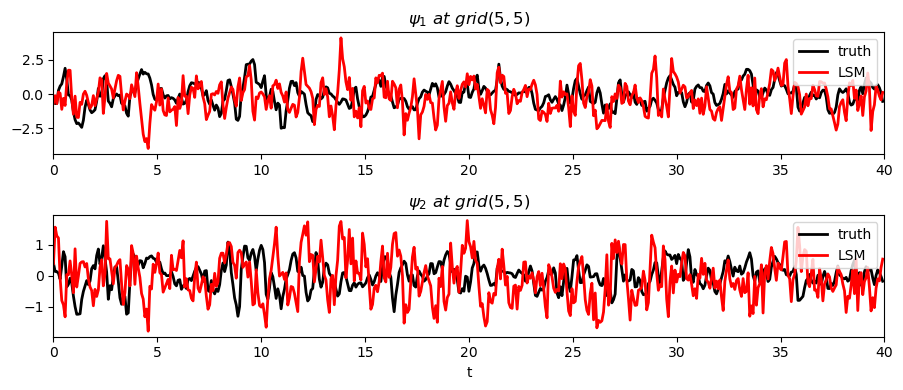

In [18]:
# Plotting trajectories
mode = 5
plt.figure(figsize=(9, 4))
plt.subplot(2, 1, 1)
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi1_ifft_t[mode,mode,:]), 'k', linewidth=2, label='truth')
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi1_ifft[mode,mode,:]), 'r', linewidth=2, label='LSM')
plt.title(r'$\psi_1\ at\ grid({{{:d},{:d}}})$'.format(mode, mode))
plt.xlim(0,N*dt)
plt.legend()
# plt.xlabel('t')

plt.subplot(2, 1, 2)
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi2_ifft_t[mode,mode,:]), 'k', linewidth=2, label='truth')
plt.plot(np.arange(0, (N)*dt, dt*s_rate*interv), np.real(psi2_ifft[mode,mode,:]), 'r', linewidth=2, label='LSM')
plt.title(r'$\psi_2\ at\ grid({{{:d},{:d}}})$'.format(mode, mode))
plt.legend()
plt.xlabel('t')
plt.xlim(0,N*dt)
plt.tight_layout()
plt.savefig('../figure/psi_layer_ou_truth_K128_beta22_tr_h32.png', dpi=100)
plt.show()

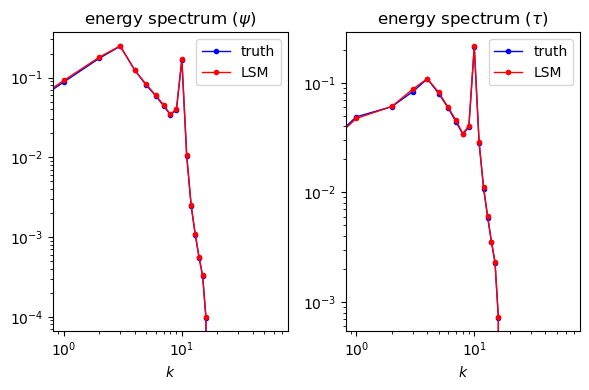

In [19]:
# energy spectrum of eigenmodes
t_avrg = 8000
psi_hat_t = np.concatenate((psi_k_t[:,:,None,-t_avrg:], tau_k_t[:,:,None,-t_avrg:]), axis=2)
ke, ape, ene, etp, e_mode = ene_spectrum(np.transpose(psi_hat_t, axes=(3,0,1,2)), K, kd, topo, r_cut)
psi_hat = np.concatenate((psi_k[:,:,None,-t_avrg:], tau_k[:,:,None,-t_avrg:]), axis=2)
ke_ou, ape_ou, ene_ou, etp_ou, e_mode_ou = ene_spectrum(np.transpose(psi_hat, axes=(3,0,1,2)), K, kd, topo, r_cut)

# Plot spectrum
nrow = 1; ncol = 2
fig, axs = plt.subplots(nrow, ncol, figsize=(6,4))

dataplot = np.zeros((K//2 + 1, 3, nrow, ncol))
dataplot[:,0,0,0] = e_mode[:,0]
dataplot[:,1,0,0] = e_mode_ou[:,0]
dataplot[:,0,0,1] = e_mode[:,1]
dataplot[:,1,0,1] = e_mode_ou[:,1]

for i in range(2):
    n_tick = 4
    axs[i].loglog(np.arange(0, K//2 + 1), dataplot[:,0,0,i], '.-b', linewidth=1, label='truth')
    axs[i].loglog(np.arange(0, K//2 + 1), dataplot[:,1,0,i], '.-r', linewidth=1, label='LSM')
#         axs[i,j].set_ylim(K//2-r, K//2+r)
    axs[i].set_xlabel('$k$')
    axs[i].legend()

axs[0].set_title(r'energy spectrum ($\psi$)')
axs[1].set_title(r'energy spectrum ($\tau$)')

plt.tight_layout()
plt.savefig('../figure/spectrum_eigen_K128_beta22_tr_h32.png', dpi=100)
plt.show()

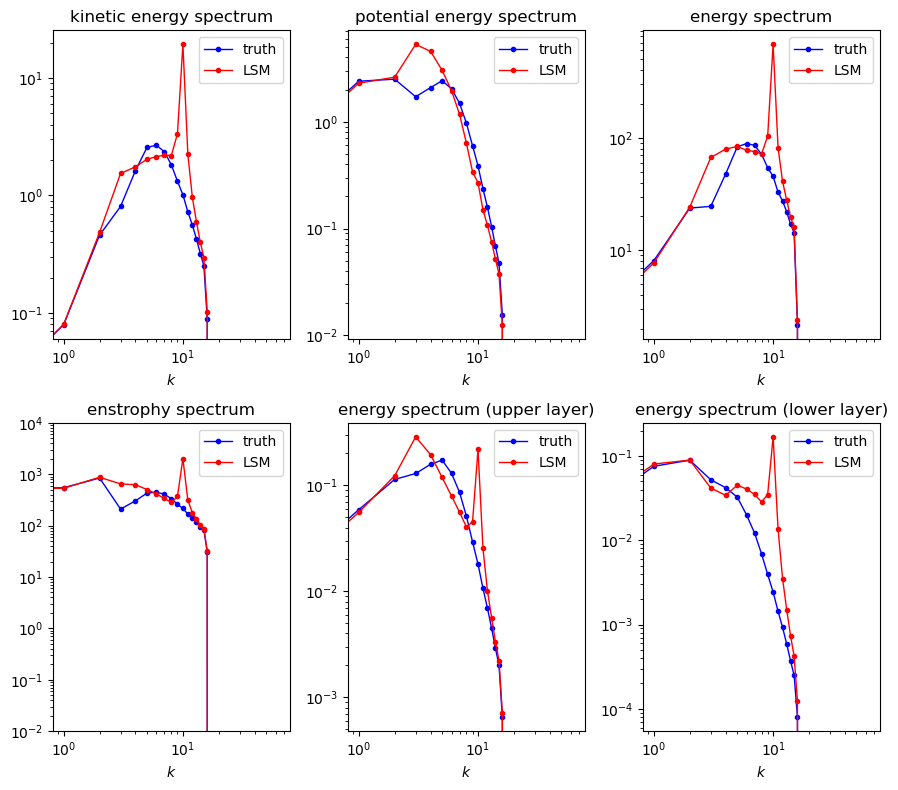

In [20]:
# energy spectrum of layers
t_avrg = 8000
psi_hat_t = np.concatenate((psi1_k_t[:,:,None,-t_avrg:], psi2_k_t[:,:,None,-t_avrg:]), axis=2)
ke, ape, ene, etp, e_mode = ene_spectrum(np.transpose(psi_hat_t, axes=(3,0,1,2)), K, kd, topo, r_cut)
psi_hat = np.concatenate((psi1_k[:,:,None,-t_avrg:], psi2_k[:,:,None,-t_avrg:]), axis=2)
ke_ou, ape_ou, ene_ou, etp_ou, e_mode_ou = ene_spectrum(np.transpose(psi_hat, axes=(3,0,1,2)), K, kd, topo, r_cut)

# Plot spectrum
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(9,8))

dataplot = np.zeros((K//2 + 1, 3, nrow, ncol))
dataplot[:,0,0,0] = ke
dataplot[:,1,0,0] = ke_ou
dataplot[:,0,0,1] = ape
dataplot[:,1,0,1] = ape_ou
dataplot[:,0,0,2] = ene
dataplot[:,1,0,2] = ene_ou
dataplot[:,0,1,0] = etp
dataplot[:,1,1,0] = etp_ou
dataplot[:,0,1,1] = e_mode[:,0]
dataplot[:,1,1,1] = e_mode_ou[:,0]
dataplot[:,0,1,2] = e_mode[:,1]
dataplot[:,1,1,2] = e_mode_ou[:,1]

for i in range(2):
    for j in range(3):
        n_tick = 4
        axs[i,j].loglog(np.arange(0, K//2 + 1), dataplot[:,0,i,j], '.-b', linewidth=1, label='truth')
        axs[i,j].loglog(np.arange(0, K//2 + 1), dataplot[:,1,i,j], '.-r', linewidth=1, label='LSM')
#         axs[i,j].set_ylim(K//2-r, K//2+r)
        axs[i,j].set_xlabel('$k$')
        axs[i,j].legend()

# axs[0,0].set_ylim(1e-5, 10)
axs[1,0].set_ylim(1e-2, 10000)

axs[0,0].set_title('kinetic energy spectrum')
axs[0,1].set_title('potential energy spectrum')
axs[0,2].set_title('energy spectrum')
axs[1,0].set_title('enstrophy spectrum')
axs[1,1].set_title(r'energy spectrum (upper layer)')
axs[1,2].set_title(r'energy spectrum (lower layer)')

plt.tight_layout()
plt.savefig('../figure/spectrum_layer_K128_beta22_tr_h32.png', dpi=100)
plt.show()

## 2. Data assimilation

In [10]:
# load data
data_path = '../data/qg/QG_DATA_topo40_nu1e-12_beta22_K128_dt1e-3_subs.mat'
with h5py.File(data_path, 'r') as file:
    print("Keys: %s" % file.keys())
    psi1_k_t = np.transpose(file['psi_1_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    psi2_k_t = np.transpose(file['psi_2_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    # psi1_k_t_fine = np.transpose(file['psi_1_t_fine'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    dt = file['dt'][()][0,0]
    s_rate = int(file['s_rate'][()][0,0])
    params_dataset = file['params']
    nu = params_dataset['nu'][()] [0,0]
    topo = params_dataset['H'][()] [0,0]
    kd = params_dataset['kd'][()] [0,0]
    U = params_dataset['U'][()] [0,0]
    kb = params_dataset['kb'][()] [0,0]
    kappa = params_dataset['r'][()] [0,0]
    beta = kb**2
    K = int(params_dataset['N'][()] [0,0])
    H = params_dataset['H'][()] [0,0]
    topo = np.transpose(file['topo'][()], axes=(1,0))
psi1_k_t = psi1_k_t['real'] + 1j * psi1_k_t['imag']
psi2_k_t = psi2_k_t['real'] + 1j * psi2_k_t['imag']
# psi1_k_t_fine = psi1_k_t_fine['real'] + 1j * psi1_k_t_fine['imag']
h_hat = np.fft.fft2(topo)
# print('psi1_k_t.shape',psi1_k_t.shape)

Keys: <KeysViewHDF5 ['#refs#', 'T', 'ape', 'countDiag', 'cut', 'dt', 'ene', 'etp', 'ii', 'ke', 'params', 'psi_1_t', 'psi_1_t_fine', 'psi_2_t', 'qp', 's_rate', 'tol', 'topo', 'utz', 'vb']>


In [11]:
# DA is evaluated on the last 100000 steps
psi1_k_t = psi1_k_t[:, :, 18750:]
psi2_k_t = psi2_k_t[:, :, 18750:]

In [4]:
# load data of LSM
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
obs = np.load('../data/obs_K128_beta22_h40.npz')
xt = obs['xt']
yt = obs['yt']
L = 256
xt = xt[:L, :]
yt = yt[:L, :]
da_pos = np.load('../data/LSMDA_pos_K128_beta22_tr_L256_iter0.npz')
mu_t_lsm = da_pos['mu_t']
R_t_lsm = da_pos['R_t']

In [12]:
# truncate parameter
r_cut = 16
style = 'circle'

In [6]:
# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)

#### check sigma and f_est

/grad/wang3262/miniconda3/envs/py/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/grad/wang3262/miniconda3/envs/py/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


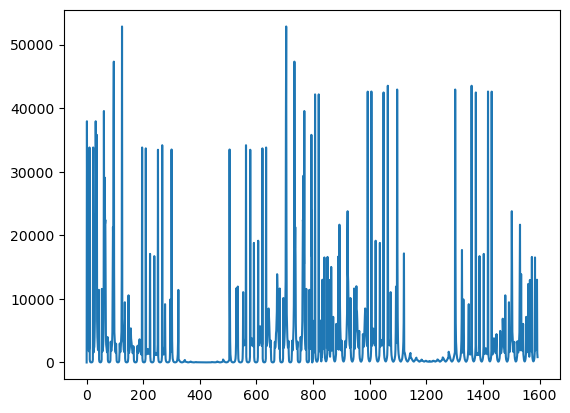

In [9]:
plt.plot(R_t_lsm[:,1])

In [10]:
plt.plot(truncate(sigma_est, r_cut, style).flatten())

NameError: name 'sigma_est' is not defined

In [175]:
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h20.npz')
gamma_est = est_params['gamma']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

print(f_est[0,1,:])
print(f_est[2,0,:])

[3704.89735097+9088.5587856j  3055.12291545+3137.59206899j]
[1158.58162652 +569.88896309j 3568.38632251+1967.34234696j]


In [151]:
f1, f2 = eigen2layer(K,r_cut, r1,r2,f_est[:,:,0][:,:,None],f_est[:,:,1][:,:,None])
print(f1[0,1,:], f2[0,1,:])
print(f1[2,0,:], f2[2,0,:])

[477.81852866+4391.33290813j] [4557.82248906+8244.86630647j]
[-2009.1408876-1164.27052363j] [2651.90945003+1422.80559971j]


In [173]:
est_params = np.load('/grad/wang3262/Proj_1_LagrangeDA/data/est_paras_ou_K128_beta22_tr.npz')
gamma_est = est_params['gamma']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

print(f_est[0,1,:])
print(f_est[2,0,:])

[2260.18385541+4063.34589082j 2567.99875041+1860.14448701j]
[2066.89512535+593.32456617j 2958.11415517  -5.01903217j]


In [155]:
f1, f2 = eigen2layer(K,r_cut, r1,r2,f_est[:,:,0][:,:,None],f_est[:,:,1][:,:,None])
print(f1[0,1,:], f2[0,1,:])
print(f1[2,0,:], f2[2,0,:])

[-228.8159566+1625.35659857j] [3255.05644509+3994.35569141j]
[-756.48349942+491.63260464j] [2829.14671424+335.44320074j]


#### DA

##### iter0

In [8]:
mu_t_lsm = mu_t_lsm[:, s_rate-1::s_rate]
mu_t_lsm.shape

(1594, 6250)

In [9]:
# reshape flattened variables to two modes matrices
psi_k_pos_lsm, tau_k_pos_lsm = mu2psi(mu_t_lsm, K, r_cut, style)

In [12]:
N = 100000

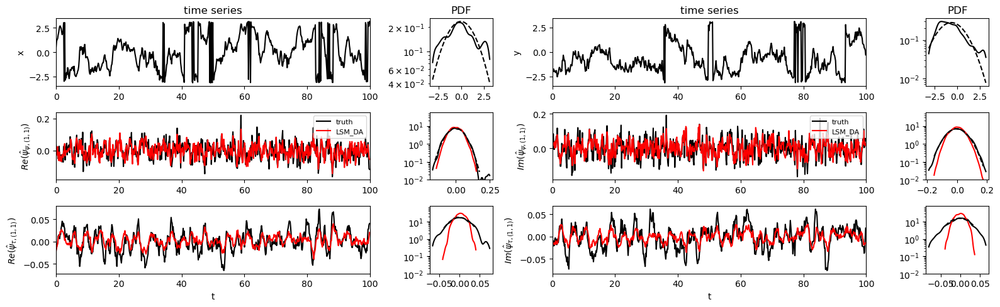

In [14]:
# Plot
sel0 = 0//s_rate; sel1 = N//s_rate # plot time range
ikx = 1; iky = 1 # mode to plot
interv = 10 # plot interval
xlim = (0,100)
ylim = (1e-2, 50)
data1 = [psi_k_t/K**2, psi_k_pos_lsm/K**2]
data2 = [tau_k_t/K**2, tau_k_pos_lsm/K**2]
labels = ['truth', 'LSM_DA', 'LSM_corr_DA']
ylabels = ['\psi', '\tau']
colors = ['k', 'r', 'c']
plot_psi_k_seriespdf(dt*s_rate, sel0, sel1, ikx, iky, interv, xlim, ylim, xt[:,:N:s_rate], yt[:,:N:s_rate], data1, data2, labels, colors)
# plt.savefig('./Lagrangian_DA/LSMDA_psi_k_K128_beta22_tr16_L256.png',dpi=100)
plt.show()

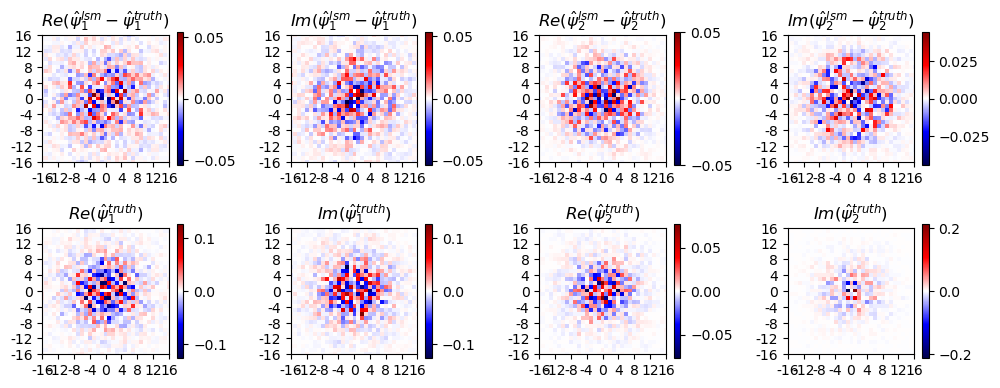

In [15]:
# plot error mode
psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

nrow, ncol = (2,4)
fig, axs = plt.subplots(nrow, ncol, figsize=(10,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:,:,0,0] = (psi1_k_pos_lsm[:, :, N//s_rate-1] - psi1_k_t[:, :, N//s_rate-1]).real / K**2
dataplot[:,:,0,1] = (psi1_k_pos_lsm[:, :, N//s_rate-1] - psi1_k_t[:, :, N//s_rate-1]).imag / K**2
dataplot[:,:,-1,0] = psi1_k_t[:, :, N//s_rate-1].real / K**2
dataplot[:,:,-1,1] = psi1_k_t[:, :, N//s_rate-1].imag / K**2
dataplot[:,:,0,2] = (psi2_k_pos_lsm[:, :, N//s_rate-1] - psi2_k_t[:, :, N//s_rate-1]).real / K**2
dataplot[:,:,0,3] = (psi2_k_pos_lsm[:, :, N//s_rate-1] - psi2_k_t[:, :, N//s_rate-1]).imag / K**2
dataplot[:,:,-1,2] = psi2_k_t[:, :, N//s_rate-1].real / K**2
dataplot[:,:,-1,3] = psi2_k_t[:, :, N//s_rate-1].imag / K**2

dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 

for i in range(nrow):
    for j in range(ncol):
        n_tick = K//8*2
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
        axs[i,j].set_xticklabels(Kx[::K//n_tick].astype(int))
        axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
        axs[i,j].set_yticklabels(Kx[::K//n_tick].astype(int))
        axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_xlim(K//2-r_cut, K//2+r_cut) 
        axs[i,j].set_ylim(K//2-r_cut, K//2+r_cut)
        fig.colorbar(im, ax=axs[i,j])
        
axs[0,0].set_title(f'$Re(\hat{{\psi}}^{{lsm}}_1 - \hat{{\psi}}^{{truth}}_1)$')
axs[0,1].set_title(f'$Im(\hat{{\psi}}^{{lsm}}_1 - \hat{{\psi}}^{{truth}}_1)$')
axs[0,2].set_title(f'$Re(\hat{{\psi}}^{{lsm}}_2 - \hat{{\psi}}^{{truth}}_2)$')
axs[0,3].set_title(f'$Im(\hat{{\psi}}^{{lsm}}_2 - \hat{{\psi}}^{{truth}}_2)$')
axs[-1,0].set_title(f'$Re(\hat{{\psi}}^{{truth}}_1)$')
axs[-1,1].set_title(f'$Im(\hat{{\psi}}^{{truth}}_1)$')
axs[-1,2].set_title(f'$Re(\hat{{\psi}}^{{truth}}_2)$')
axs[-1,3].set_title(f'$Im(\hat{{\psi}}^{{truth}}_2)$')

plt.tight_layout()
# plt.savefig('./Lagrangian_DA/LSMDA_err_psi_k_K128_beta22_tr16_L256.png', dpi=100)
plt.show()

In [16]:
psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

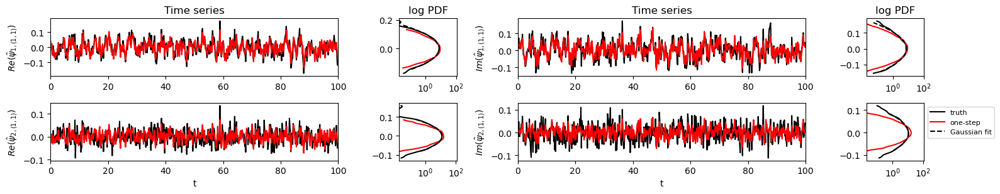

In [21]:
# Plot
sel0 = 0//s_rate; sel1 = N//s_rate # plot time range
ikx = 1; iky = 1 # mode to plot
interv = 10 # plot interval
xlim = (0,100)
ylim = (2e-2, 100)
data1 = [psi1_k_t[:,:,:]/K**2, psi1_k_pos_lsm[:,:,:]/K**2]
data2 = [psi2_k_t[:,:,:]/K**2, psi2_k_pos_lsm[:,:,:]/K**2]
labels = ['truth', 'one-step']
colors = ['k', 'r', 'b']
plot_psi1_k_seriespdf(dt*s_rate, sel0, sel1, ikx, iky, interv, xlim, ylim, xt[:,100000:N:s_rate], yt[:,100000:N:s_rate], data1, data2, labels, colors)
plt.savefig('../figure/DA_layer_k_K128_beta22_tr16_L256_h32_iter0.png',dpi=100)
plt.show()

In [19]:
psi1_k_t.shape

(128, 128, 6250)

In [20]:
psi1_k_pos_lsm.shape

(128, 128, 6250)

In [22]:
# ifft to real space
psi1_t = ifftnroll(K, psi1_k_t)
psi2_t = ifftnroll(K, psi2_k_t)
psi1_pos_lsm = ifftnroll(K, psi1_k_pos_lsm)
psi2_pos_lsm = ifftnroll(K, psi2_k_pos_lsm)

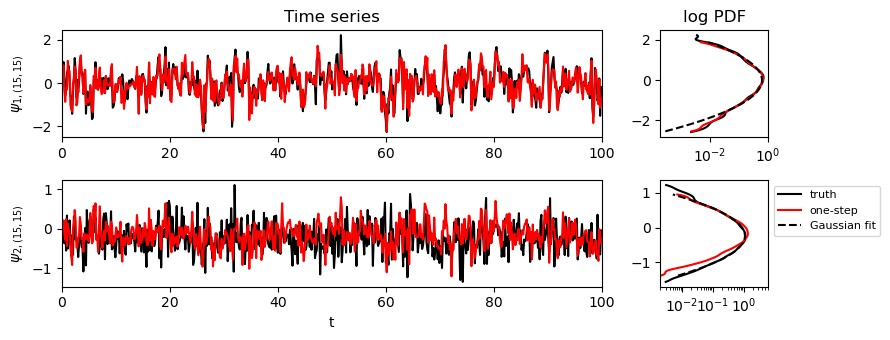

In [24]:
sel0 = 0//(s_rate); sel1 = N//(s_rate) # plot time range
xlim = (0,100)
ylim = (2e-3, 5)
ikx = 15; iky = 15 # x,y to plot
interv = 10
data1 = [psi1_t, psi1_pos_lsm]
data2 = [psi2_t, psi2_pos_lsm]
labels = ['truth', 'one-step']
colors = ['k', 'r', 'b']
plot_layer_seriespdf(dt*s_rate, sel0, sel1, ikx, iky, interv, xlim, ylim, data1, data2, labels, colors)
plt.savefig('../figure/DA_layer_K128_beta22_tr16_L256_h32_iter0.png',dpi=100)
plt.show()

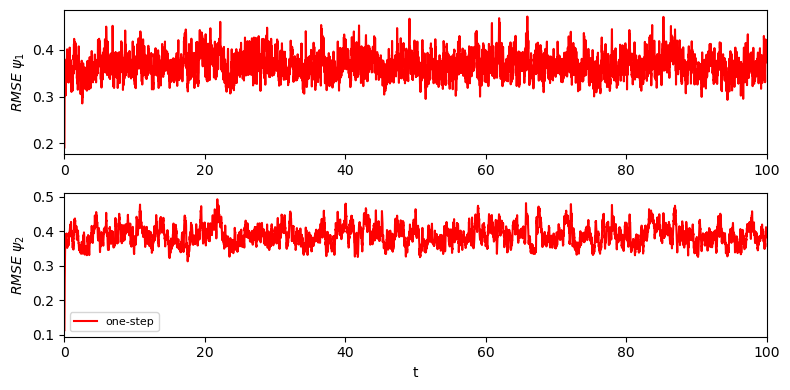

In [25]:
# Plot
rmse1_t_lsm = np.sqrt(np.mean((psi1_pos_lsm - psi1_t)**2, axis=(0,1)))
rmse2_t_lsm = np.sqrt(np.mean((psi2_pos_lsm - psi2_t)**2, axis=(0,1)))
data1 = [rmse1_t_lsm]
data2 = [rmse2_t_lsm]
interv = 1
sel0 = 0//(s_rate); sel1 = N//(s_rate) # plot time range
xlim = (0,100)
labels = ['one-step']
colors = ['r', 'b']
plot_rmses(dt, sel0, sel1, s_rate, interv, xlim, data1, data2, labels, colors)
plt.savefig('../figure/rmses_ens16_K128_beta22_tr16_real_L256_h32_iter0.png',dpi=100)
plt.show()

In [26]:
# RMSE
n_start = 0 # spin up time
rmse1_xy = np.sqrt(np.mean((psi1_pos_lsm[:,:,n_start:] - psi1_t[:,:,n_start:])**2, axis=(0,1)))
rmse2_xy = np.sqrt(np.mean((psi2_pos_lsm[:,:,n_start:] - psi2_t[:,:,n_start:])**2, axis=(0,1)))
rmse1_m = np.mean(rmse1_xy)
rmse2_m = np.mean(rmse2_xy)
print('LSM DA')
print('RMSE(upper layer):', rmse1_m)
print('RMSE(lower layer):', rmse2_m)

LSM DA
RMSE(upper layer): 0.36716248864983514
RMSE(lower layer): 0.3878134530987125


##### iter2

In [69]:
# load data of LSM
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
obs = np.load('../data/obs_K128_beta22_h40.npz')
xt = obs['xt']
yt = obs['yt']
L = 256
xt = xt[:L, :]
yt = yt[:L, :]
da_pos = np.load('../data/LSMDA_pos_K128_beta22_tr_L256_iter2.npz')
mu_t_lsm = da_pos['mu_t']
R_t_lsm = da_pos['R_t']

In [70]:
# truncate parameter
r_cut = 16
style = 'circle'

In [71]:
# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)

In [72]:
mu_t_lsm = mu_t_lsm[:, s_rate-1::s_rate]
mu_t_lsm.shape

(1594, 6250)

In [73]:
# reshape flattened variables to two modes matrices
psi_k_pos_lsm, tau_k_pos_lsm = mu2psi(mu_t_lsm, K, r_cut, style)

In [74]:
N = 100000

In [75]:
psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

In [77]:
# ifft to real space
psi1_t = ifftnroll(K, psi1_k_t)
psi2_t = ifftnroll(K, psi2_k_t)
psi1_pos_lsm = ifftnroll(K, psi1_k_pos_lsm)
psi2_pos_lsm = ifftnroll(K, psi2_k_pos_lsm)

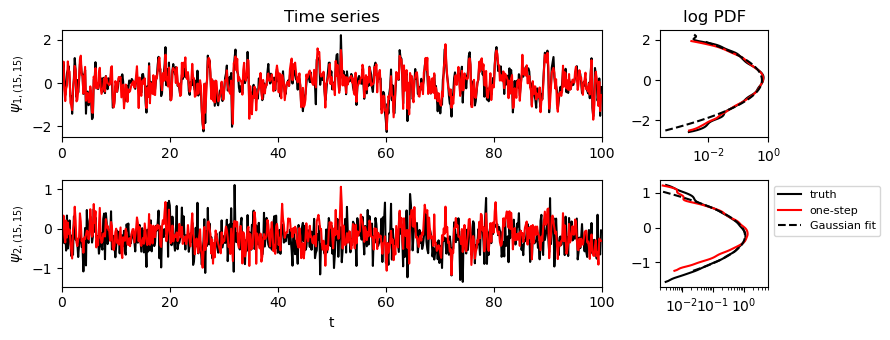

In [78]:
sel0 = 0//(s_rate); sel1 = N//(s_rate) # plot time range
xlim = (0,100)
ylim = (2e-3, 5)
ikx = 15; iky = 15 # x,y to plot
interv = 10
data1 = [psi1_t, psi1_pos_lsm]
data2 = [psi2_t, psi2_pos_lsm]
labels = ['truth', 'one-step']
colors = ['k', 'r', 'b']
plot_layer_seriespdf(dt*s_rate, sel0, sel1, ikx, iky, interv, xlim, ylim, data1, data2, labels, colors)
plt.savefig('../figure/DA_layer_K128_beta22_tr16_L256_h32_iter2.png',dpi=100)
plt.show()

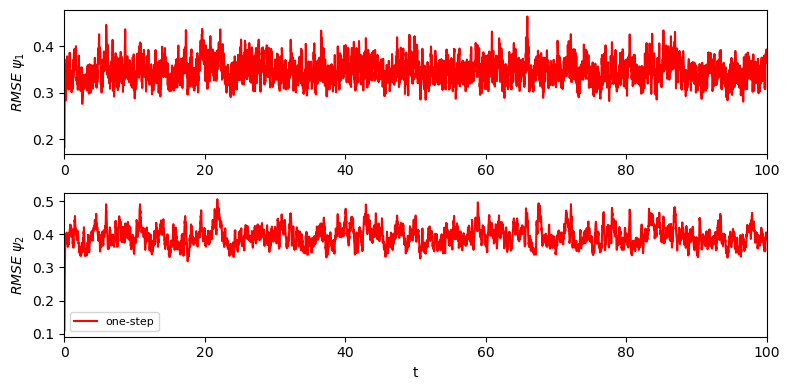

In [79]:
# Plot
rmse1_t_lsm = np.sqrt(np.mean((psi1_pos_lsm - psi1_t)**2, axis=(0,1)))
rmse2_t_lsm = np.sqrt(np.mean((psi2_pos_lsm - psi2_t)**2, axis=(0,1)))
data1 = [rmse1_t_lsm]
data2 = [rmse2_t_lsm]
interv = 1
sel0 = 0//(s_rate); sel1 = N//(s_rate) # plot time range
xlim = (0,100)
labels = ['one-step']
colors = ['r', 'b']
plot_rmses(dt, sel0, sel1, s_rate, interv, xlim, data1, data2, labels, colors)
plt.savefig('../figure/rmses_ens16_K128_beta22_tr16_real_L256_h32_iter2.png',dpi=100)
plt.show()

In [80]:
# RMSE
n_start = 0 # spin up time
rmse1_xy = np.sqrt(np.mean((psi1_pos_lsm[:,:,n_start:] - psi1_t[:,:,n_start:])**2, axis=(0,1)))
rmse2_xy = np.sqrt(np.mean((psi2_pos_lsm[:,:,n_start:] - psi2_t[:,:,n_start:])**2, axis=(0,1)))
rmse1_m = np.mean(rmse1_xy)
rmse2_m = np.mean(rmse2_xy)
print('LSM DA')
print('RMSE(upper layer):', rmse1_m)
print('RMSE(lower layer):', rmse2_m)

LSM DA
RMSE(upper layer): 0.34722467937836016
RMSE(lower layer): 0.3935652789607252


In [ ]:
# load data of LSM
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
# truncate parameter
r_cut = 16
style = 'circle'

# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)

N = 100000

# ifft to real space
psi1_t = ifftnroll(K, psi1_k_t)
psi2_t = ifftnroll(K, psi2_k_t)
psi1_pos_lsm = ifftnroll(K, psi1_k_pos_lsm)
psi2_pos_lsm = ifftnroll(K, psi2_k_pos_lsm)

# RMSE
n_start = 0 # spin up time
rmse1_xy = np.sqrt(np.mean((psi1_pos_lsm[:,:,n_start:] - psi1_t[:,:,n_start:])**2, axis=(0,1)))
rmse2_xy = np.sqrt(np.mean((psi2_pos_lsm[:,:,n_start:] - psi2_t[:,:,n_start:])**2, axis=(0,1)))
rmse1_m = np.mean(rmse1_xy)
rmse2_m = np.mean(rmse2_xy)
print('LSM DA')
print('RMSE(upper layer):', rmse1_m)
print('RMSE(lower layer):', rmse2_m)

In [16]:
# load data of LSM
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
# truncate parameter
r_cut = 16
style = 'circle'

# Truth of eigenmodes
psi_k_t, tau_k_t = layer2eigen(K, r_cut, r1, r2, psi1_k_t, psi2_k_t, style=style)
# ifft to real space
psi1_t = ifftnroll(K, psi1_k_t)
psi2_t = ifftnroll(K, psi2_k_t)

n_start = 0
iters = list(range(3))
rmses1_m_lsm = []
rmses2_m_lsm = []
for ii in iters:
    da_pos = np.load('../data/LSMDA_pos_K128_beta22_tr_L256_iter{:d}.npz'.format(ii))
    mu_t_lsm = da_pos['mu_t']
    R_t_lsm = da_pos['R_t']
    mu_t_lsm = mu_t_lsm[:, s_rate-1::s_rate]
    psi_k_pos_lsm, tau_k_pos_lsm = mu2psi(mu_t_lsm, K, r_cut, style)
    psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

    # ifft to real space
    psi1_pos_lsm = ifftnroll(K, psi1_k_pos_lsm)
    psi2_pos_lsm = ifftnroll(K, psi2_k_pos_lsm)

    rmse1_xy = np.sqrt(np.mean((psi1_pos_lsm[:,:,n_start:] - psi1_t[:,:,n_start:])**2, axis=(0,1)))
    rmse2_xy = np.sqrt(np.mean((psi2_pos_lsm[:,:,n_start:] - psi2_t[:,:,n_start:])**2, axis=(0,1)))
    rmse1_m_lsm = np.mean(rmse1_xy)
    rmse2_m_lsm = np.mean(rmse2_xy)
    rmses1_m_lsm.append(rmse1_m_lsm)
    rmses2_m_lsm.append(rmse2_m_lsm)

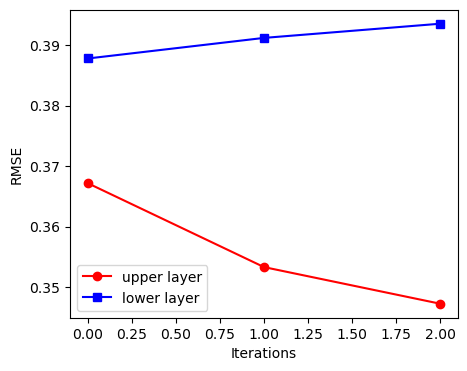

In [18]:
# Create the plot
plt.figure(figsize=(5, 4))
plt.plot(iters, rmses1_m_lsm, label='upper layer', linestyle='-', marker='o', color='red')
plt.plot(iters, rmses2_m_lsm, label='lower layer', linestyle='-', marker='s', color='blue')
plt.legend()
# plt.xscale('log', base=2)  # Set x-axis to log scale with base 2
plt.xlabel('Iterations')
plt.ylabel(r'RMSE')
# plt.xticks([16, 64, 256, 512], labels=['16', '64', '256', r'$\infty$'])
plt.savefig('../figure/rmse_iters.png', dpi=100)
plt.show()

###### Snapshots of PV flow field

In [26]:
psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

In [16]:
N = 100000
q1_k_t, q2_k_t = psi2q(psi1_k_t[:, :, -N//s_rate:], psi2_k_t[:, :, -N//s_rate:], kd, h_hat)
q1_k_t_lsm, q2_k_t_lsm = psi2q(psi1_k_pos_lsm[:, :, -N//s_rate:], psi2_k_pos_lsm[:, :, -N//s_rate:], kd, h_hat)

In [17]:
# ifft to real space
n_t = -5500
q1_k_t = inv_truncate(truncate(q1_k_t[:, :, n_t], r_cut, style)[:,None], r_cut, K, style)
q2_k_t = inv_truncate(truncate(q2_k_t[:, :, n_t], r_cut, style)[:,None], r_cut, K, style)
q1_t = ifftnroll(K, q1_k_t)[:,:,0]
q2_t = ifftnroll(K, q2_k_t)[:,:,0]
q1_t_lsm = ifftnroll(K, q1_k_t_lsm[:, :, n_t])
q2_t_lsm = ifftnroll(K, q2_k_t_lsm[:, :, n_t])

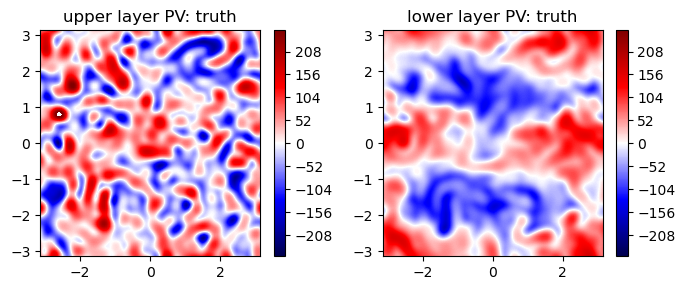

In [20]:
colorlim=(256, 256)
plot_contour_fields(q1_t, q2_t, 'truth', colorlim)
plt.savefig('./Lagrangian_DA/truth_q_beta22.png')
plt.show()

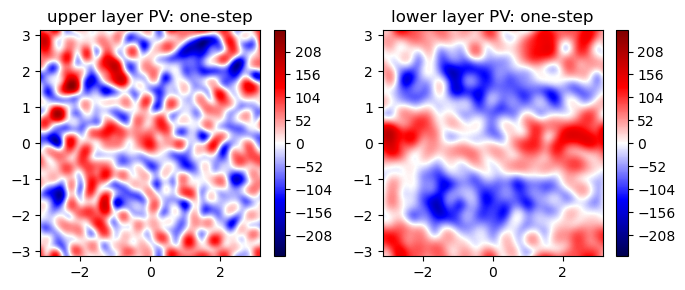

In [20]:
colorlim=(256, 256)
plot_contour_fields(q1_t_lsm, q2_t_lsm, 'one-step', colorlim)
plt.savefig('./Lagrangian_DA/LSM_q_beta22_L256.png')
plt.show()

## 3. Parameter estimation

### 3.1 Backward sampling

In [7]:
from Lagrangian_DA import sampling, back_sampling

dt = 1e-3
N = 100000
K = 128
s_rate = 16
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
# truncate parameter
r_cut = 16
style = 'circle'

da_pos = np.load('../data/LSMDA_pos_K128_beta22_tr_L256_iter1.npz')
mu_eigen_t = da_pos['mu_t']
R_eigen_t = da_pos['R_t']
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h32.npz')
gamma = est_params['gamma']
omega = est_params['omega']
f = est_params['f']
sigma = est_params['sigma']
Sigma = np.diag(truncate(sigma, r_cut, style=style).flatten(order='F')) # assume independent noise
a0 = truncate(f, r_cut, style=style).flatten(order='F')
a1 = -np.diag(truncate(gamma, r_cut, style=style).flatten(order='F')) + 1j * np.diag(truncate(omega, r_cut, style=style).flatten(order='F')) 

# sampling trajectories
noise = np.random.randn(K, K, 2, N, 1) + 1j * np.random.randn(K, K, 2, N, 1)
noise = map_conj_symm(noise, r1)
noise = truncate(noise, r_cut, style)
noise = np.transpose(np.reshape(noise, (-1, N, 1), order='F'), (1,2,0))

psitau_k_s = sampling(1, dt, mu_eigen_t, R_eigen_t, Sigma, a0, a1, noise)
psitau_k_s = psitau_k_s[0, :, :]
mu_t_s = psitau_k_s.reshape((psitau_k_s.shape[0] // 2, 2, -1), order='F')
psi_k_s = mu_t_s[:,0,:]
tau_k_s = mu_t_s[:,1,:]

### 3.2 Recalibrate models

In [11]:
psi_k_s = inv_truncate(psi_k_s[:, s_rate-1::s_rate], r_cut, K, style)
tau_k_s = inv_truncate(tau_k_s[:, s_rate-1::s_rate], r_cut, K, style)

In [12]:
# Model calibration
est_params = calibrate_OU(r1, psi_k_s, tau_k_s, K, dt*s_rate, Lag=250, r_cut=r_cut, style=style, corr_noise=False)
gamma_est = est_params['gamma']
omega_est_ccf = est_params['omega_ccf']
omega_est_acf = est_params['omega_acf']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

np.savez('../data/est_paras_ou_K128_beta22_tr_h32_iter2.npz', **est_params)

/grad/wang3262/Proj_2_DAnPE_CGKN/code/LSM_QG.py:123: OptimizeWarning: Covariance of the parameters could not be estimated
  x1, _ = curve_fit(ACF, tt, acf_psi, p0=x0, check_finite=True, maxfev=2000)
/grad/wang3262/Proj_2_DAnPE_CGKN/code/LSM_QG.py:131: OptimizeWarning: Covariance of the parameters could not be estimated
  x2, _ = curve_fit(ACF, tt, acf_tau, p0=x0, check_finite=True, maxfev=2000)


In [60]:
# iter0
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h32_iter0.npz')
gamma_est = est_params['gamma']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

# truth
print('gamma: ',np.max(gamma_est.real), np.min(gamma_est.real))
print('omega: ',np.max(omega_est.real), np.min(omega_est.real))
print('f: ',np.max(f_est.real), np.max(f_est.imag), np.min(f_est.real), np.min(f_est.imag))
print('sigma: ',np.max(sigma_est.real), np.min(sigma_est.real))

gamma:  16.219714600710876 0.0
omega:  13.051667689440505 -13.051667689440505
f:  3573.421348622543 12064.519768331886 -3342.9168053537664 -12064.519768331886
sigma:  7269.200445117369 0.0


In [54]:
# iter1 
print('gamma: ',np.max(gamma_est.real), np.min(gamma_est.real))
print('omega: ',np.max(omega_est.real), np.min(omega_est.real))
print('f: ',np.max(f_est.real), np.max(f_est.imag), np.min(f_est.real), np.min(f_est.imag))
print('sigma: ',np.max(sigma_est.real), np.min(sigma_est.real))

gamma:  30.741960517893272 0.0
omega:  13.5280241002642 -13.5280241002642
f:  3989.576188428742 8305.889917538687 -3537.4369639339557 -8305.889917538687
sigma:  6718.135976553187 0.0


In [13]:
# iter 2
print('gamma: ',np.max(gamma_est.real), np.min(gamma_est.real))
print('omega: ',np.max(omega_est.real), np.min(omega_est.real))
print('f: ',np.max(f_est.real), np.max(f_est.imag), np.min(f_est.real), np.min(f_est.imag))
print('sigma: ',np.max(sigma_est.real), np.min(sigma_est.real))

gamma:  75.51503290134181 0.0
omega:  16.78474824120832 -16.78474824120832
f:  3796.375552203457 8265.460205436098 -3506.773243564294 -8265.460205436098
sigma:  6395.800794673838 0.0


In [3]:
# truth paramaters of LSMs
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h40.npz')
gamma_est = est_params['gamma']
omega_est = est_params['omega']
f_est = est_params['f']
sigma_est = est_params['sigma']

# truth
print('gamma: ',np.max(gamma_est.real), np.min(gamma_est.real))
print('omega: ',np.max(omega_est.real), np.min(omega_est.real))
print('f: ',np.max(f_est.real), np.max(f_est.imag), np.min(f_est.real), np.min(f_est.imag))
print('sigma: ',np.max(sigma_est.real), np.min(sigma_est.real))

gamma:  15.762773015705609 0.0
omega:  12.582455583140149 -12.582455583140149
f:  3590.666700057357 9247.63207555214 -3779.702538068291 -9247.63207555214
sigma:  6065.813574601146 0.0


In [30]:
# calculate error
n_iter = list(range(3))
rmses_m_lsm = []
l2errs = []

# truth paramaters of LSMs
data_t = []
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h40.npz')
data_t.append(est_params['gamma'])
data_t.append(est_params['omega'])
data_t.append(est_params['f'])
data_t.append(est_params['sigma'])

for ii in n_iter:
    data = []
    est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h32_iter{:d}.npz'.format(ii))
    data.append(est_params['gamma'])
    data.append(est_params['omega'])
    data.append(est_params['f'])
    data.append(est_params['sigma'])

    rmse = np.zeros(4)
    l2err = np.zeros(4)
    for i in range(4):
        rmse_xy = np.sqrt(np.mean((data[i] - data_t[i])**2, axis=(0,1)))
        rmse[i] = np.mean(np.abs(rmse_xy))
        l2err[i] = np.linalg.norm(data[i] - data_t[i])

    rmses_m_lsm.append(rmse)
    l2errs.append(l2err)
rmses_m_lsm = np.array(rmses_m_lsm)
l2errs = np.array(l2errs)

# relative error
for i in range(4):
    l2errs[:, i] = l2errs[:, i] / np.linalg.norm(data_t[i])

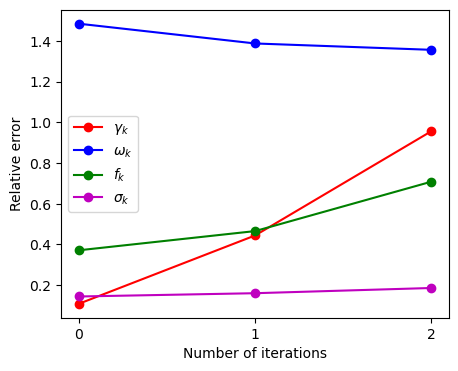

In [34]:
# Create the plot
plt.figure(figsize=(5, 4))
labels = ['$\gamma_k$', '$\omega_k$', '$f_k$', '$\sigma_k$']
colors = ['r','b','g','m']
for i in range(4):
    plt.plot(n_iter, l2errs[:, i], label=labels[i], linestyle='-', marker='o', color=colors[i])
plt.legend()
# plt.xscale('log', base=2)  # Set x-axis to log scale with base 2
plt.xticks(n_iter)
plt.xlabel('Number of iterations')
plt.ylabel(r'Relative error')
plt.savefig('../figure/paramserr_lsm.png', dpi=100)
plt.show()

In [2]:
# truncate parameter
r_cut = 16
style = 'circle'

In [4]:
dt = 1e-3
N = 100000
K = 128
s_rate = 16
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
# truncate parameter
r_cut = 16
style = 'circle'


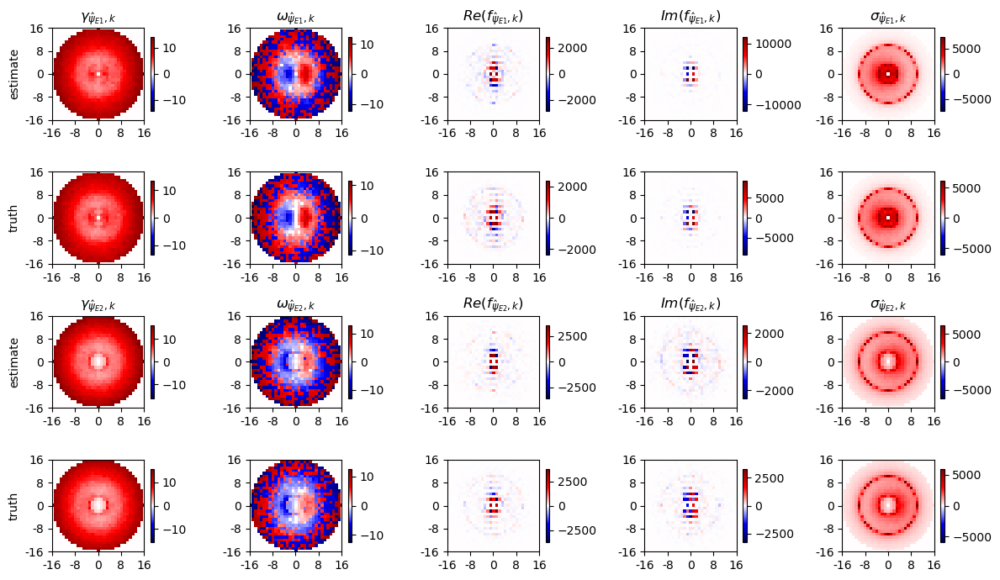

In [7]:
# Plot modes of omega
nrow = 4; ncol = 5
fig, axs = plt.subplots(nrow, ncol, figsize=(12,7))

data = []
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h32_iter0.npz')
data.append(est_params['gamma'])
data.append(est_params['omega'])
data.append(est_params['f'])
data.append(est_params['sigma'])
data_t = []
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h40.npz')
data_t.append(est_params['gamma'])
data_t.append(est_params['omega'])
data_t.append(est_params['f'])
data_t.append(est_params['sigma'])

dataplot = np.zeros((K,K,nrow, ncol))
for col in range(ncol):
    if col == 2:
        dataplot[:,:,0,col] = data[col][:,:,0].real
        dataplot[:,:,1,col] = data_t[col][:,:,0].real
        dataplot[:,:,2,col] = data[col][:,:,1].real
        dataplot[:,:,3,col] = data_t[col][:,:,1].real
    elif col == 3:
        dataplot[:,:,0,col] = data[2][:,:,0].imag
        dataplot[:,:,1,col] = data_t[2][:,:,0].imag
        dataplot[:,:,2,col] = data[2][:,:,1].imag
        dataplot[:,:,3,col] = data_t[2][:,:,1].imag
    elif col == 4:
        dataplot[:,:,0,col] = data[3][:,:,0]
        dataplot[:,:,1,col] = data_t[3][:,:,0]
        dataplot[:,:,2,col] = data[3][:,:,1]
        dataplot[:,:,3,col] = data_t[3][:,:,1]
    else:
        dataplot[:,:,0,col] = data[col][:,:,0]
        dataplot[:,:,1,col] = data_t[col][:,:,0]
        dataplot[:,:,2,col] = data[col][:,:,1]
        dataplot[:,:,3,col] = data_t[col][:,:,1]
        
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
r = r_cut

for i in range(nrow):
    for j in range(ncol):
        n_tick = K//8
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
        axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
        axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_xlim(K//2-r, K//2+r) 
        axs[i,j].set_ylim(K//2-r, K//2+r)
        fig.colorbar(im, ax=axs[i,j], shrink=0.8)

axs[0,0].set_title(r'$\gamma_{{\hat{\psi}_{E1}},k}$')
axs[0,1].set_title(r'$\omega_{{\hat{\psi}_{E1}},k}$')
axs[0,2].set_title(r'$Re(f_{{\hat{\psi}_{E1}},k})$')
axs[0,3].set_title(r'$Im(f_{{\hat{\psi}_{E1}},k})$')
axs[0,4].set_title(r'$\sigma_{{\hat{\psi}_{E1}},k}$')
axs[2,0].set_title(r'$\gamma_{{\hat{\psi}_{E2}},k}$')
axs[2,1].set_title(r'$\omega_{{\hat{\psi}_{E2}},k}$')
axs[2,2].set_title(r'$Re(f_{{\hat{\psi}_{E2}},k})$')
axs[2,3].set_title(r'$Im(f_{{\hat{\psi}_{E2}},k})$')
axs[2,4].set_title(r'$\sigma_{{\hat{\psi}_{E2}},k}$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')
axs[2,0].set_ylabel('estimate')
axs[3,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/params_k_lsm_iter0.png', dpi=100)
plt.show()

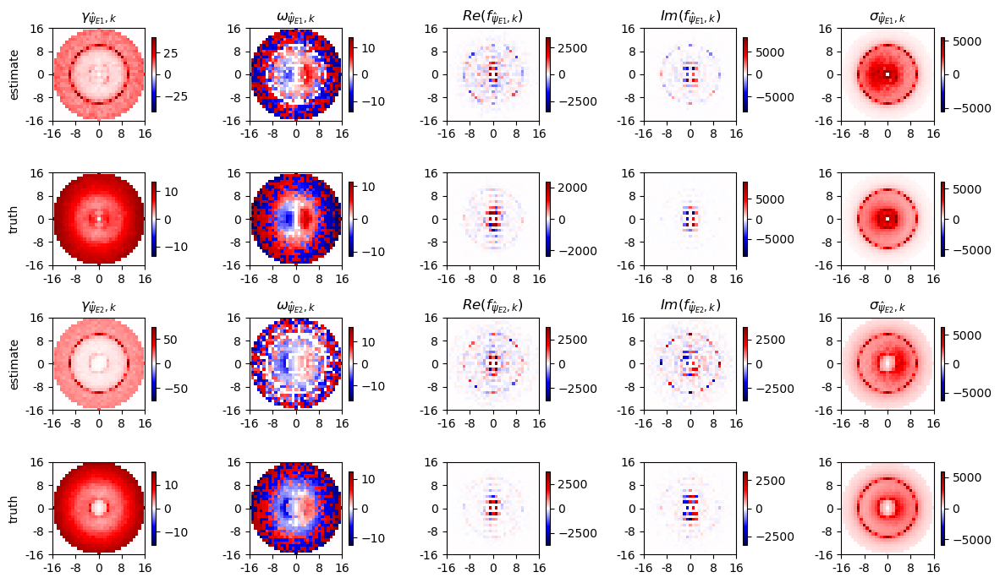

In [9]:
# Plot modes of omega
nrow = 4; ncol = 5
fig, axs = plt.subplots(nrow, ncol, figsize=(12,7))

data = []
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h32_iter2.npz')
data.append(est_params['gamma'])
data.append(est_params['omega'])
data.append(est_params['f'])
data.append(est_params['sigma'])
data_t = []
est_params = np.load('../data/est_paras_ou_K128_beta22_tr_h40.npz')
data_t.append(est_params['gamma'])
data_t.append(est_params['omega'])
data_t.append(est_params['f'])
data_t.append(est_params['sigma'])

dataplot = np.zeros((K,K,nrow, ncol))
for col in range(ncol):
    if col == 2:
        dataplot[:,:,0,col] = data[col][:,:,0].real
        dataplot[:,:,1,col] = data_t[col][:,:,0].real
        dataplot[:,:,2,col] = data[col][:,:,1].real
        dataplot[:,:,3,col] = data_t[col][:,:,1].real
    elif col == 3:
        dataplot[:,:,0,col] = data[2][:,:,0].imag
        dataplot[:,:,1,col] = data_t[2][:,:,0].imag
        dataplot[:,:,2,col] = data[2][:,:,1].imag
        dataplot[:,:,3,col] = data_t[2][:,:,1].imag
    elif col == 4:
        dataplot[:,:,0,col] = data[3][:,:,0]
        dataplot[:,:,1,col] = data_t[3][:,:,0]
        dataplot[:,:,2,col] = data[3][:,:,1]
        dataplot[:,:,3,col] = data_t[3][:,:,1]
    else:
        dataplot[:,:,0,col] = data[col][:,:,0]
        dataplot[:,:,1,col] = data_t[col][:,:,0]
        dataplot[:,:,2,col] = data[col][:,:,1]
        dataplot[:,:,3,col] = data_t[col][:,:,1]
        
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
r = r_cut

for i in range(nrow):
    for j in range(ncol):
        n_tick = K//8
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
        axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
        axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        axs[i,j].set_xlim(K//2-r, K//2+r) 
        axs[i,j].set_ylim(K//2-r, K//2+r)
        fig.colorbar(im, ax=axs[i,j], shrink=0.8)

axs[0,0].set_title(r'$\gamma_{{\hat{\psi}_{E1}},k}$')
axs[0,1].set_title(r'$\omega_{{\hat{\psi}_{E1}},k}$')
axs[0,2].set_title(r'$Re(f_{{\hat{\psi}_{E1}},k})$')
axs[0,3].set_title(r'$Im(f_{{\hat{\psi}_{E1}},k})$')
axs[0,4].set_title(r'$\sigma_{{\hat{\psi}_{E1}},k}$')
axs[0,0].set_ylabel('estimate')
axs[2,0].set_title(r'$\gamma_{{\hat{\psi}_{E2}},k}$')
axs[2,1].set_title(r'$\omega_{{\hat{\psi}_{E2}},k}$')
axs[2,2].set_title(r'$Re(f_{{\hat{\psi}_{E2}},k})$')
axs[2,3].set_title(r'$Im(f_{{\hat{\psi}_{E2}},k})$')
axs[2,4].set_title(r'$\sigma_{{\hat{\psi}_{E2}},k}$')
axs[1,0].set_ylabel('truth')
axs[2,0].set_ylabel('estimate')
axs[3,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/params_k_lsm_iter2.png', dpi=100)
plt.show()

### 3.3 Parameter estimation

In [20]:
# load data
data_path = '../data/qg/QG_DATA_topo40_nu1e-12_beta22_K128_dt1e-3_subs.mat'
with h5py.File(data_path, 'r') as file: 
    dt = file['dt'][()][0,0]
    s_rate = int(file['s_rate'][()][0,0])
    params_dataset = file['params']
    nu = params_dataset['nu'][()] [0,0]
    kd = params_dataset['kd'][()] [0,0]
    U = params_dataset['U'][()] [0,0]
    kb = params_dataset['kb'][()] [0,0]
    kappa = params_dataset['r'][()] [0,0]
    beta = kb**2
    K = int(params_dataset['N'][()] [0,0])
    H = params_dataset['H'][()] [0,0]
    topo = np.transpose(file['topo'][()], axes=(1,0))
h_hat = np.fft.fft2(topo)

In [6]:
dt = 1e-3
N = 100000
K = 128
s_rate = 16
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
# truncate parameter
r_cut = 16
style = 'circle'

In [ ]:
da_pos = np.load('../data/LSMDA_pos_K128_beta22_tr_L256_iter2.npz')
mu_t_lsm = da_pos['mu_t']

# reshape flattened variables to two modes matrices
psi_k_pos_lsm, tau_k_pos_lsm = mu2psi(mu_t_lsm, K, r_cut, style)
psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

hk = params_est(K, dt, psi1_k_pos_lsm[:, :, :10000], psi2_k_pos_lsm[:, :, :10000], kd=10, beta=22, kappa=9, nu=1e-12, U=1, r_cut=16, style='circle')

In [3]:
hk = np.load('../data/hk_iter2.npy')

In [25]:
h_lsm = np.fft.ifft2(hk[:, :, 0])
ht = np.fft.ifft2(h_hat)

/tmp/ipykernel_3600070/3312362855.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_lsm
/tmp/ipykernel_3600070/3312362855.py:11: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 1, 2] = ht


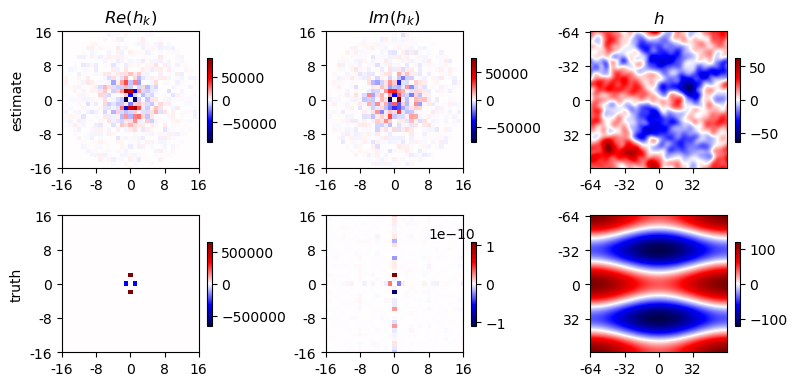

In [37]:
# Plot modes of omega
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk[:, :, 0].real
dataplot[:, :, 0, 1] = hk[:, :, 0].imag
dataplot[:, :, 0, 2] = h_lsm
dataplot[:, :, 1, 0] = h_hat.real
dataplot[:, :, 1, 1] = h_hat.imag
dataplot[:, :, 1, 2] = ht
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
r = r_cut

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        if j<2:
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r, K//2+r) 
            axs[i,j].set_ylim(K//2-r, K//2+r)
        else:
            n_tick = K//32
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/hk_lsm_iter2.png', dpi=100)
plt.show()

In [ ]:
from param_est import params_est

dt = 1e-3
N = 100000
K = 128
s_rate = 16
eigens = np.load('../data/eigens_K128_beta22.npz')
r1 = eigens['r1']
r2 = eigens['r2']
# truncate parameter
r_cut = 16
style = 'circle'

# da_pos = np.load('../data/LSMDA_pos_K128_beta22_tr_L256_iter2.npz')
# mu_t_lsm = da_pos['mu_t']

# # reshape flattened variables to two modes matrices
# psi_k_pos_lsm, tau_k_pos_lsm = mu2psi(mu_t_lsm, K, r_cut, style)
# psi1_k_pos_lsm, psi2_k_pos_lsm = eigen2layer(K,r_cut,r1,r2,psi_k_pos_lsm,tau_k_pos_lsm,style)

# hk = params_est(K, dt, psi1_k_pos_lsm[:, :, :10000], psi2_k_pos_lsm[:, :, :10000], kd=10, beta=22, kappa=9, nu=1e-12, U=1, r_cut=16, style='circle')

data_path = '../data/qg/QG_DATA_topo40_nu1e-12_beta22_K128_dt1e-3_subs.mat'
with h5py.File(data_path, 'r') as file:
    print("Keys: %s" % file.keys())
    psi1_k_t = np.transpose(file['psi_1_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
    psi2_k_t = np.transpose(file['psi_2_t'][()], axes=(2, 1, 0)) # reorder the dimensions from Python's row-major order back to MATLAB's column-major order 
psi1_k_t = psi1_k_t['real'] + 1j * psi1_k_t['imag']
psi2_k_t = psi2_k_t['real'] + 1j * psi2_k_t['imag']
dt = dt*s_rate

hk = params_est(K, dt, psi1_k_t, psi2_k_t, kd=10, beta=22, kappa=9, nu=1e-12, U=1, r_cut=16, style='circle')

np.save('../data/hk_truth.npy', hk)

In [5]:
hk = np.load('../data/hk_truth.npy')

In [6]:
h_lsm = np.fft.ifft2(hk[:, :, 0])
ht = np.fft.ifft2(h_hat)

/tmp/ipykernel_3373177/2013100525.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 0, 2] = h_lsm
/tmp/ipykernel_3373177/2013100525.py:11: ComplexWarning: Casting complex values to real discards the imaginary part
  dataplot[:, :, 1, 2] = ht


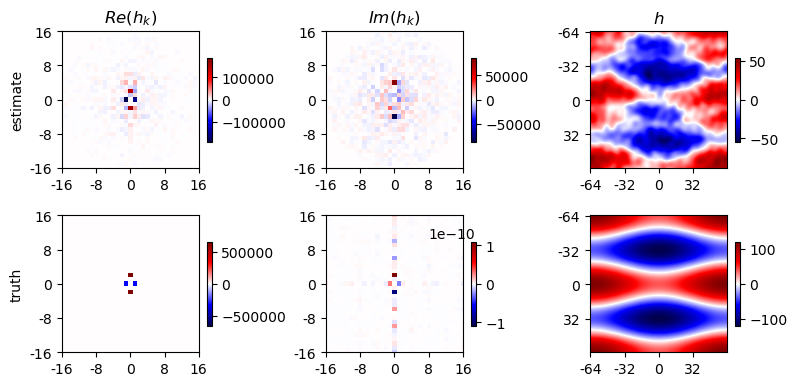

In [7]:
# Plot modes of omega
nrow = 2; ncol = 3
fig, axs = plt.subplots(nrow, ncol, figsize=(8,4))

dataplot = np.zeros((K,K,nrow,ncol))
dataplot[:, :, 0, 0] = hk[:, :, 0].real
dataplot[:, :, 0, 1] = hk[:, :, 0].imag
dataplot[:, :, 0, 2] = h_lsm
dataplot[:, :, 1, 0] = h_hat.real
dataplot[:, :, 1, 1] = h_hat.imag
dataplot[:, :, 1, 2] = ht
dataplot = np.roll(dataplot, shift=K//2, axis=0)
dataplot = np.roll(dataplot, shift=K//2, axis=1)
Kx = np.fft.fftfreq(K) * K
Kx_shift = np.roll(Kx, shift=K//2, axis=0) 
r = r_cut

for i in range(nrow):
    for j in range(ncol):
        maxabs = np.max(abs(dataplot[:, :, i, j]))
        im = axs[i,j].imshow(dataplot[:, :, i, j], cmap='seismic', vmin=-maxabs, vmax=maxabs)
        if j<2:
            n_tick = K//8
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_xlim(K//2-r, K//2+r) 
            axs[i,j].set_ylim(K//2-r, K//2+r)
        else:
            n_tick = K//32
            axs[i,j].set_xticks(np.linspace(0, K, num=n_tick, endpoint=False)) 
            axs[i,j].set_yticks(np.linspace(0, K, num=n_tick, endpoint=False))
            axs[i,j].set_xticklabels(Kx_shift[::K//n_tick].astype(int))
            axs[i,j].set_yticklabels(Kx_shift[::K//n_tick].astype(int))
        fig.colorbar(im, ax=axs[i,j], shrink=0.6)

axs[0,0].set_title(r'$Re(h_{k})$')
axs[0,1].set_title(r'$Im(h_{k})$')
axs[0,2].set_title(r'$h$')
axs[0,0].set_ylabel('estimate')
axs[1,0].set_ylabel('truth')

plt.tight_layout()
plt.savefig('../figure/hk_lsm_truthdata.png', dpi=100)
plt.show()